<a href="https://colab.research.google.com/github/TonioFlag/Teoria-de-Colas-y-Simulacion/blob/main/Caso-3/Analisis-de-entrada-intento-fallido.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install SciPy
!pip install distfit
!pip install pingouin

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 779.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.6/198.6 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for littleutils: filename=littleutils-0.2.2-py3-none-any.whl size=7029 sha256=c1ab1886147caebb00fe089affbba65344b1e54c46131c9a6f6bd24d4c74e83b
  Stored in directory: /root/.cache/pip/wheels/3d/fe/b0/27a9892da57472e538c7452a721a9cf463cc03cf7379889266
Successfully built littleutils


In [ ]:
import scipy.stats as stats
from scipy.cluster.vq import whiten, kmeans, vq, kmeans2
import pandas as pd
import numpy as np
from datetime import datetime
import time
from distfit import distfit
import matplotlib.pyplot as plt
from scipy.stats import expon
import seaborn as sns
import pingouin as pg
from scipy.stats import chisquare
from scipy.stats import f_oneway
from scipy.stats import tukey_hsd

In [ ]:
servicio=pd.read_excel('/content/drive/MyDrive/Actual/COLAS/Tasas de servicio.xlsx')
arribo=pd.read_excel('/content/drive/MyDrive/Actual/COLAS/Tasas de arribo.xlsx')
#=SI(J2*24<=15,1,SI(J2*24<=16,2,SI(J2*24<=17,3,SI(J2*24<=18,4,SI(J2*24<=19,5,SI(J2*24<=20,6,SI(J2*24<=21,7,SI(J2*24<=22,8,0))))))))
#=SI(J2*24<=14,0,SI(J2*24<=15,1,SI(J2*24<=16,2,SI(J2*24<=17,3,SI(J2*24<=18,4,SI(J2*24<=19,5,SI(J2*24<=20,6,SI(J2*24<=21,7,SI(J2*24<=22,8,0)))))))))

In [ ]:
info_chi=pd.read_excel('/content/drive/MyDrive/Actual/COLAS/Tasas de arribo.xlsx',sheet_name="Hoja2")
info_chi.set_index('Unnamed: 0', inplace=True)
info_chi.index.name=None

In [ ]:
num=[]
for i in arribo['dia']:
  if i=="Lunes":
    num.append(1)
  elif i=="Martes":
    num.append(2)
  elif i=="Miercoles":
    num.append(3)
  elif i=="Jueves":
    num.append(4)
  elif i=="Sabado":
    num.append(6)
  elif i=="Viernes":
    num.append(5)
  elif i=="Domingo":
    num.append(7)

arribo['num_dia']=num

In [ ]:
intervalos=5
amplitud=arribo.min_cliente.max()-arribo.min_cliente.min()
intervalo=amplitud/5
clasificacion=[]
for i in arribo.min_cliente:
  if i <= intervalo: clasificacion.append(1)
  elif i <= 2*intervalo: clasificacion.append(2)
  elif i <= 3*intervalo: clasificacion.append(3)
  elif i <= 4*intervalo: clasificacion.append(4)
  elif i <= 5*intervalo: clasificacion.append(5)

arribo['clase']=clasificacion

#Test de independecia, intervalos de confianza

In [ ]:
cosas=["Mes","dia","TipoServ.","Turno","intervalo_1","Cuadrilla"]
base=arribo
kruskal=pd.DataFrame()
for i in cosas:
  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])

In [ ]:
kruskal

,Source,ddof1,H,p-unc
Kruskal,Mes,2,0.143662,0.930688
Kruskal,dia,4,2.738203,0.602546
Kruskal,TipoServ.,4,3.535563,0.472491
Kruskal,Turno,0,0.000000,NaN
Kruskal,intervalo_1,7,23.131863,0.001617
Kruskal,Cuadrilla,0,0.000000,NaN


In [ ]:
levene=pd.DataFrame()
for i in range(len(cosas)):
  if i==0:
    levene['Source']=cosas[i]
  levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=cosas[i]))])
  levene['Source'][i]=cosas[i]

In [ ]:
levene

,Source,W,pval,equal_var
levene,Mes,2.106338,1.217450e-01,True
levene,dia,0.547413,7.723694e-01,True
levene,TipoServ.,2.044942,8.531060e-02,True
levene,Turno,64.047021,1.371713e-15,False
levene,intervalo_1,20.269096,1.137095e-30,False


In [ ]:
pruebavar=pd.DataFrame()
for i in range(len(cosas)):
  if i==0:
    pruebavar['Source']=cosas[i]
  pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=cosas[i], method="bartlett", alpha=.05)])
  pruebavar['Source'][i]=cosas[i]

In [ ]:
pruebavar

,Source,T,pval,equal_var
bartlett,Mes,17.513091,1.574275e-04,False
bartlett,dia,13.953087,3.016462e-02,False
bartlett,TipoServ.,58.930979,4.865289e-12,False
bartlett,Turno,247.132031,1.095714e-55,False
bartlett,intervalo_1,561.838160,3.720765e-116,False


In [ ]:
def elchi(x):
  return chisquare(pd.crosstab(arribo[x],arribo['clase']))

In [ ]:
chisquare(pd.crosstab(arribo["Mes"],arribo['clase']))

Power_divergenceResult(statistic=array([10.94528875,  2.51335312,  2.30379747,  1.85714286,  2.        ]), pvalue=array([0.00420011, 0.2845983 , 0.31603613, 0.39511776, 0.36787944]))

In [ ]:
for i in cosas:
  print(elchi(i))
  print(i)

Power_divergenceResult(statistic=array([10.94528875,  2.51335312,  2.30379747,  1.85714286,  2.        ]), pvalue=array([0.00420011, 0.2845983 , 0.31603613, 0.39511776, 0.36787944]))
Mes
Power_divergenceResult(statistic=array([88.85283688, 10.54599407,  3.3164557 ,  9.        ,  4.        ]), pvalue=array([5.24383511e-17, 1.03463061e-01, 7.68207346e-01, 1.73578071e-01,
       6.76676416e-01]))
dia
Power_divergenceResult(statistic=array([4.04683941e+03, 3.85836795e+02, 3.57468354e+01, 3.14285714e+00,
       5.33333333e+00]), pvalue=array([0.00000000e+00, 3.19318049e-82, 3.26229975e-07, 5.34209624e-01,
       2.54772654e-01]))
TipoServ.
Power_divergenceResult(statistic=array([ 2.34245187, 28.25519288,  6.69620253, 10.28571429,  3.        ]), pvalue=array([1.25891266e-01, 1.06328994e-07, 9.66184787e-03, 1.34064112e-03,
       8.32645167e-02]))
Turno
Power_divergenceResult(statistic=array([1.27044780e+04, 5.63780415e+02, 6.98987342e+01, 2.84285714e+01,
       1.20000000e+01]), pvalue=array

In [ ]:
pg.pairwise_corr(data=arribo,columns=["dia_mes","num_dia","Turno","intervalo_1","Cliente","min_cliente"],method="kendall")

,X,Y,method,alternative,n,r,CI95%,p-unc,power
0,dia_mes,num_dia,kendall,two-sided,8666,-0.032556,"[-0.05, -0.01]",2.935054e-05,0.858002
1,dia_mes,Turno,kendall,two-sided,8666,0.014867,"[-0.01, 0.04]",9.561019e-02,0.282697
2,dia_mes,intervalo_1,kendall,two-sided,8666,-0.014480,"[-0.04, 0.01]",7.128020e-02,0.270709
3,dia_mes,Cliente,kendall,two-sided,8666,0.118992,"[0.1, 0.14]",1.832607e-59,1.000000
4,dia_mes,min_cliente,kendall,two-sided,8666,-0.071496,"[-0.09, -0.05]",9.870171e-23,0.999999
5,num_dia,Turno,kendall,two-sided,8666,0.008954,"[-0.01, 0.03]",3.398984e-01,0.132586
6,num_dia,intervalo_1,kendall,two-sided,8666,-0.004260,"[-0.03, 0.02]",6.139140e-01,0.068193
7,num_dia,Cliente,kendall,two-sided,8666,-0.001381,"[-0.02, 0.02]",8.576145e-01,0.051892
8,num_dia,min_cliente,kendall,two-sided,8666,-0.001044,"[-0.02, 0.02]",8.916500e-01,0.051080
9,Turno,intervalo_1,kendall,two-sided,8666,-0.833317,"[-0.84, -0.83]",0.000000e+00,1.000000


In [ ]:
arribo.groupby(['TipoServ.'])['min_cliente'].count()

TipoServ.
Cambio Plan     994
Cancelacion    1038
Facturacion    1044
Otro           1385
Tecnica        4205
Name: min_cliente, dtype: int64

#Gráficos de disperción

In [ ]:
arribo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8666 entries, 0 to 8665
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Mes          8666 non-null   object 
 1   dia          8666 non-null   object 
 2   dia_mes      8666 non-null   int64  
 3   Cliente      8666 non-null   int64  
 4   TipoServ.    8666 non-null   object 
 5   Servidor     8666 non-null   object 
 6   Turno        8666 non-null   int64  
 7   Cuadrilla    8666 non-null   int64  
 8   min_cliente  8666 non-null   float64
 9   Llegada      8666 non-null   object 
 10  intervalo_1  8666 non-null   int64  
 11  intervalo_2  8666 non-null   int64  
 12  num_dia      8666 non-null   int64  
dtypes: float64(1), int64(7), object(5)
memory usage: 880.3+ KB


In [ ]:
tiposervicio=["Tecnica","Otro","Cancelacion","Facturacion","Cambio Plan"]
ejes=["min_cliente","dia_mes","num_dia","Cuadrilla","Turno"]

In [ ]:
def dispercion(evaluando):
  x=len(arribo[(arribo['TipoServ.']==evaluando)]['min_cliente'])-1
  return plt.scatter(arribo[(arribo['TipoServ.']==evaluando)]['min_cliente'][:x], arribo[(arribo['TipoServ.']==evaluando)]['min_cliente'][1:],label=evaluando,s=8,alpha=0.7)

In [ ]:
def dispercion_2(evaluando):
  x=len(arribo[(arribo['TipoServ.']==evaluando)]['min_cliente'])-1
  return plt.scatter(arribo[(arribo['TipoServ.']==evaluando)]["Cliente"],arribo[(arribo['TipoServ.']==evaluando)]['min_cliente'],label=evaluando,s=8,alpha=0.8)

In [ ]:
arribo.groupby("TipoServ.")["TipoServ."].count()

TipoServ.
Cambio Plan     994
Cancelacion    1038
Facturacion    1044
Otro           1385
Tecnica        4205
Name: TipoServ., dtype: int64

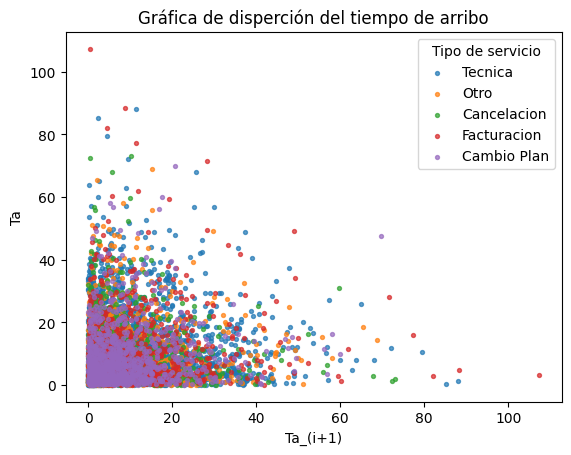

In [ ]:
for x in tiposervicio:
  dispercion(x)
plt.legend(title="Tipo de servicio")
plt.xlabel("Ta_(i+1)")
plt.ylabel("Ta")
plt.title("Gráfica de disperción del tiempo de arribo")
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

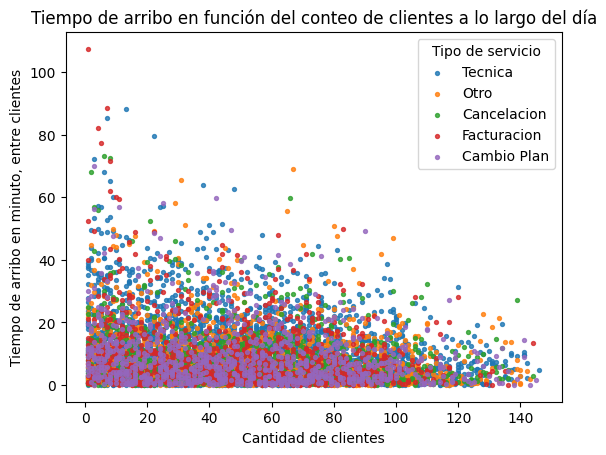

In [ ]:
for x in range(len(tiposervicio)):
  dispercion_2(tiposervicio[x])
plt.legend(title="Tipo de servicio")
plt.title("Tiempo de arribo en función del conteo de clientes a lo largo del día")
plt.xlabel("Cantidad de clientes")
plt.ylabel("Tiempo de arribo en minuto, entre clientes")
plt.show

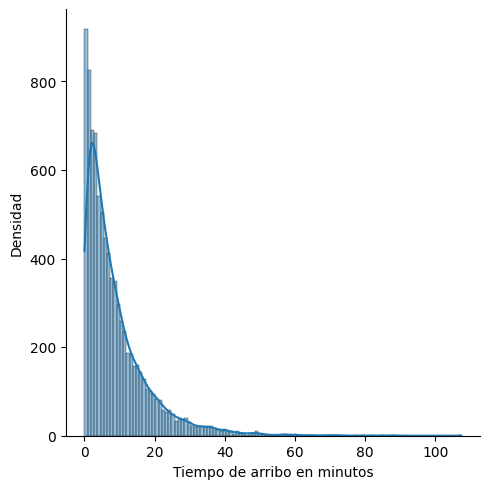

In [ ]:
gra=sns.displot(data=arribo,x="min_cliente",kde=True)
gra.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
gra.set_titles("Histograma del tiempo de arribo")

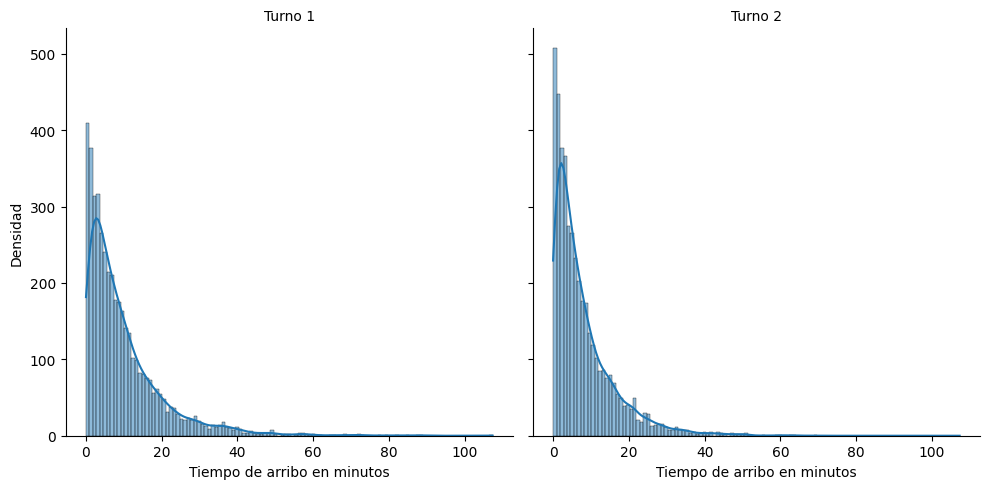

In [ ]:
g = sns.displot(data=arribo,x="min_cliente",col="Turno",kde=True)
g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
g.set_titles("Turno {col_name}")

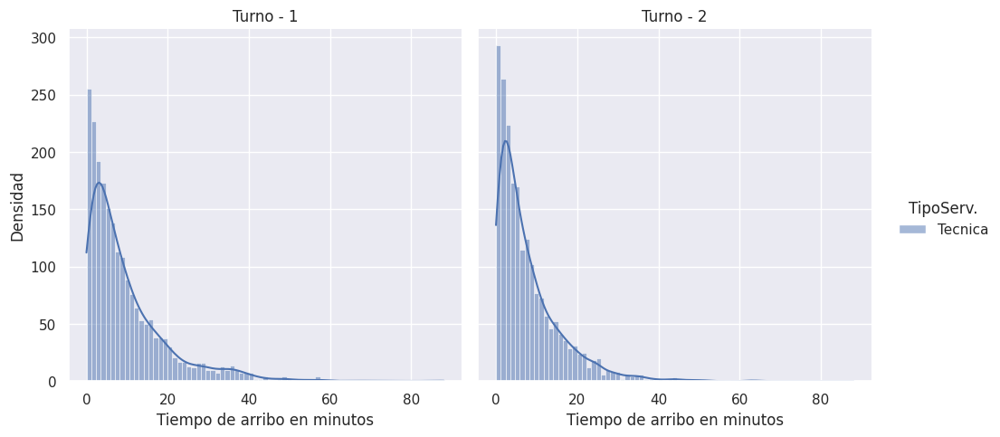

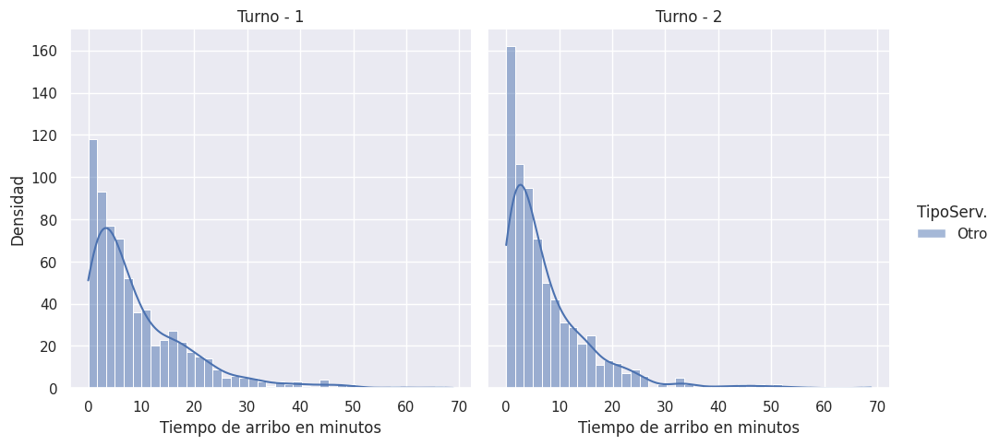

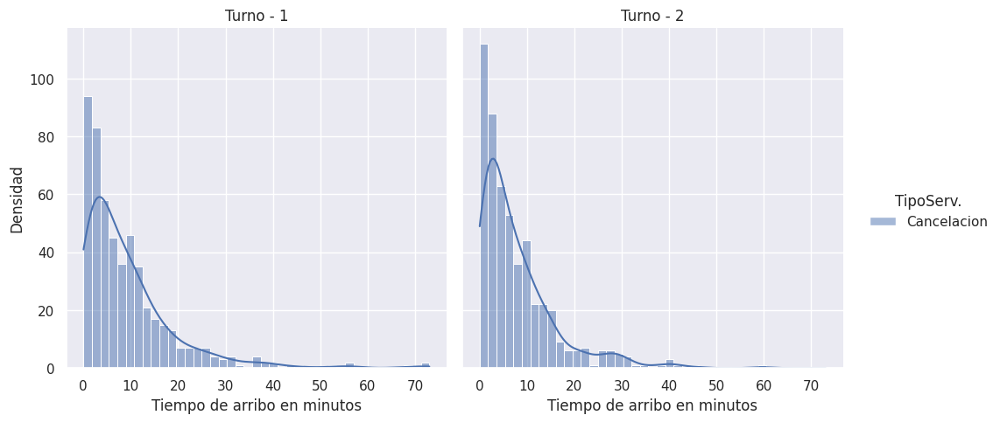

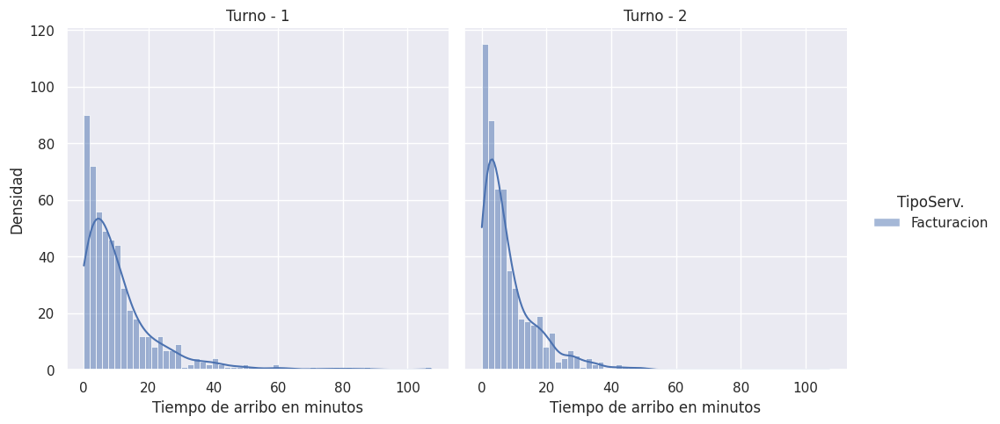

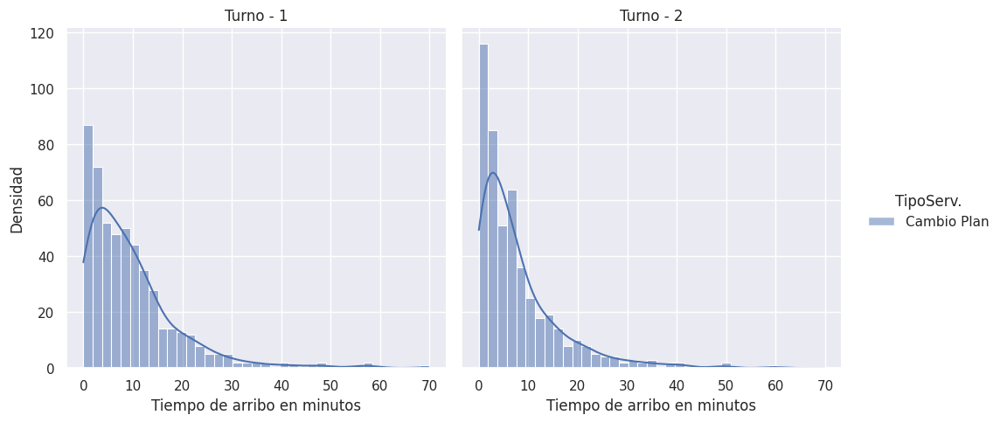

In [ ]:
for Y in tiposervicio:
  g = sns.displot(data=arribo[(arribo["TipoServ."]==Y)],x="min_cliente",col="Turno",hue="TipoServ.",kde=True)
  g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
  g.set_titles("Turno - {col_name}")

#Test de independia y homogeneidad una vez hallado los primeros clusteres

#**Tripletas de las pruebas para cada cosa, es decir, los Source**

In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1","intervalo_2"]
kruskal=pd.DataFrame()
turno=[]
serv=[]
par=[]
for x in [1,2]:
  for Y in range(len(tiposervicio)):
    for Z in range(len(tiposervicio)):
      for w in range(len(tiposervicio)):
        for i in range(len(cosas)):
          if Y<Z and Z<w:
            base=arribo[(arribo['TipoServ.']==tiposervicio[Z])|(arribo['TipoServ.']==tiposervicio[Y])|(arribo['TipoServ.']==tiposervicio[w])&(arribo['Turno']==x)]
            kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=cosas[i])])
            turno.append(x)
            serv.append(Y)
            mete=(tiposervicio[Y],tiposervicio[Z],tiposervicio[w])
            par.append(mete)
kruskal['Tripleta']=par
kruskal['Turno']=turno
result=[]
for i in kruskal['p-unc']:
  if i<=5e-02:
    result.append(False)
  else:
    result.append(True)
kruskal["Independencia"]=result

In [ ]:
kruskal[(kruskal["Independencia"]==True)&(kruskal["Source"]=="TipoServ.")&(kruskal['Turno']==1)]

,Source,ddof1,H,p-unc,Tripleta,Turno,Independencia
Kruskal,TipoServ.,2,3.724697,0.155307,"(Tecnica, Otro, Cancelacion)",1,True


In [ ]:
trip=[]
stat=[]
p_val=[]
turno=[]
for Y in range(len(tiposervicio)):
  for Z in range(len(tiposervicio)):
    for w in range(len(tiposervicio)):
      for x in [1,2]:
        if Y<Z and Z<w:
          statistic, p_value = f_oneway(arribo[(arribo['TipoServ.']==tiposervicio[Z])&(arribo['Turno']==x)]['min_cliente'],arribo[(arribo['TipoServ.']==tiposervicio[Y])&(arribo['Turno']==x)]['min_cliente'], arribo[(arribo['TipoServ.']==tiposervicio[w])&(arribo['Turno']==x)]['min_cliente'])
          mete=(tiposervicio[Y],tiposervicio[Z],tiposervicio[w])
          trip.append(mete)
          stat.append(statistic)
          p_val.append(p_value)
          turno.append(x)
Anova=pd.DataFrame()
Anova["Prueba"]="ANOVA"
Anova["Tripleta"]=trip
Anova["Turno"]=turno
Anova["statistic"]=stat
Anova["p-val"]=p_val
Anova["Prueba"]="ANOVA"
result=[]
for i in Anova["p-val"]:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['Homogeneidad']=result

In [ ]:
Anova[(Anova['Homogeneidad']==True)&(Anova['Turno']==1)]

,Prueba,Tripleta,Turno,statistic,p-val,Homogeneidad
0,ANOVA,"(Tecnica, Otro, Cancelacion)",1,0.654857,0.519584,True
4,ANOVA,"(Tecnica, Otro, Cambio Plan)",1,0.293823,0.745428,True
8,ANOVA,"(Tecnica, Cancelacion, Cambio Plan)",1,0.500599,0.606215,True
14,ANOVA,"(Otro, Cancelacion, Cambio Plan)",1,0.249307,0.779370,True


In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1","intervalo_2"]
levene=pd.DataFrame()
turno=[]
serv=[]
par=[]
Source=[]
for x in [1,2]:
  for Y in range(len(tiposervicio)):
    for Z in range(len(tiposervicio)):
      for w in range(len(tiposervicio)):
        for i in range(len(cosas)):
          if Y<Z and Z<w:
            base=arribo[(arribo['TipoServ.']==tiposervicio[Z])|(arribo['TipoServ.']==tiposervicio[Y])|(arribo['TipoServ.']==tiposervicio[w])&(arribo['Turno']==x)]
            levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(base, dv='min_cliente', group=cosas[i]))])
            turno.append(x)
            serv.append(Y)
            Source.append(cosas[i])
            mete=(tiposervicio[Y],tiposervicio[Z],tiposervicio[w])
            par.append(mete)
levene['Source']=Source
levene['Tripleta']=par
levene['Turno']=turno

In [ ]:
levene[(levene['equal_var']==True)&(levene['Source']=="TipoServ.")&(levene['Turno']==1)]

,W,pval,equal_var,Source,Tripleta,Turno
levene,0.558743,0.571957,True,TipoServ.,"(Tecnica, Otro, Cancelacion)",1
levene,0.405737,0.666504,True,TipoServ.,"(Tecnica, Otro, Cambio Plan)",1
levene,0.599278,0.549242,True,TipoServ.,"(Tecnica, Cancelacion, Cambio Plan)",1
levene,2.514411,0.080999,True,TipoServ.,"(Tecnica, Facturacion, Cambio Plan)",1
levene,0.560579,0.570940,True,TipoServ.,"(Otro, Cancelacion, Cambio Plan)",1
levene,2.570912,0.076638,True,TipoServ.,"(Otro, Facturacion, Cambio Plan)",1
levene,2.678261,0.068873,True,TipoServ.,"(Cancelacion, Facturacion, Cambio Plan)",1


In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1","intervalo_2"]
pruebavar=pd.DataFrame()
source=[]
turno=[]
par=[]
tiposervicio2=["Otro","Cancelacion","Facturacion","Cambio Plan"]
for Y in range(len(tiposervicio)):
  for Z in range(len(tiposervicio)):
    for w in range(len(tiposervicio)):
      for x in [1,2]:
        for i in range(len(cosas)):
          if Y<Z and Z<w:
            source.append(cosas[i])
            turno.append(x)
            mete=(tiposervicio[Y],tiposervicio[Z],tiposervicio[w])
            par.append(mete)
            base=arribo[(arribo['TipoServ.']==tiposervicio[Y])|(arribo['TipoServ.']==tiposervicio[Z])|(arribo['TipoServ.']==tiposervicio[w])&(arribo['Turno']==x)]
            pruebavar=pd.concat([pruebavar,pg.homoscedasticity(base, dv="min_cliente", group=cosas[i], method="bartlett", alpha=.05)])
      pruebavar["Source"]=source
      pruebavar["Turno"]=turno
      pruebavar["Tripleta"]=par

In [ ]:
pruebavar[(pruebavar["equal_var"]==True)&(pruebavar['Source']=="TipoServ.")&(pruebavar['Turno']==1)]

,Source,Turno,Tripleta,T,pval,equal_var
bartlett,TipoServ.,1,"(Tecnica, Otro, Cambio Plan)",1.852807,0.395975,True
bartlett,TipoServ.,1,"(Tecnica, Cancelacion, Cambio Plan)",0.786265,0.674939,True
bartlett,TipoServ.,1,"(Otro, Cancelacion, Cambio Plan)",1.493034,0.474015,True


#**Gráficas para observar los anterior**

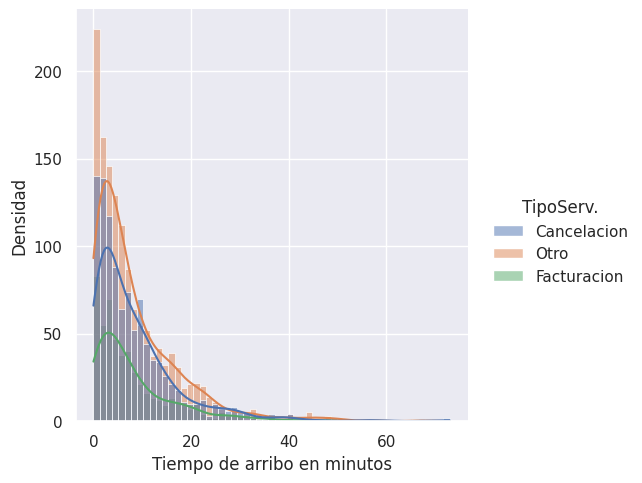

In [ ]:
base=arribo[(arribo['TipoServ.']=="Otro")|(arribo['TipoServ.']=="Cancelacion")|(arribo['TipoServ.']=="Facturacion")&(arribo['Turno']==2)]
g = sns.displot(data=base,x="min_cliente",hue="TipoServ.",kde=True)
g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
g.set_titles("Tipo de servicio - {col_name}")

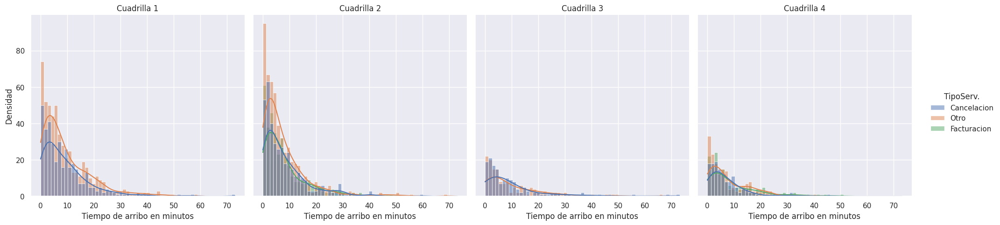

In [ ]:
base=arribo[(arribo['TipoServ.']=="Otro")|(arribo['TipoServ.']=="Cancelacion")|(arribo['TipoServ.']=="Facturacion")&(arribo['Turno']==2)]
g = sns.displot(data=base,x="min_cliente",col="Cuadrilla",hue="TipoServ.",kde=True)
g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
g.set_titles("Cuadrilla {col_name}")

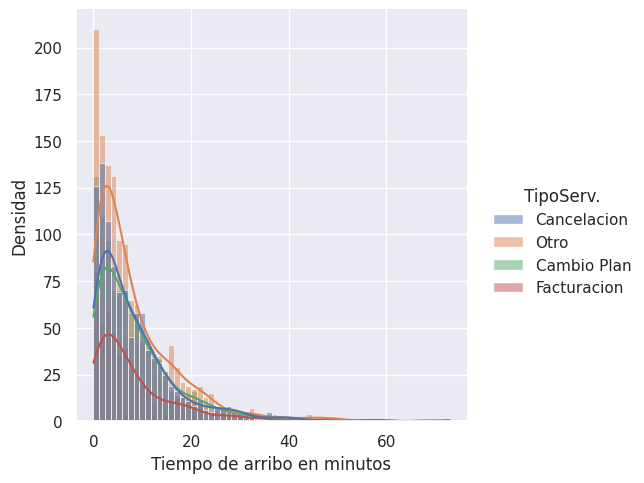

In [ ]:
base=arribo[(arribo['TipoServ.']=="Otro")|(arribo['TipoServ.']=="Cancelacion")|(arribo['TipoServ.']=="Cambio Plan")|(arribo['TipoServ.']=="Facturacion")&(arribo['Turno']==2)]
g = sns.displot(data=base,x="min_cliente",hue="TipoServ.",kde=True)
g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
g.set_titles("Tipo de servicio - {col_name}")

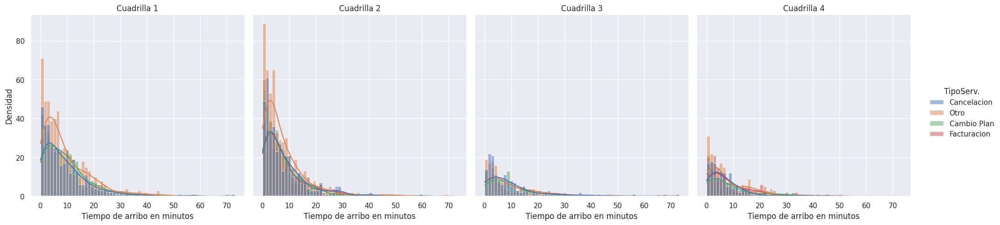

In [ ]:
base=arribo[(arribo['TipoServ.']=="Otro")|(arribo['TipoServ.']=="Cancelacion")|(arribo['TipoServ.']=="Cambio Plan")|(arribo['TipoServ.']=="Facturacion")&(arribo['Turno']==2)]
g = sns.displot(data=base,x="min_cliente",col="Cuadrilla",hue="TipoServ.",kde=True)
g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
g.set_titles("Cuadrilla {col_name}")

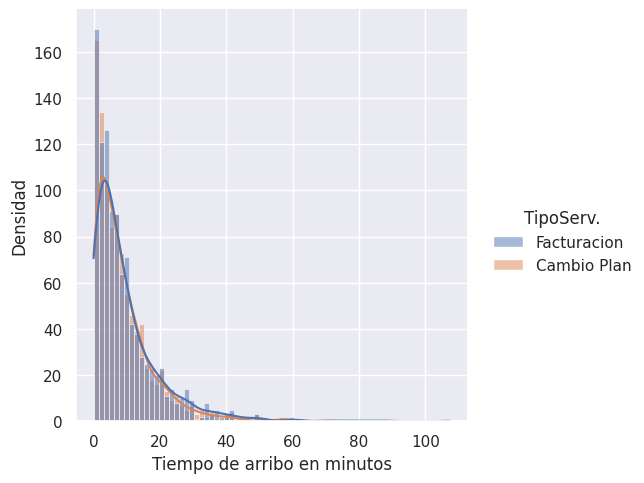

In [ ]:
base=arribo[(arribo['TipoServ.']=="Facturacion")|(arribo['TipoServ.']=="Cambio Plan")|(arribo['TipoServ.']=="Facturacion")&(arribo['Turno']==2)]
g = sns.displot(data=base,x="min_cliente",hue="TipoServ.",kde=True)
g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
g.set_titles("Tipo de servicio - {col_name}")

#**Pruebas para cuadruplas en busqueda de ver si estan expresadas en las mismas fdp**

In [ ]:
base=arribo[(arribo['TipoServ.']=="Tecnica")|(arribo['TipoServ.']=="Otro")|(arribo['TipoServ.']=="Cambio Plan")|(arribo['TipoServ.']=="Cancelacion")|(arribo['TipoServ.']=="Facturacion")&(arribo['Turno']==2)]
r1=pg.kruskal(base, dv='min_cliente', between="TipoServ.")
statistic, p_value = f_oneway(arribo[(arribo['TipoServ.']=="Cambio Plan")&(arribo['Turno']==2)]['min_cliente'],arribo[(arribo['TipoServ.']=="Cancelacion")&(arribo['Turno']==2)]['min_cliente'], arribo[(arribo['TipoServ.']=="Otro")&(arribo['Turno']==2)]['min_cliente'],arribo[(arribo['TipoServ.']=="Facturacion")&(arribo['Turno']==2)]['min_cliente'])
r2=pg.homoscedasticity(base, dv='min_cliente', group="TipoServ.")
r3=pg.homoscedasticity(base, dv="min_cliente", group="TipoServ.", method="bartlett", alpha=.05)

In [ ]:
r1

,Source,ddof1,H,p-unc
Kruskal,TipoServ.,4,5.914982,0.205588


In [ ]:
print(statistic,p_value)

0.46806428973325553 0.7592314003519395


In [ ]:
r2

,W,pval,equal_var
levene,2.245306,0.061752,True


In [ ]:
r3

,T,pval,equal_var
bartlett,67.064089,9.450185e-14,False


In [ ]:
base=arribo[(arribo['Turno']==2)]
r1=pg.kruskal(base, dv='min_cliente', between="TipoServ.")
statistic, p_value = f_oneway(arribo[(arribo['TipoServ.']=="Tecnica")&(arribo['Turno']==2)]['min_cliente'],
                              arribo[(arribo['TipoServ.']=="Cambio Plan")&(arribo['Turno']==2)]['min_cliente'],
                              arribo[(arribo['TipoServ.']=="Cancelacion")&(arribo['Turno']==2)]['min_cliente'],
                              arribo[(arribo['TipoServ.']=="Otro")&(arribo['Turno']==2)]['min_cliente'],
                              arribo[(arribo['TipoServ.']=="Facturacion")&(arribo['Turno']==2)]['min_cliente'])
r2=pg.homoscedasticity(base, dv='min_cliente', group="TipoServ.")
r3=pg.homoscedasticity(base, dv="min_cliente", group="TipoServ.", method="bartlett", alpha=.05)

In [ ]:
r1

,Source,ddof1,H,p-unc
Kruskal,TipoServ.,4,2.89857,0.57494


In [ ]:
print(statistic,p_value)

0.32959182419772826 0.8582338582595368


In [ ]:
r2

,W,pval,equal_var
levene,0.192308,0.94251,True


In [ ]:
r3

,T,pval,equal_var
bartlett,5.827461,0.212409,True


#**Para el turno 1**


In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1","Cuadrilla"]
kruskal,levene,pruebavar=pd.DataFrame(),pd.DataFrame(),pd.DataFrame()
grupop,source,intervalo,pruebavar_results={},[],[],[]
base = arribo[(arribo['Turno'] == 1)]
for i in cosas:
    source.append(i)
    kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
    levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
    for k in base[i].unique():
      grupop[k]=base[(base[i]==k)]['min_cliente']
    statistic, p_value = f_oneway(*grupop.values())
    pruebavar_results.append({"Variable": i, "Estadístico": statistic, "p-valor": p_value})
    pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal

,Source,ddof1,H,p-unc,H0
Kruskal,Mes,2,1.971460,3.731667e-01,True
Kruskal,dia,6,5.070969,5.347436e-01,True
Kruskal,TipoServ.,4,5.914982,2.055880e-01,True
Kruskal,intervalo_1,7,43.756636,2.381915e-07,False
Kruskal,Cuadrilla,2,2.913397,2.330043e-01,True


In [ ]:
Anova

,Variable,Estadístico,p-valor,H0
0,Mes,2.193462,1.116533e-01,True
1,dia,1.769861,6.855860e-02,True
2,TipoServ.,1.806037,3.197836e-02,False
3,intervalo_1,5.004571,1.189937e-13,False
4,Cuadrilla,2.121560,1.632815e-03,False


In [ ]:
levene

,W,pval,equal_var,Source
levene,2.106338,1.217450e-01,True,Mes
levene,0.547413,7.723694e-01,True,dia
levene,2.044942,8.531060e-02,True,TipoServ.
levene,20.269096,1.137095e-30,False,intervalo_1
levene,23.135560,6.541298e-15,False,Cuadrilla


In [ ]:
pruebavar

,T,pval,equal_var,Source
bartlett,17.513091,1.574275e-04,False,Mes
bartlett,13.953087,3.016462e-02,False,dia
bartlett,58.930979,4.865289e-12,False,TipoServ.
bartlett,561.838160,3.720765e-116,False,intervalo_1
bartlett,268.366310,6.964815e-58,False,Cuadrilla


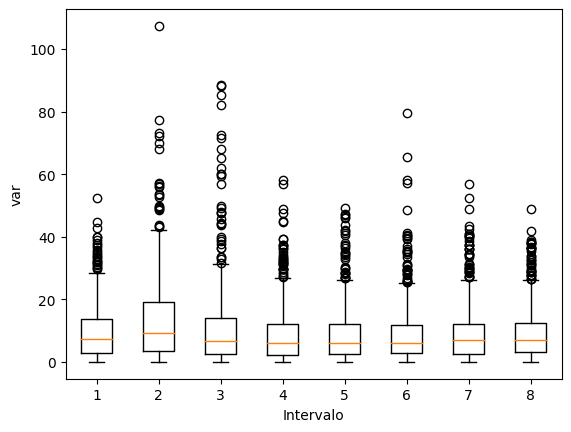

In [ ]:
import matplotlib.pyplot as plt
grupo = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==1)]['min_cliente']
grupo0 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==2)]['min_cliente']
grupo1 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==3)]['min_cliente']
grupo2 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==4)]['min_cliente']
grupo3 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==5)]['min_cliente']
grupo4 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==6)]['min_cliente']
grupo5 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==7)]['min_cliente']
grupo6 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==8)]['min_cliente']
fig, ax = plt.subplots(1, 1)
ax.boxplot([grupo, grupo0, grupo1,grupo2,grupo3,grupo4,grupo5,grupo6])
ax.set_xlabel("Intervalo")
ax.set_ylabel("var")
plt.show()

In [ ]:
result=tukey_hsd(grupo,grupo0, grupo1,grupo2,grupo3,grupo4,grupo5,grupo6)

In [ ]:
print(result)

Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)     -3.955     0.000    -6.161    -1.749
 (0 - 2)     -1.050     0.777    -3.097     0.998
 (0 - 3)      1.159     0.643    -0.830     3.149
 (0 - 4)      1.136     0.667    -0.854     3.126
 (0 - 5)      0.790     0.933    -1.213     2.793
 (0 - 6)      0.703     0.966    -1.316     2.721
 (0 - 7)      0.632     0.980    -1.369     2.632
 (1 - 0)      3.955     0.000     1.749     6.161
 (1 - 2)      2.905     0.001     0.823     4.988
 (1 - 3)      5.114     0.000     3.089     7.140
 (1 - 4)      5.091     0.000     3.065     7.117
 (1 - 5)      4.745     0.000     2.706     6.783
 (1 - 6)      4.658     0.000     2.603     6.712
 (1 - 7)      4.586     0.000     2.550     6.623
 (2 - 0)      1.050     0.777    -0.998     3.097
 (2 - 1)     -2.905     0.001    -4.988    -0.823
 (2 - 3)      2.209     0.007     0.358     4.060
 (2 - 4)      2.186     0.008   

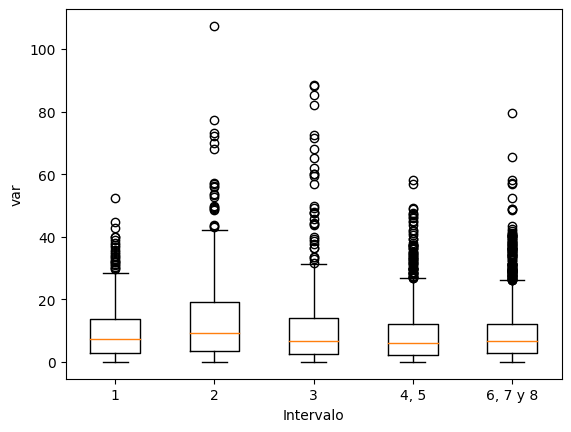

In [ ]:
import matplotlib.pyplot as plt
grupo = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==1)]['min_cliente']
grupo0 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==2)]['min_cliente']
grupo1 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==3)]['min_cliente']
grupo2 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==4)|(arribo['intervalo_1']==5)]['min_cliente']
grupo3 = arribo[(arribo['Turno'] == 1)&(arribo['intervalo_1']==6)|(arribo['intervalo_1']==7)|(arribo['intervalo_1']==8)]['min_cliente']
fig, ax = plt.subplots(1, 1)
ax.boxplot([grupo, grupo0, grupo1,grupo2,grupo3])
ax.set_xlabel("Intervalo")
ax.set_xticklabels(["1", "2", "3","4, 5","6, 7 y 8"])
ax.set_ylabel("var")
plt.show()

In [ ]:
base=arribo[(arribo['TipoServ.']=="Cancelacion")|
  (arribo['TipoServ.']=="Cambio Plan")|
   (arribo['TipoServ.']=="Otro")|
    (arribo['TipoServ.']=="Tecnica")&
     (arribo['Turno']==1)]
r1=pg.kruskal(base, dv='min_cliente', between="TipoServ.")
statistic, p_value = f_oneway(arribo[(arribo['TipoServ.']=="Cancelacion")&(arribo['Turno']==1)]['min_cliente'],
                              arribo[(arribo['TipoServ.']=="Cambio Plan")&(arribo['Turno']==1)]['min_cliente'],
                              arribo[(arribo['TipoServ.']=="Otro")&(arribo['Turno']==1)]['min_cliente'],
                              arribo[(arribo['TipoServ.']=="Tecnica")&(arribo['Turno']==1)]['min_cliente'])
r2=pg.homoscedasticity(base, dv='min_cliente', group="TipoServ.")
r3=pg.homoscedasticity(base, dv="min_cliente", group="TipoServ.", method="bartlett", alpha=.05)

In [ ]:
r1

,Source,ddof1,H,p-unc
Kruskal,TipoServ.,3,16.03101,0.001118


In [ ]:
print(statistic,p_value)

0.4515939822593169 0.7161822815807926


In [ ]:
r2

,W,pval,equal_var
levene,4.889331,0.002142,False


In [ ]:
r3

,T,pval,equal_var
bartlett,43.001436,2.459275e-09,False


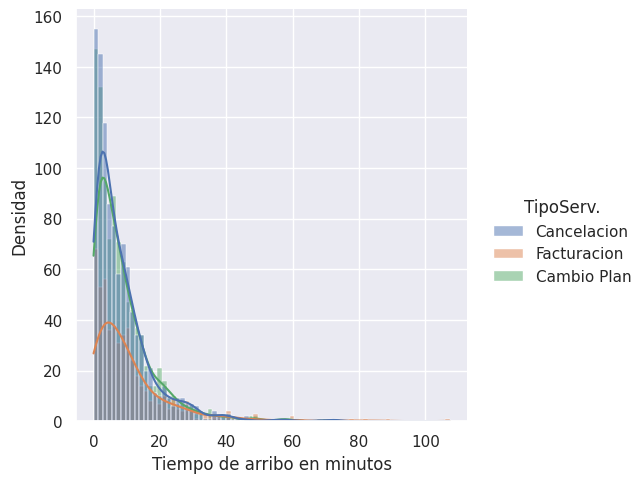

In [ ]:
base=arribo[(arribo['TipoServ.']=="Cancelacion")|
  (arribo['TipoServ.']=="Cambio Plan")|
   (arribo['TipoServ.']=="Facturacion")&
    (arribo['Turno']==1)]
g = sns.displot(data=base,x="min_cliente",hue="TipoServ.",kde=True)
g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
g.set_titles("Tipo de servicio - {col_name}")

#Para el turno 2


In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_2","Cuadrilla"]
kruskal,levene,pruebavar=pd.DataFrame(),pd.DataFrame(),pd.DataFrame()
grupop,source,intervalo,pruebavar_results={},[],[],[]
base = arribo[(arribo['Turno'] == 2)]
for i in cosas:
    source.append(i)
    kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
    levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
    for k in base[i].unique():
      grupop[k]=base[(base[i]==k)]['min_cliente']
    statistic, p_value = f_oneway(*grupop.values())
    pruebavar_results.append({"Variable": i, "Estadístico": statistic, "p-valor": p_value})
    pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal

,Source,ddof1,H,p-unc,H0
Kruskal,Mes,2,2.328129,3.122146e-01,True
Kruskal,dia,6,4.121975,6.601740e-01,True
Kruskal,TipoServ.,4,2.898570,5.749404e-01,True
Kruskal,intervalo_2,6,101.289177,1.350570e-19,False
Kruskal,Cuadrilla,1,0.074160,7.853728e-01,True


In [ ]:
Anova

,Variable,Estadístico,p-valor,H0
0,Mes,0.942825,3.896060e-01,True
1,dia,0.562984,8.283913e-01,True
2,TipoServ.,0.456071,9.557935e-01,True
3,intervalo_2,5.598728,2.286568e-15,False
4,Cuadrilla,3.961739,2.467383e-09,False


In [ ]:
levene

,W,pval,equal_var,Source
levene,2.106338,1.217450e-01,True,Mes
levene,0.547413,7.723694e-01,True,dia
levene,2.044942,8.531060e-02,True,TipoServ.
levene,15.489119,2.648259e-20,False,intervalo_2
levene,23.135560,6.541298e-15,False,Cuadrilla


In [ ]:
pruebavar

,T,pval,equal_var,Source
bartlett,17.513091,1.574275e-04,False,Mes
bartlett,13.953087,3.016462e-02,False,dia
bartlett,58.930979,4.865289e-12,False,TipoServ.
bartlett,400.499118,1.864244e-82,False,intervalo_2
bartlett,268.366310,6.964815e-58,False,Cuadrilla


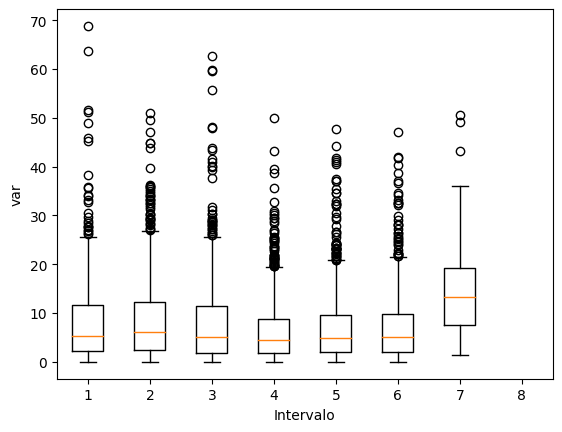

In [ ]:
grupo = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==1)]['min_cliente']
grupo0 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==2)]['min_cliente']
grupo1 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==3)]['min_cliente']
grupo2 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==4)]['min_cliente']
grupo3 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==5)]['min_cliente']
grupo4 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==6)]['min_cliente']
grupo5 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==7)]['min_cliente']
grupo6 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==8)]['min_cliente']
fig, ax = plt.subplots(1, 1)
ax.boxplot([grupo, grupo0, grupo1,grupo2,grupo3,grupo4,grupo5,grupo6])
ax.set_xlabel("Intervalo")
ax.set_ylabel("var")
plt.show()

In [ ]:
result=tukey_hsd(grupo,grupo0, grupo1,grupo2,grupo3,grupo4,grupo5)
print(result)

Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)     -0.822     0.557    -2.179     0.535
 (0 - 2)      0.054     1.000    -1.271     1.380
 (0 - 3)      1.708     0.001     0.447     2.969
 (0 - 4)      1.047     0.193    -0.233     2.326
 (0 - 5)      1.022     0.232    -0.275     2.319
 (0 - 6)     -6.571     0.000    -9.264    -3.877
 (1 - 0)      0.822     0.557    -0.535     2.179
 (1 - 2)      0.877     0.467    -0.470     2.223
 (1 - 3)      2.530     0.000     1.247     3.813
 (1 - 4)      1.869     0.000     0.567     3.170
 (1 - 5)      1.844     0.001     0.526     3.162
 (1 - 6)     -5.748     0.000    -8.453    -3.044
 (2 - 0)     -0.054     1.000    -1.380     1.271
 (2 - 1)     -0.877     0.467    -2.223     0.470
 (2 - 3)      1.653     0.002     0.403     2.904
 (2 - 4)      0.992     0.241    -0.277     2.261
 (2 - 5)      0.967     0.286    -0.319     2.254
 (2 - 6)     -6.625     0.000   

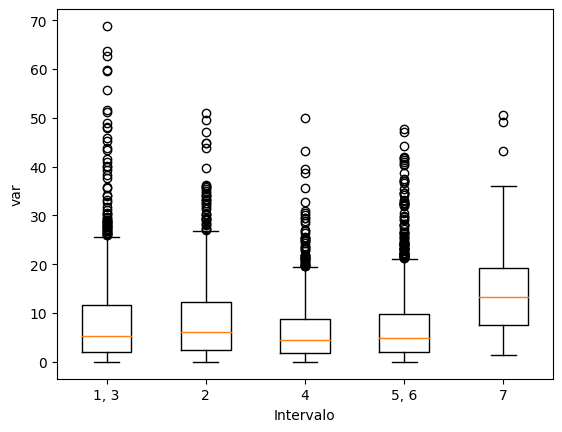

In [ ]:
grupo = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==1)|(arribo['intervalo_2']==3)]['min_cliente']
grupo0 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==2)]['min_cliente']
grupo1 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==4)]['min_cliente']
grupo2 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==5)|(arribo['intervalo_2']==6)]['min_cliente']
grupo3 = arribo[(arribo['Turno'] == 2)&(arribo['intervalo_2']==7)]['min_cliente']
fig, ax = plt.subplots(1, 1)
ax.boxplot([grupo, grupo0, grupo1,grupo2,grupo3])
ax.set_xlabel("Intervalo")
ax.set_xticklabels(["1, 3", "2", "4","5, 6","7"])
ax.set_ylabel("var")
plt.show()

#**Para duplas**


In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1","intervalo_2"]
kruskal=pd.DataFrame()
turno=[]
serv=[]
par=[]
for x in [1,2]:
  for Y in range(len(tiposervicio)):
    for Z in range(len(tiposervicio)):
      for i in range(len(cosas)):
        if Y<Z:
          base=arribo[(arribo['TipoServ.']==tiposervicio[Z])|(arribo['TipoServ.']==tiposervicio[Y])&(arribo['Turno']==x)]
          kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=cosas[i])])
          turno.append(x)
          serv.append(Y)
          mete=(tiposervicio[Y],tiposervicio[Z])
          par.append(mete)
kruskal['Dupla']=par
kruskal['Turno']=turno
result=[]
for i in kruskal['p-unc']:
  if i<=5e-02:
    result.append(False)
  else:
    result.append(True)
kruskal["Independencia"]=result

In [ ]:
kruskal[(kruskal['Source']=="TipoServ.")&(kruskal['Independencia']==True)&(kruskal['Turno']==1)]

,Source,ddof1,H,p-unc,Dupla,Turno,Independencia
Kruskal,TipoServ.,1,0.754822,0.384954,"(Tecnica, Facturacion)",1,True
Kruskal,TipoServ.,1,3.207370,0.073307,"(Tecnica, Cambio Plan)",1,True
Kruskal,TipoServ.,1,2.742071,0.097738,"(Otro, Cancelacion)",1,True
Kruskal,TipoServ.,1,0.039780,0.841912,"(Otro, Facturacion)",1,True
Kruskal,TipoServ.,1,0.864977,0.352350,"(Otro, Cambio Plan)",1,True
Kruskal,TipoServ.,1,0.004938,0.943980,"(Cancelacion, Facturacion)",1,True
Kruskal,TipoServ.,1,0.375542,0.539999,"(Cancelacion, Cambio Plan)",1,True


In [ ]:
trip=[]
stat=[]
p_val=[]
turno=[]
for Y in range(len(tiposervicio)):
  for Z in range(len(tiposervicio)):
    for x in [1,2]:
      if Y<Z:
        statistic, p_value = f_oneway(arribo[(arribo['TipoServ.']==tiposervicio[Z])&(arribo['Turno']==x)]['min_cliente'],arribo[(arribo['TipoServ.']==tiposervicio[Y])&(arribo['Turno']==x)]['min_cliente'])
        mete=(tiposervicio[Y],tiposervicio[Z])
        trip.append(mete)
        stat.append(statistic)
        p_val.append(p_value)
        turno.append(x)
Anova=pd.DataFrame()
Anova["Prueba"]="ANOVA"
Anova["Dupla"]=trip
Anova["Turno"]=turno
Anova["statistic"]=stat
Anova["p-val"]=p_val
Anova["Prueba"]="ANOVA"
result=[]
for i in Anova["p-val"]:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['Homogeneidad']=result

In [ ]:
Anova[(Anova['Turno']==1)&(Anova['Homogeneidad']==True)]

,Prueba,Dupla,Turno,statistic,p-val,Homogeneidad
0,ANOVA,"(Tecnica, Otro)",1,0.575875,0.447998,True
2,ANOVA,"(Tecnica, Cancelacion)",1,0.975199,0.323478,True
6,ANOVA,"(Tecnica, Cambio Plan)",1,0.022092,0.881855,True
8,ANOVA,"(Otro, Cancelacion)",1,0.074557,0.784861,True
12,ANOVA,"(Otro, Cambio Plan)",1,0.225260,0.635148,True
16,ANOVA,"(Cancelacion, Cambio Plan)",1,0.479443,0.488831,True
18,ANOVA,"(Facturacion, Cambio Plan)",1,3.542351,0.060102,True


In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1","intervalo_2"]
levene=pd.DataFrame()
turno=[]
serv=[]
par=[]
Source=[]
for x in [1,2]:
  for Y in range(len(tiposervicio)):
    for Z in range(len(tiposervicio)):
      for i in range(len(cosas)):
        if Y<Z:
          base=arribo[(arribo['TipoServ.']==tiposervicio[Z])|(arribo['TipoServ.']==tiposervicio[Y])&(arribo['Turno']==x)]
          levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(base, dv='min_cliente', group=cosas[i]))])
          turno.append(x)
          serv.append(Y)
          Source.append(cosas[i])
          mete=(tiposervicio[Y],tiposervicio[Z])
          par.append(mete)
levene['Source']=Source
levene['Dupla']=par
levene['Turno']=turno

In [ ]:
levene[(levene['Source']=="TipoServ.")&(levene['equal_var']==True)&(levene['Turno']==1)]

,W,pval,equal_var,Source,Dupla,Turno
levene,0.021163,0.884345,True,TipoServ.,"(Tecnica, Facturacion)",1
levene,2.921218,0.087603,True,TipoServ.,"(Otro, Cancelacion)",1
levene,0.200719,0.654198,True,TipoServ.,"(Otro, Facturacion)",1
levene,2.319557,0.127946,True,TipoServ.,"(Otro, Cambio Plan)",1
levene,0.515236,0.472988,True,TipoServ.,"(Cancelacion, Facturacion)",1
levene,1.010057,0.315050,True,TipoServ.,"(Cancelacion, Cambio Plan)",1


In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1","intervalo_2"]
pruebavar=pd.DataFrame()
source=[]
turno=[]
par=[]
tiposervicio2=["Otro","Cancelacion","Facturacion","Cambio Plan"]
for Y in range(len(tiposervicio)):
  for Z in range(len(tiposervicio)):
    for x in [1,2]:
      for i in range(len(cosas)):
        if Y<Z:
          source.append(cosas[i])
          turno.append(x)
          mete=(tiposervicio[Y],tiposervicio[Z])
          par.append(mete)
          base=arribo[(arribo['TipoServ.']==tiposervicio[Y])|(arribo['TipoServ.']==tiposervicio[Z])&(arribo['Turno']==x)]
          pruebavar=pd.concat([pruebavar,pg.homoscedasticity(base, dv="min_cliente", group=cosas[i], method="bartlett", alpha=.05)])
    pruebavar["Source"]=source
    pruebavar["Turno"]=turno
    pruebavar["Dupla"]=par

In [ ]:
pruebavar[(pruebavar['Source']=="TipoServ.")&(pruebavar['equal_var']==True)&(pruebavar['Turno']==1)]

,Source,Turno,Dupla,T,pval,equal_var
bartlett,TipoServ.,1,"(Tecnica, Otro)",1.231278,0.267159,True
bartlett,TipoServ.,1,"(Tecnica, Cambio Plan)",0.377938,0.538709,True
bartlett,TipoServ.,1,"(Otro, Cambio Plan)",1.489722,0.222260,True
bartlett,TipoServ.,1,"(Cancelacion, Cambio Plan)",0.777032,0.378050,True


#**Graficas para las duplas**


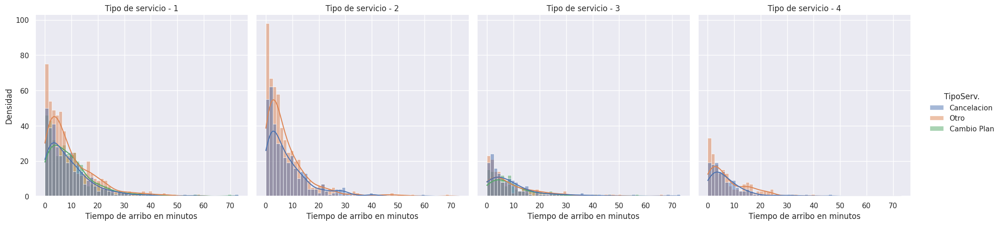

In [ ]:
base=arribo[(arribo['TipoServ.']=="Otro")|
 (arribo['TipoServ.']=="Cancelacion")|
  (arribo['TipoServ.']=="Cambio Plan")&
   (arribo['Turno']==1)]
g = sns.displot(data=base,x="min_cliente",col="Cuadrilla",hue="TipoServ.",kde=True)
g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
g.set_titles("Tipo de servicio - {col_name}")

In [ ]:
def fit(x):
  print("Para el servicio "+x)
  dfit = distfit()
  results2 = dfit.fit_transform(arribo[(arribo['TipoServ.']==x)]['min_cliente'])
  results2['summary'].to_excel(x+".xlsx")
  return dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0172468] [loc=8.795 scale=9.313]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000160248] [loc=0.000 scale=8.795]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 7.70633e-05] [loc=-144.388 scale=144.388]
[distfit] >INFO> [dweibull  ] [0.10 sec] [RSS: 0.0114889] [loc=5.350 scale=6.125]


Para el servicio Tecnica


[distfit] >INFO> [t         ] [0.28 sec] [RSS: 0.0105443] [loc=5.836 scale=4.837]
[distfit] >INFO> [genextreme] [0.20 sec] [RSS: 0.00268898] [loc=3.793 scale=3.927]
[distfit] >INFO> [gamma     ] [0.04 sec] [RSS: 0.0780911] [loc=-0.001 scale=1.617]
[distfit] >INFO> [lognorm   ] [0.19 sec] [RSS: 0.00104443] [loc=-0.516 scale=5.867]
[distfit] >INFO> [beta      ] [0.22 sec] [RSS: 0.000132395] [loc=-0.000 scale=1459.145]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0404326] [loc=0.000 scale=88.067]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.0177312] [loc=-3531.086 scale=460.524]
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0133852] [loc=8.471 scale=9.089]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000345074] [loc=0.000 scale=8.471]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000186032] [loc=-103.239 scale=103.239]
[distfit] >INFO> [dweibull  ] [0.12 sec] [RSS: 0.00860904] [loc=5.183 scale=5.817]


Para el servicio Otro


[distfit] >INFO> [t         ] [0.19 sec] [RSS: 0.00830449] [loc=5.484 scale=4.686]
[distfit] >INFO> [genextreme] [0.10 sec] [RSS: 0.00188155] [loc=3.529 scale=3.753]
[distfit] >INFO> [gamma     ] [0.07 sec] [RSS: 0.000190388] [loc=-0.000 scale=9.717]
[distfit] >INFO> [lognorm   ] [0.01 sec] [RSS: 0.000720332] [loc=-0.463 scale=5.485]
[distfit] >INFO> [beta      ] [0.14 sec] [RSS: 0.000183202] [loc=-0.000 scale=598.157]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0282993] [loc=0.000 scale=68.833]
[distfit] >INFO> [loggamma  ] [0.07 sec] [RSS: 0.0136313] [loc=-4082.016 scale=512.655]
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0117583] [loc=8.521 scale=9.187]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000339707] [loc=0.017 scale=8.504]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000293566] [loc=-115.429 scale=115.446]
[distfit] >INFO> [dweibull  ] [0.07 sec] [RSS: 0.0082771] [loc=5.617 scale=5.933]


Para el servicio Cancelacion


[distfit] >INFO> [t         ] [0.20 sec] [RSS: 0.00769465] [loc=5.791 scale=4.704]
[distfit] >INFO> [genextreme] [0.13 sec] [RSS: 0.00192771] [loc=3.704 scale=3.747]
[distfit] >INFO> [gamma     ] [0.08 sec] [RSS: 0.000320178] [loc=0.017 scale=9.115]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000825371] [loc=-0.458 scale=5.687]
[distfit] >INFO> [beta      ] [0.11 sec] [RSS: 0.000317601] [loc=0.017 scale=1164.947]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0267091] [loc=0.017 scale=73.000]
[distfit] >INFO> [loggamma  ] [0.07 sec] [RSS: 0.0119254] [loc=-3546.295 scale=457.373]
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0109871] [loc=9.563 scale=10.917]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000226892] [loc=0.017 scale=9.546]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000109509] [loc=-74.238 scale=74.255]
[distfit] >INFO> [dweibull  ] [0.08 sec] [RSS: 0.00647219] [loc=5.683 scale=6.594]


Para el servicio Facturacion


[distfit] >INFO> [t         ] [0.16 sec] [RSS: 0.00600957] [loc=5.999 scale=4.894]
[distfit] >INFO> [genextreme] [0.10 sec] [RSS: 0.00135538] [loc=3.992 scale=4.160]
[distfit] >INFO> [gamma     ] [0.08 sec] [RSS: 0.0149288] [loc=0.017 scale=3.125]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000500674] [loc=-0.465 scale=6.112]
[distfit] >INFO> [beta      ] [0.13 sec] [RSS: 0.000237598] [loc=0.017 scale=1554.058]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0246041] [loc=0.017 scale=107.333]
[distfit] >INFO> [loggamma  ] [0.07 sec] [RSS: 0.0112515] [loc=-4886.973 scale=612.813]
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00989316] [loc=8.751 scale=9.061]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000252308] [loc=0.000 scale=8.751]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000242077] [loc=-258.915 scale=258.915]
[distfit] >INFO> [dweibull  ] [0.12 sec] [RSS: 0.00734627] [loc=6.150 scale=6.068]


Para el servicio Cambio Plan


[distfit] >INFO> [t         ] [0.18 sec] [RSS: 0.00668378] [loc=6.211 scale=5.016]
[distfit] >INFO> [genextreme] [0.11 sec] [RSS: 0.00205784] [loc=3.944 scale=4.024]
[distfit] >INFO> [gamma     ] [0.07 sec] [RSS: 0.000233559] [loc=-0.000 scale=9.019]
[distfit] >INFO> [lognorm   ] [0.13 sec] [RSS: 0.000935035] [loc=-0.602 scale=6.071]
[distfit] >INFO> [beta      ] [0.14 sec] [RSS: 0.00022909] [loc=-0.000 scale=1596.468]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0233676] [loc=0.000 scale=69.800]
[distfit] >INFO> [loggamma  ] [0.07 sec] [RSS: 0.0101541] [loc=-3530.632 scale=455.793]


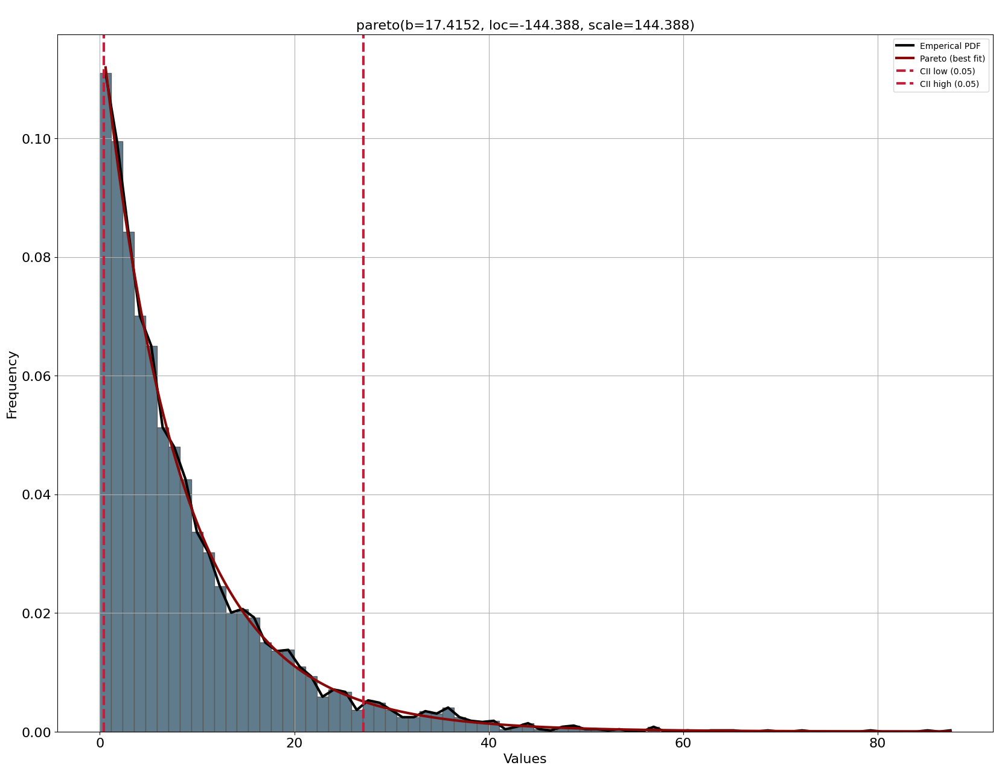

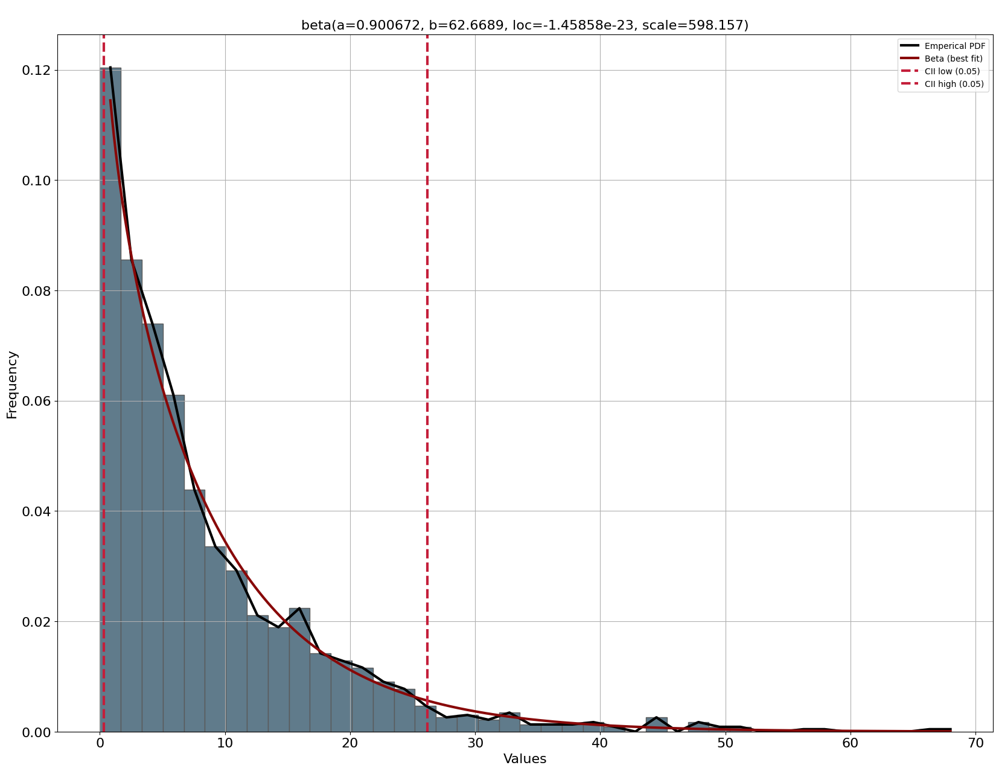

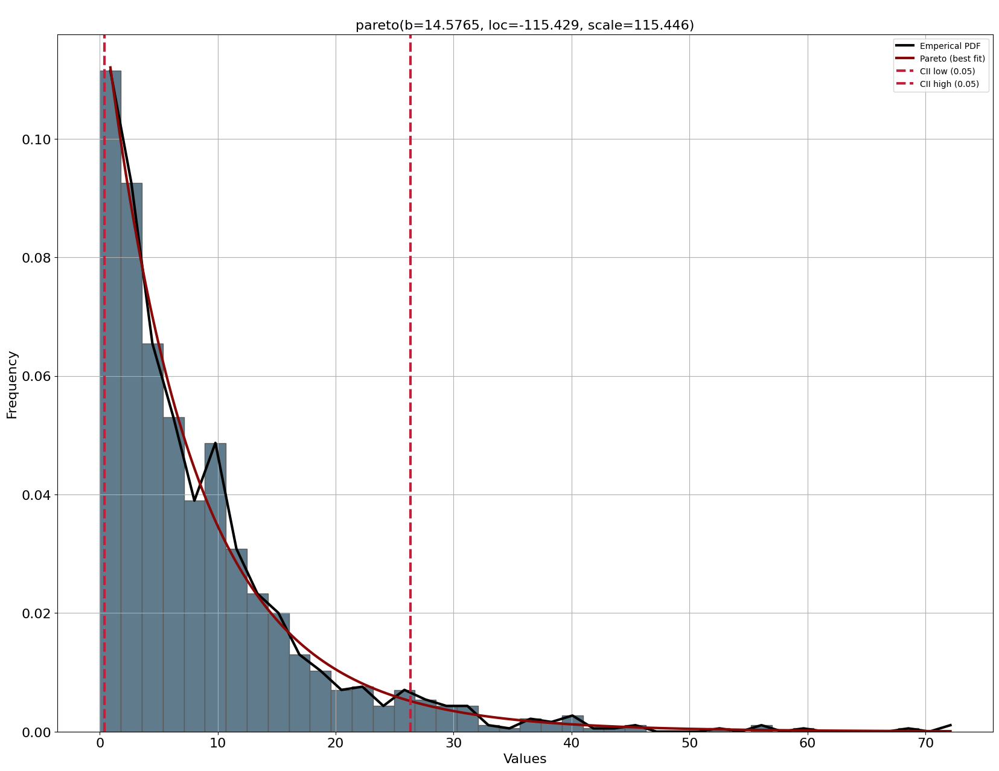

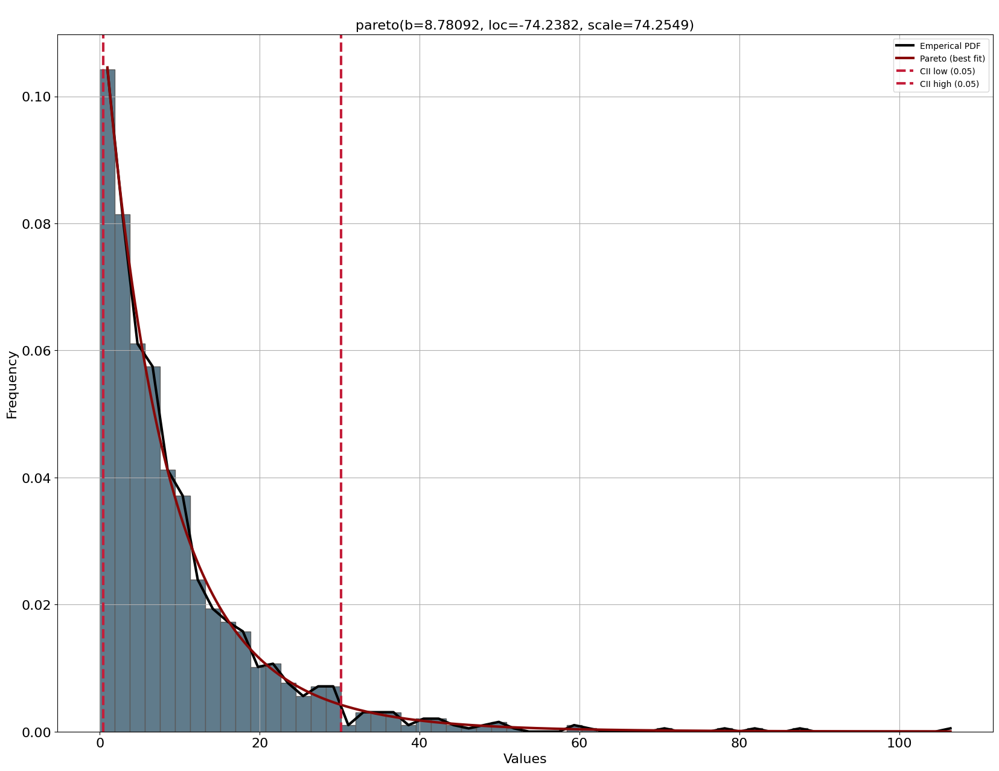

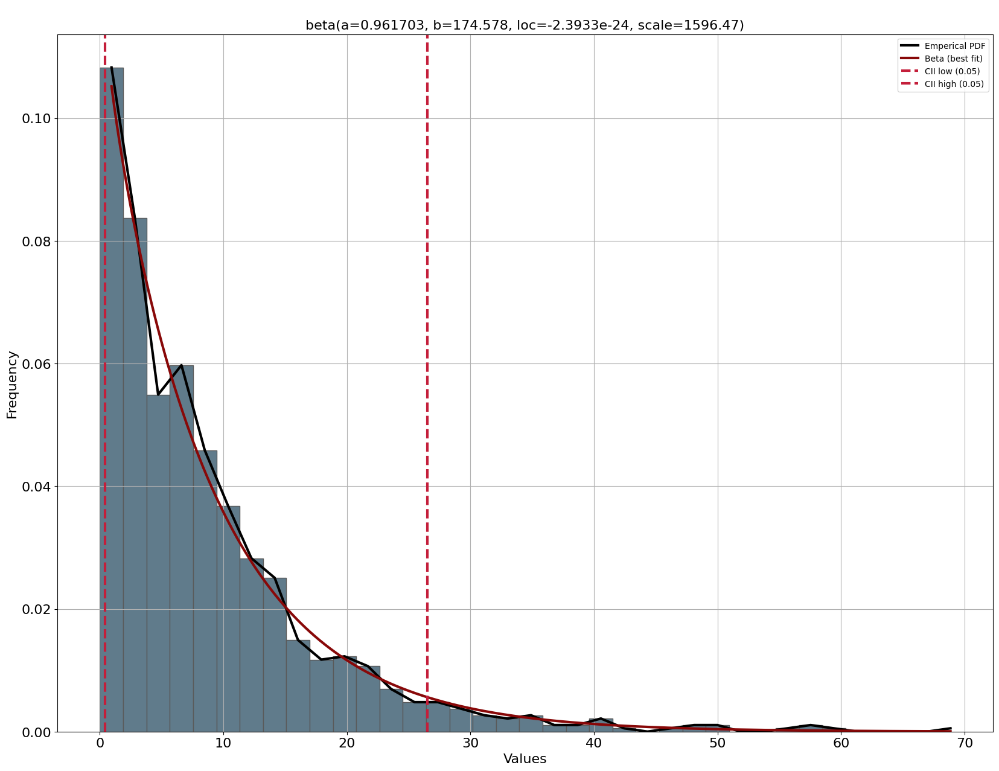

In [ ]:
for x in tiposervicio:
  fit(x)

In [ ]:
def qqplot(X,nombre):
  print(nombre)
  return dfit.qqplot(X, n_top=11)

Tecnica
Otro
Cancelacion
Facturacion
Cambio Plan


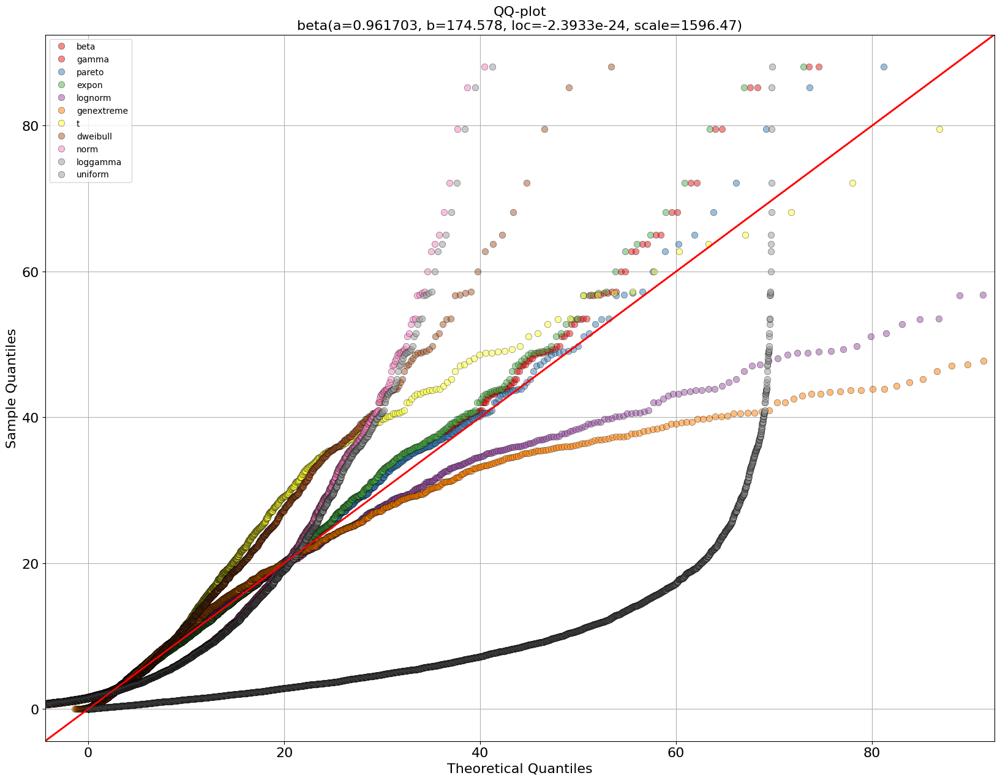

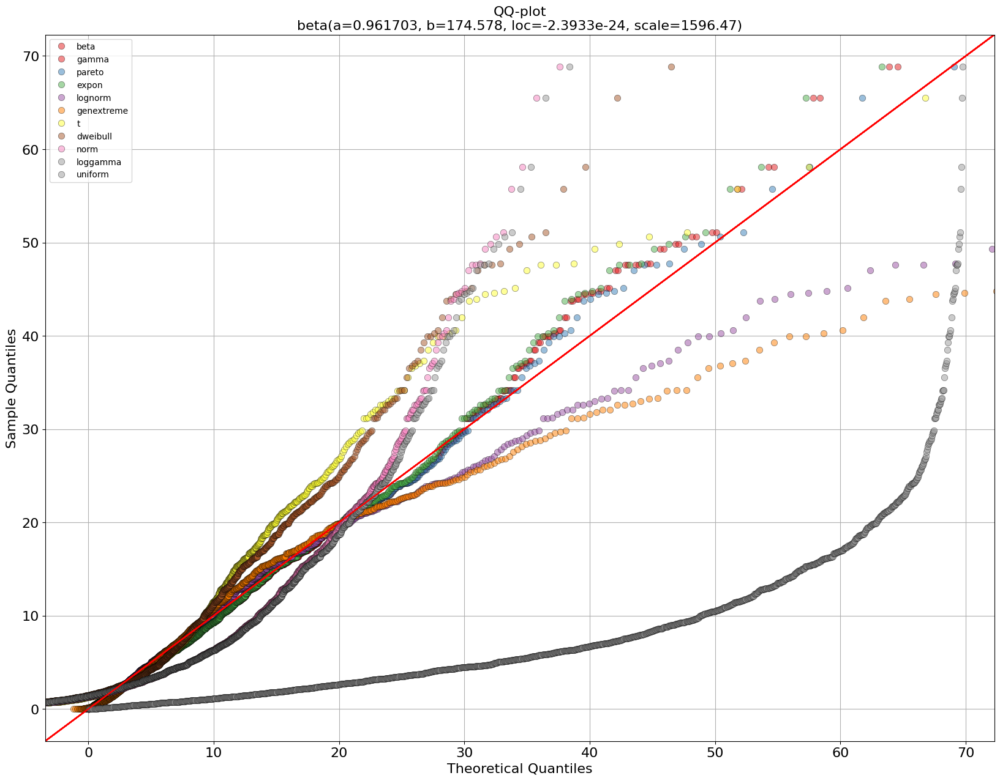

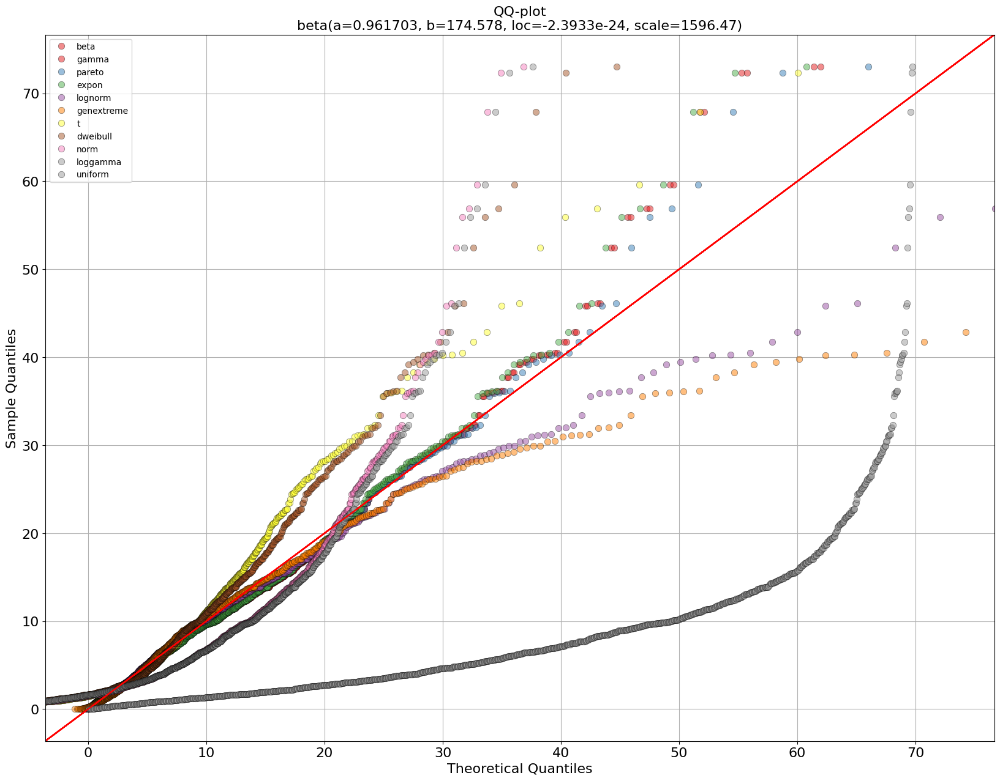

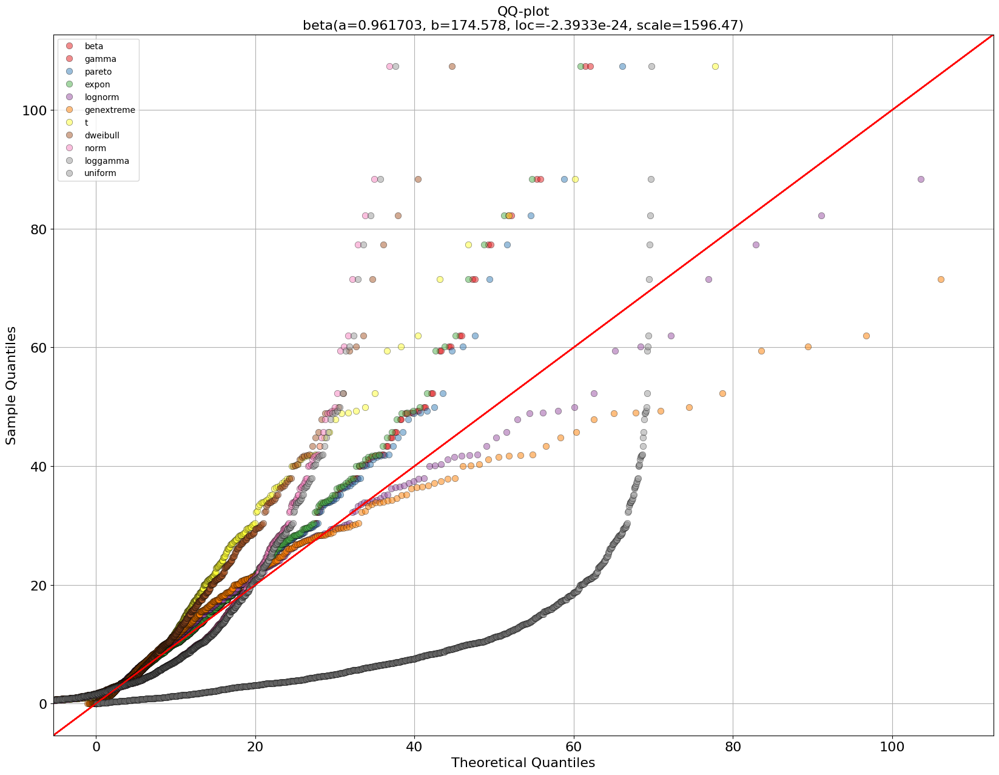

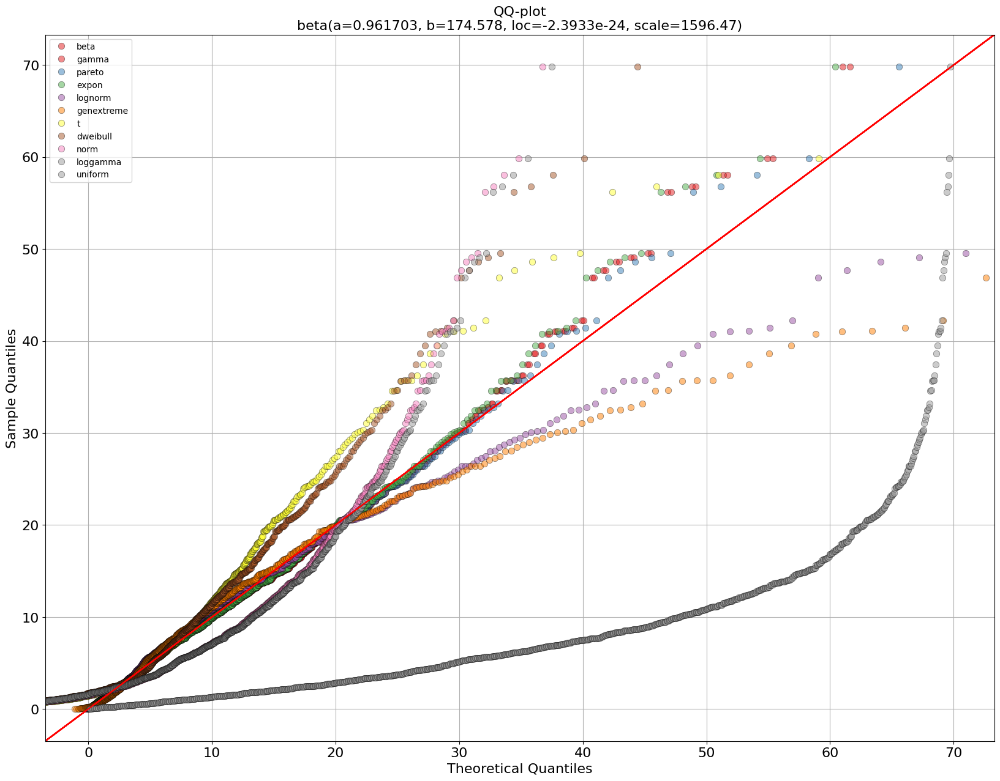

In [ ]:
for x in tiposervicio:
  qqplot(arribo[(arribo['TipoServ.']==x)]['min_cliente'],x)

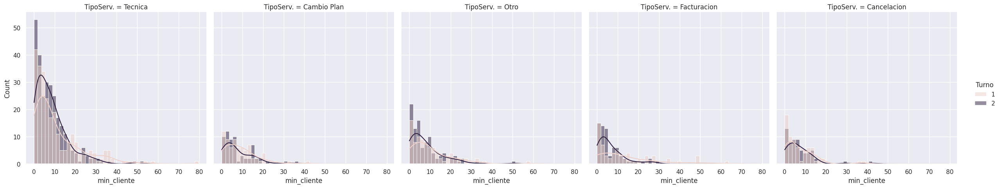

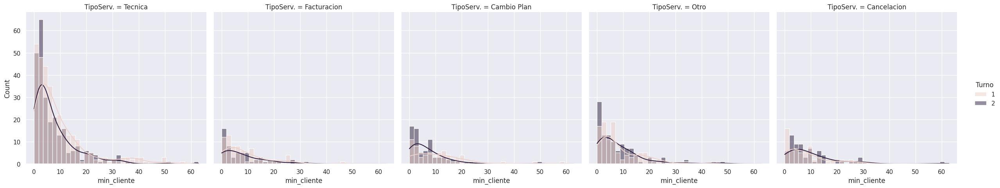

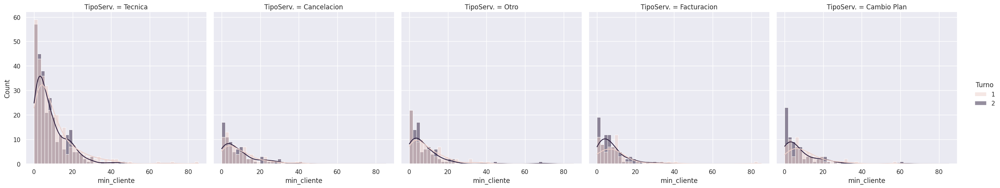

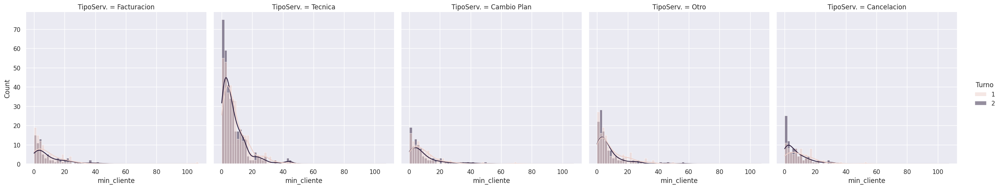

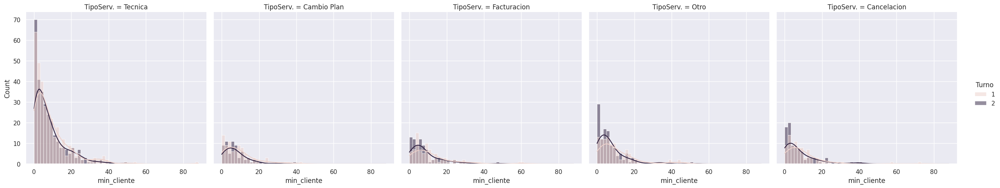

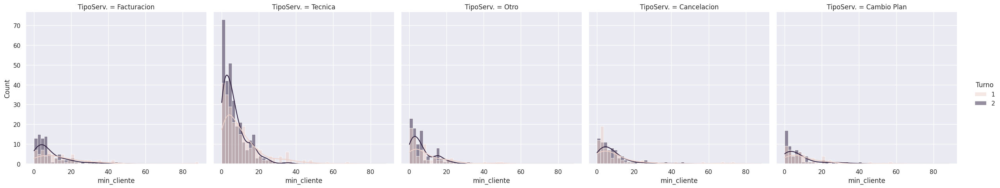

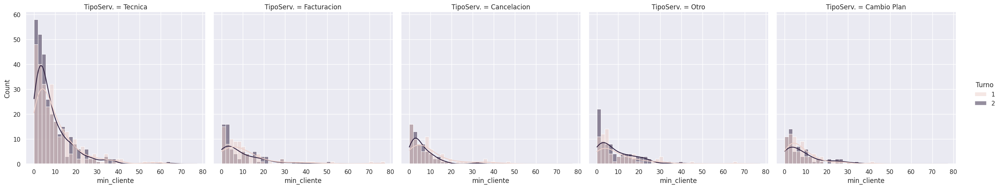

In [ ]:
sns.displot(data=arribo[(arribo["dia"]=="Lunes")],x="min_cliente",col="TipoServ.",hue="Turno",kde=True)
sns.displot(data=arribo[(arribo["dia"]=="Martes")],x="min_cliente",col="TipoServ.",hue="Turno",kde=True)
sns.displot(data=arribo[(arribo["dia"]=="Miercoles")],x="min_cliente",col="TipoServ.",hue="Turno",kde=True)
sns.displot(data=arribo[(arribo["dia"]=="Jueves")],x="min_cliente",col="TipoServ.",hue="Turno",kde=True)
sns.displot(data=arribo[(arribo["dia"]=="Viernes")],x="min_cliente",col="TipoServ.",hue="Turno",kde=True)
sns.displot(data=arribo[(arribo["dia"]=="Sabado")],x="min_cliente",col="TipoServ.",hue="Turno",kde=True)
sns.displot(data=arribo[(arribo["dia"]=="Domingo")],x="min_cliente",col="TipoServ.",hue="Turno",kde=True)

<Axes: xlabel='min_cliente', ylabel='TipoServ.'>

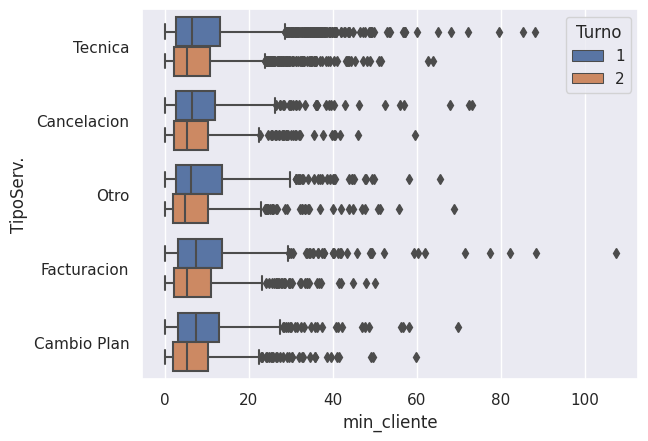

In [ ]:
sns.set_theme()
sns.boxplot(data=arribo,x="min_cliente",y="TipoServ.",hue="Turno")

<Axes: xlabel='min_cliente', ylabel='dia'>

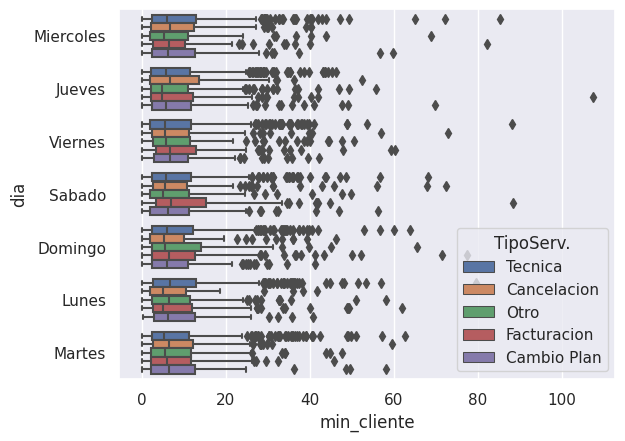

In [ ]:
sns.set_theme()
sns.boxplot(data=arribo,x="min_cliente",y="dia",hue="TipoServ.")

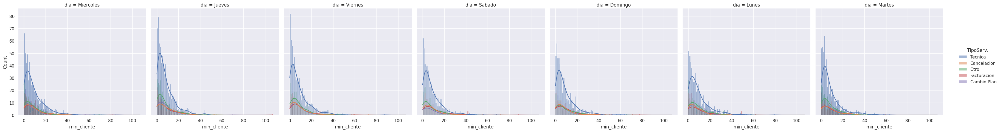

In [ ]:
%matplotlib inline
sns.set_theme()
sns.displot(data=arribo,x="min_cliente",col="dia",hue="TipoServ.",kde=True)


In [ ]:
def dispercion_sevicio(evaluando):
  x=len(servicio[(servicio['TipoServ.']==evaluando)]['min_servicio'])-1
  return plt.scatter(servicio[(servicio['TipoServ.']==evaluando)]['min_servicio'][:x], servicio[(servicio['TipoServ.']==evaluando)]['min_servicio'][1:],label=evaluando,s=8,alpha=0.7)

#**Gráficos para ver si hay horas pico**


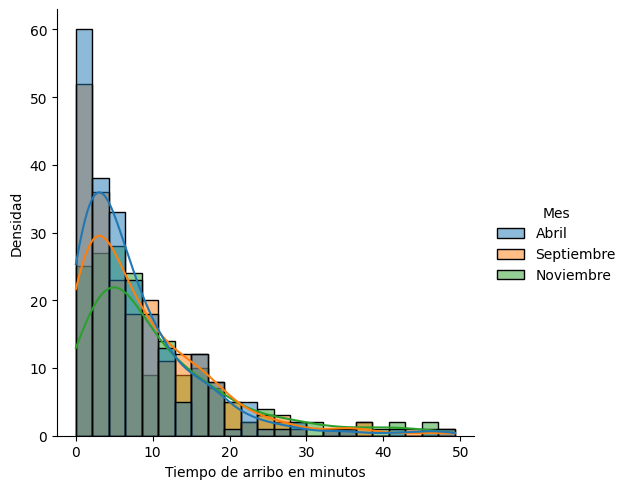

In [ ]:
base=arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==5)]
gra=sns.displot(data=base,x="min_cliente",hue="Mes",kde=True)
gra.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
gra.set_titles("Intervalo {col_name}")

##Para grupos de a siete


In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1"]
kruskal=pd.DataFrame()
dupla=[]
for k in [1,2,3,4,5,6,7,8]:
  for j in [1,2,3,4,5,6,7,8]:
    for l in [1,2,3,4,5,6,7,8]:
      for m in [1,2,3,4,5,6,7,8]:
        for n in [1,2,3,4,5,6,7,8]:
          for o in [1,2,3,4,5,6,7,8]:
            for p in [1,2,3,4,5,6,7,8]:
              if k<j and j<l and l<m and m<n and n<o and o<p:
                base=arribo[(arribo['Turno']==1)&
                (arribo['intervalo_1']==k)|
                  (arribo['intervalo_1']==j)|
                  (arribo['intervalo_1']==l)|
                    (arribo['intervalo_1']==m)|
                    (arribo['intervalo_1']==n)|
                      (arribo['intervalo_1']==o)|
                      (arribo['intervalo_1']==p)]
                for i in cosas:
                  mete=(k,j,l,m,n,o,p)
                  dupla.append(mete)
                  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
kruskal['combinacion']=dupla
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result

In [ ]:
kruskal[(kruskal['Source']=="intervalo_1")]

,Source,ddof1,H,p-unc,combinacion,H0
Kruskal,intervalo_1,6,43.175535,1.076759e-07,"(1, 2, 3, 4, 5, 6, 7)",False
Kruskal,intervalo_1,6,42.740102,1.313033e-07,"(1, 2, 3, 4, 5, 6, 8)",False
Kruskal,intervalo_1,6,42.734623,1.316314e-07,"(1, 2, 3, 4, 5, 7, 8)",False
Kruskal,intervalo_1,6,39.743629,5.115250e-07,"(1, 2, 3, 4, 6, 7, 8)",False
Kruskal,intervalo_1,6,36.202111,2.518169e-06,"(1, 2, 3, 5, 6, 7, 8)",False
Kruskal,intervalo_1,6,43.802803,8.088418e-08,"(1, 2, 4, 5, 6, 7, 8)",False
Kruskal,intervalo_1,6,11.145696,8.397654e-02,"(1, 3, 4, 5, 6, 7, 8)",True
Kruskal,intervalo_1,6,41.611430,2.193895e-07,"(2, 3, 4, 5, 6, 7, 8)",False


In [ ]:
levene=pd.DataFrame()
dupla=[]
source=[]
for k in [1,2,3,4,5,6,7,8]:
  for j in [1,2,3,4,5,6,7,8]:
    for l in [1,2,3,4,5,6,7,8]:
      for m in [1,2,3,4,5,6,7,8]:
        for n in [1,2,3,4,5,6,7,8]:
          for o in [1,2,3,4,5,6,7,8]:
            for p in [1,2,3,4,5,6,7,8]:
              if k<j and j<l and l<m and m<n and n<o and o<p:
                base=arribo[(arribo['Turno']==1)&
                (arribo['intervalo_1']==k)|
                  (arribo['intervalo_1']==j)|
                  (arribo['intervalo_1']==l)|
                    (arribo['intervalo_1']==m)|
                    (arribo['intervalo_1']==n)|
                      (arribo['intervalo_1']==o)|
                      (arribo['intervalo_1']==p)]
                for i in range(len(cosas)):
                  levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=cosas[i]))])
                  source.append(cosas[i])
                  mete=(k,j,l,m,n,o,p)
                  dupla.append(mete)
levene['Combinacion']=dupla
levene['Source']=source

In [ ]:
levene

,W,pval,equal_var,Combinacion,Source
levene,2.106338,1.217450e-01,True,"(1, 2, 3, 4, 5, 6, 7)",Mes
levene,0.547413,7.723694e-01,True,"(1, 2, 3, 4, 5, 6, 7)",dia
levene,2.044942,8.531060e-02,True,"(1, 2, 3, 4, 5, 6, 7)",TipoServ.
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 4, 5, 6, 7)",intervalo_1
levene,2.106338,1.217450e-01,True,"(1, 2, 3, 4, 5, 6, 8)",Mes
levene,0.547413,7.723694e-01,True,"(1, 2, 3, 4, 5, 6, 8)",dia
levene,2.044942,8.531060e-02,True,"(1, 2, 3, 4, 5, 6, 8)",TipoServ.
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 4, 5, 6, 8)",intervalo_1
levene,2.106338,1.217450e-01,True,"(1, 2, 3, 4, 5, 7, 8)",Mes
levene,0.547413,7.723694e-01,True,"(1, 2, 3, 4, 5, 7, 8)",dia


##Para grupos de a seis

In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1"]
kruskal=pd.DataFrame()
dupla=[]
for k in [1,2,3,4,5,6,7,8]:
  for j in [1,2,3,4,5,6,7,8]:
    for l in [1,2,3,4,5,6,7,8]:
      for m in [1,2,3,4,5,6,7,8]:
        for n in [1,2,3,4,5,6,7,8]:
          for o in [1,2,3,4,5,6,7,8]:
            if k<j and j<l and l<m and m<n and n<o and o<p:
              base=arribo[(arribo['Turno']==1)&
              (arribo['intervalo_1']==k)|
                (arribo['intervalo_1']==j)|
                (arribo['intervalo_1']==l)|
                  (arribo['intervalo_1']==m)|
                  (arribo['intervalo_1']==n)|
                    (arribo['intervalo_1']==o)]
              for i in cosas:
                mete=(k,j,l,m,n,o)
                dupla.append(mete)
                kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
kruskal['combinacion']=dupla
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result

In [ ]:
kruskal

,Source,ddof1,H,p-unc,combinacion,H0
Kruskal,Mes,2,1.335124,5.129576e-01,"(1, 2, 3, 4, 5, 6)",True
Kruskal,dia,6,4.683646,5.849795e-01,"(1, 2, 3, 4, 5, 6)",True
Kruskal,TipoServ.,4,3.372049,4.975983e-01,"(1, 2, 3, 4, 5, 6)",True
Kruskal,intervalo_1,5,42.161970,5.462170e-08,"(1, 2, 3, 4, 5, 6)",False
Kruskal,Mes,2,1.024748,5.990717e-01,"(1, 2, 3, 4, 5, 7)",True
Kruskal,dia,6,8.294626,2.173031e-01,"(1, 2, 3, 4, 5, 7)",True
Kruskal,TipoServ.,4,4.680152,3.217172e-01,"(1, 2, 3, 4, 5, 7)",True
Kruskal,intervalo_1,5,42.150246,5.492098e-08,"(1, 2, 3, 4, 5, 7)",False
Kruskal,Mes,2,0.725355,6.958109e-01,"(1, 2, 3, 4, 6, 7)",True
Kruskal,dia,6,8.335711,2.145254e-01,"(1, 2, 3, 4, 6, 7)",True


In [ ]:
levene=pd.DataFrame()
dupla=[]
source=[]
for k in [1,2,3,4,5,6,7,8]:
  for j in [1,2,3,4,5,6,7,8]:
    for l in [1,2,3,4,5,6,7,8]:
      for m in [1,2,3,4,5,6,7,8]:
        for n in [1,2,3,4,5,6,7,8]:
          for o in [1,2,3,4,5,6,7,8]:
            if k<j and j<l and l<m and m<n and n<o and o<p:
              base=arribo[(arribo['Turno']==1)&
               (arribo['intervalo_1']==k)|
                (arribo['intervalo_1']==j)|
                (arribo['intervalo_1']==l)|
                  (arribo['intervalo_1']==m)|
                  (arribo['intervalo_1']==n)|
                    (arribo['intervalo_1']==o)]
              for i in range(len(cosas)):
                levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=cosas[i]))])
                source.append(cosas[i])
                mete=(k,j,l,m,n,o)
                dupla.append(mete)
levene['Combinacion']=dupla
levene['Source']=source

In [ ]:
levene

,W,pval,equal_var,Combinacion,Source
levene,2.106338,1.217450e-01,True,"(1, 2, 3, 4, 5, 6)",Mes
levene,0.547413,7.723694e-01,True,"(1, 2, 3, 4, 5, 6)",dia
levene,2.044942,8.531060e-02,True,"(1, 2, 3, 4, 5, 6)",TipoServ.
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 4, 5, 6)",intervalo_1
levene,2.106338,1.217450e-01,True,"(1, 2, 3, 4, 5, 7)",Mes
levene,0.547413,7.723694e-01,True,"(1, 2, 3, 4, 5, 7)",dia
levene,2.044942,8.531060e-02,True,"(1, 2, 3, 4, 5, 7)",TipoServ.
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 4, 5, 7)",intervalo_1
levene,2.106338,1.217450e-01,True,"(1, 2, 3, 4, 6, 7)",Mes
levene,0.547413,7.723694e-01,True,"(1, 2, 3, 4, 6, 7)",dia


##Para grupos de cinco

In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1"]
kruskal=pd.DataFrame()
dupla=[]
for k in [1,2,3,4,5,6,7,8]:
  for j in [1,2,3,4,5,6,7,8]:
    for l in [1,2,3,4,5,6,7,8]:
      for m in [1,2,3,4,5,6,7,8]:
        for n in [1,2,3,4,5,6,7,8]:
          if k<j and j<l and l<m and m<n:
            base=arribo[(arribo['Turno']==1)&
            (arribo['intervalo_1']==k)|
              (arribo['intervalo_1']==j)|
              (arribo['intervalo_1']==l)|
               (arribo['intervalo_1']==m)|
                (arribo['intervalo_1']==n)]
            for i in cosas:
              mete=(k,j,l,m,n)
              dupla.append(mete)
              kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
kruskal['combinacion']=dupla
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result

In [ ]:
kruskal[(kruskal['H0']==True)&(kruskal['Source']=="intervalo_1")]

,Source,ddof1,H,p-unc,combinacion,H0
Kruskal,intervalo_1,4,8.597330,0.071991,"(1, 3, 4, 6, 7)",True
Kruskal,intervalo_1,4,9.175917,0.056850,"(1, 3, 4, 6, 8)",True
Kruskal,intervalo_1,4,9.100744,0.058630,"(1, 3, 4, 7, 8)",True
Kruskal,intervalo_1,4,6.113942,0.190799,"(1, 3, 5, 6, 7)",True
Kruskal,intervalo_1,4,6.325516,0.176122,"(1, 3, 5, 6, 8)",True
Kruskal,intervalo_1,4,6.281720,0.179074,"(1, 3, 5, 7, 8)",True
Kruskal,intervalo_1,4,3.766856,0.438477,"(1, 3, 6, 7, 8)",True
Kruskal,intervalo_1,4,8.003024,0.091467,"(1, 4, 5, 6, 7)",True
Kruskal,intervalo_1,4,8.545596,0.073517,"(1, 4, 6, 7, 8)",True
Kruskal,intervalo_1,4,6.045376,0.195785,"(1, 5, 6, 7, 8)",True


In [ ]:
levene=pd.DataFrame()
dupla=[]
source=[]
for k in [1,2,3,4,5,6,7,8]:
  for j in [1,2,3,4,5,6,7,8]:
    for l in [1,2,3,4,5,6,7,8]:
      for m in [1,2,3,4,5,6,7,8]:
        for n in [1,2,3,4,5,6,7,8]:
          if k<j and j<l and l<m and m<n:
            base=arribo[(arribo['Turno']==1)&
             (arribo['intervalo_1']==k)|
              (arribo['intervalo_1']==j)|
              (arribo['intervalo_1']==l)|
                (arribo['intervalo_1']==m)|
                (arribo['intervalo_1']==n)]
            for i in range(len(cosas)):
              levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=cosas[i]))])
              source.append(cosas[i])
              mete=(k,j,l,m,n)
              dupla.append(mete)
levene['Combinacion']=dupla
levene['Source']=source

In [ ]:
levene[(levene['Source']=="intervalo_1")]

,W,pval,equal_var,Combinacion,Source
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 4, 5)",intervalo_1
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 4, 6)",intervalo_1
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 4, 7)",intervalo_1
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 4, 8)",intervalo_1
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 5, 6)",intervalo_1
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 5, 7)",intervalo_1
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 5, 8)",intervalo_1
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 6, 7)",intervalo_1
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 6, 8)",intervalo_1
levene,20.269096,1.137095e-30,False,"(1, 2, 3, 7, 8)",intervalo_1


##Para grupos de cuatro

In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1"]
kruskal=pd.DataFrame()
dupla=[]
for k in [1,2,3,4,5,6,7,8]:
  for j in [1,2,3,4,5,6,7,8]:
    for l in [1,2,3,4,5,6,7,8]:
      for m in [1,2,3,4,5,6,7,8]:
          if k<j and j<l and l<m:
            base=arribo[(arribo['Turno']==1)&
            (arribo['intervalo_1']==k)|
              (arribo['intervalo_1']==j)|
              (arribo['intervalo_1']==l)|
               (arribo['intervalo_1']==m)]
            for i in cosas:
              mete=(k,j,l,m)
              dupla.append(mete)
              kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
kruskal['combinacion']=dupla
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result

In [ ]:
kruskal[(kruskal['H0']==True)&(kruskal['Source']=="intervalo_1")]

,Source,ddof1,H,p-unc,combinacion,H0
Kruskal,intervalo_1,3,5.896660,0.116748,"(1, 3, 5, 6)",True
Kruskal,intervalo_1,3,5.835103,0.119914,"(1, 3, 5, 7)",True
Kruskal,intervalo_1,3,5.671471,0.128735,"(1, 3, 5, 8)",True
Kruskal,intervalo_1,3,3.578640,0.310705,"(1, 3, 6, 7)",True
Kruskal,intervalo_1,3,2.696126,0.440886,"(1, 3, 6, 8)",True
Kruskal,intervalo_1,3,2.626584,0.452848,"(1, 3, 7, 8)",True
Kruskal,intervalo_1,3,7.266070,0.063884,"(1, 4, 6, 7)",True
Kruskal,intervalo_1,3,5.123614,0.162966,"(1, 5, 6, 7)",True
Kruskal,intervalo_1,3,5.843205,0.119493,"(1, 5, 6, 8)",True
Kruskal,intervalo_1,3,5.819473,0.120731,"(1, 5, 7, 8)",True


In [ ]:
levene=pd.DataFrame()
dupla=[]
source=[]
for k in [1,2,3,4,5,6,7,8]:
  for j in [1,2,3,4,5,6,7,8]:
    for l in [1,2,3,4,5,6,7,8]:
      for m in [1,2,3,4,5,6,7,8]:
          if k<j and j<l and l<m:
            base=arribo[(arribo['Turno']==1)&
             (arribo['intervalo_1']==k)|
              (arribo['intervalo_1']==j)|
              (arribo['intervalo_1']==l)|
                (arribo['intervalo_1']==m)]
            for i in range(len(cosas)):
              levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=cosas[i]))])
              source.append(cosas[i])
              mete=(k,j,l,m)
              dupla.append(mete)
levene['Combinacion']=dupla
levene['Source']=source

In [ ]:
levene[(levene['Source']=="intervalo_1")&(levene['equal_var']==True)]

,W,pval,equal_var,Combinacion,Source


##Para grupos de tres

In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1"]
kruskal,levene,pruebavar=pd.DataFrame(),pd.DataFrame(),pd.DataFrame()
dupla,source,pruebavar_results=[],[],[]
grupop={}
for k in [1,2,3,4,5,6,7,8]:
  for j in [1,2,3,4,5,6,7,8]:
    for l in [1,2,3,4,5,6,7,8]:
          if k<j and j<l:
            base=arribo[(arribo['Turno']==1)&
            (arribo['intervalo_1']==k)|
              (arribo['intervalo_1']==j)|
              (arribo['intervalo_1']==l)]
          for i in cosas:
            mete=(k,j,l)
            dupla.append(mete)
            source.append(i)
            kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
            levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
            for z in base[i].unique():
              grupop[z]=base[(base[i]==z)]['min_cliente']
            statistic, p_value = f_oneway(*grupop.values())
            pruebavar_results.append({"Variable": i, "combinacion":mete ,"Estadístico": statistic, "p-valor": p_value})
            pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
kruskal['combinacion']=dupla
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
levene['Source']=source
pruebavar['Source']=source
levene['combinacion']=dupla
pruebavar['combinacion']=dupla

In [ ]:
fil=6,7,8
kruskal[(kruskal['combinacion']==fil)]

,Source,ddof1,H,p-unc,combinacion,H0
Kruskal,Mes,2,3.051210,0.217489,"(6, 7, 8)",True
Kruskal,dia,6,3.088276,0.797689,"(6, 7, 8)",True
Kruskal,TipoServ.,4,6.310586,0.177123,"(6, 7, 8)",True
Kruskal,intervalo_1,2,1.072608,0.584906,"(6, 7, 8)",True


In [ ]:
fil=6,7,8
Anova[(Anova['combinacion']==fil)]

,Variable,combinacion,Estadístico,p-valor,H0
1500,Mes,"(6, 7, 8)",5.486513,1.686154e-15,False
1501,dia,"(6, 7, 8)",5.535103,1.083833e-15,False
1502,TipoServ.,"(6, 7, 8)",5.488699,1.654625e-15,False
1503,intervalo_1,"(6, 7, 8)",5.488699,1.654625e-15,False


In [ ]:
fil=6,7,8
levene[(levene['combinacion']==fil)]

,W,pval,equal_var,Source,combinacion
levene,2.106338,1.217450e-01,True,Mes,"(6, 7, 8)"
levene,0.547413,7.723694e-01,True,dia,"(6, 7, 8)"
levene,2.044942,8.531060e-02,True,TipoServ.,"(6, 7, 8)"
levene,20.269096,1.137095e-30,False,intervalo_1,"(6, 7, 8)"


In [ ]:
fil=6,7,8
pruebavar[(pruebavar['combinacion']==fil)]

,T,pval,equal_var,Source,combinacion
bartlett,17.513091,1.574275e-04,False,Mes,"(6, 7, 8)"
bartlett,13.953087,3.016462e-02,False,dia,"(6, 7, 8)"
bartlett,58.930979,4.865289e-12,False,TipoServ.,"(6, 7, 8)"
bartlett,561.838160,3.720765e-116,False,intervalo_1,"(6, 7, 8)"


##Para duplas

In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_2"]
kruskal,levene,pruebavar=pd.DataFrame(),pd.DataFrame(),pd.DataFrame()
dupla,source,pruebavar_results=[],[],[]
grupop={}
for k in [1,2,3,4,5,6,7,8]:
  for j in [1,2,3,4,5,6,7,8]:
          if k<j:
            base=arribo[(arribo['Turno']==2)&
            (arribo['intervalo_2']==k)|
              (arribo['intervalo_2']==j)]
          for i in cosas:
            mete=(k,j)
            dupla.append(mete)
            source.append(i)
            kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
            levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
            for z in base[i].unique():
              grupop[z]=base[(base[i]==z)]['min_cliente']
            statistic, p_value = f_oneway(*grupop.values())
            pruebavar_results.append({"Variable": i, "combinacion":mete ,"Estadístico": statistic, "p-valor": p_value})
            pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
kruskal['combinacion']=dupla
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
levene['Source']=source
pruebavar['Source']=source
levene['combinacion']=dupla
pruebavar['combinacion']=dupla

In [ ]:
fil=1,3
fil1=5,6
# fil2=6,8
# fil3=7,8
# |(kruskal['combinacion']==fil2)|(kruskal['combinacion']==fil3)
kruskal[(kruskal['combinacion']==fil)|(kruskal['combinacion']==fil1)]

,Source,ddof1,H,p-unc,combinacion,H0
Kruskal,Mes,2,2.728655,0.255552,"(1, 3)",True
Kruskal,dia,6,7.998906,0.238183,"(1, 3)",True
Kruskal,TipoServ.,4,1.833210,0.766401,"(1, 3)",True
Kruskal,intervalo_2,1,0.599415,0.438801,"(1, 3)",True
Kruskal,Mes,2,3.737570,0.154311,"(5, 6)",True
Kruskal,dia,6,7.088650,0.312727,"(5, 6)",True
Kruskal,TipoServ.,4,1.575194,0.813243,"(5, 6)",True
Kruskal,intervalo_2,1,0.190966,0.662114,"(5, 6)",True


In [ ]:
# |(Anova['combinacion']==fil2)|(Anova['combinacion']==fil3)
Anova[(Anova['combinacion']==fil)|(Anova['combinacion']==fil1)]

,Variable,combinacion,Estadístico,p-valor,H0
8,Mes,"(1, 3)",6.495564,9.858326e-19,False
9,dia,"(1, 3)",6.092926,3.499008e-17,False
10,TipoServ.,"(1, 3)",5.726168,8.764405e-16,False
11,intervalo_2,"(1, 3)",5.726168,8.764405e-16,False
148,Mes,"(5, 6)",8.198962,2.127160e-25,False
149,dia,"(5, 6)",7.493269,1.244544e-22,False
150,TipoServ.,"(5, 6)",6.897470,2.604133e-20,False
151,intervalo_2,"(5, 6)",6.897470,2.604133e-20,False


In [ ]:
levene[(levene['combinacion']==fil)|(levene['combinacion']==fil1)]

,W,pval,equal_var,Source,combinacion
levene,2.106338,1.217450e-01,True,Mes,"(1, 3)"
levene,0.547413,7.723694e-01,True,dia,"(1, 3)"
levene,2.044942,8.531060e-02,True,TipoServ.,"(1, 3)"
levene,15.489119,2.648259e-20,False,intervalo_2,"(1, 3)"
levene,2.106338,1.217450e-01,True,Mes,"(5, 6)"
levene,0.547413,7.723694e-01,True,dia,"(5, 6)"
levene,2.044942,8.531060e-02,True,TipoServ.,"(5, 6)"
levene,15.489119,2.648259e-20,False,intervalo_2,"(5, 6)"


In [ ]:
pruebavar[(pruebavar['combinacion']==fil)|(pruebavar['combinacion']==fil1)]

,T,pval,equal_var,Source,combinacion
bartlett,17.513091,1.574275e-04,False,Mes,"(1, 3)"
bartlett,13.953087,3.016462e-02,False,dia,"(1, 3)"
bartlett,58.930979,4.865289e-12,False,TipoServ.,"(1, 3)"
bartlett,400.499118,1.864244e-82,False,intervalo_2,"(1, 3)"
bartlett,17.513091,1.574275e-04,False,Mes,"(5, 6)"
bartlett,13.953087,3.016462e-02,False,dia,"(5, 6)"
bartlett,58.930979,4.865289e-12,False,TipoServ.,"(5, 6)"
bartlett,400.499118,1.864244e-82,False,intervalo_2,"(5, 6)"


##Para solos


In [ ]:
cosas=["Mes","dia","TipoServ."]
kruskal=pd.DataFrame()
levene=pd.DataFrame()
pruebavar=pd.DataFrame()
grupop={}
source=[]
intervalo=[]
pruebavar_results=[]
for j in [1,2,3,4,5,6,7,8]:
  base=arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==j)]
  for i in cosas:
    source.append(i)
    intervalo.append(j)
    kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
    levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
    for k in base[i].unique():
      grupop[k]=base[(base[i]==k)]['min_cliente']
    statistic, p_value = f_oneway(*grupop.values())
    pruebavar_results.append({"Variable": i, "Intervalo": j, "Estadístico": statistic, "p-valor": p_value})
    pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
kruskal['intervalo']=intervalo
levene['intervalo']=intervalo
pruebavar['intervalo']=intervalo
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal

,Source,ddof1,H,p-unc,H0,intervalo
Kruskal,Mes,2,3.995194,0.135661,True,1
Kruskal,dia,6,3.930901,0.686027,True,1
Kruskal,TipoServ.,4,3.306828,0.507851,True,1
Kruskal,Mes,2,0.414841,0.812678,True,2
Kruskal,dia,6,12.602779,0.049796,False,2
Kruskal,TipoServ.,4,4.907844,0.296885,True,2
Kruskal,Mes,2,0.491031,0.782301,True,3
Kruskal,dia,6,4.359541,0.628143,True,3
Kruskal,TipoServ.,4,5.747068,0.218850,True,3
Kruskal,Mes,2,0.430938,0.806163,True,4


In [ ]:
Anova[Anova['H0']==False]

,Variable,Intervalo,Estadístico,p-valor,H0
3,Mes,2,2.768532,0.000461,False
4,dia,2,2.969336,0.000174,False
6,Mes,3,2.257680,0.004911,False
7,dia,3,1.837965,0.028989,False
8,TipoServ.,3,1.797616,0.033940,False
9,Mes,4,3.169629,0.000060,False
10,dia,4,3.635006,0.000005,False


In [ ]:
levene

,W,pval,equal_var,intervalo,Source
levene,2.106338,0.121745,True,1,Mes
levene,0.547413,0.772369,True,1,dia
levene,2.044942,0.085311,True,1,TipoServ.
levene,2.106338,0.121745,True,2,Mes
levene,0.547413,0.772369,True,2,dia
levene,2.044942,0.085311,True,2,TipoServ.
levene,2.106338,0.121745,True,3,Mes
levene,0.547413,0.772369,True,3,dia
levene,2.044942,0.085311,True,3,TipoServ.
levene,2.106338,0.121745,True,4,Mes


In [ ]:
pruebavar[(pruebavar['equal_var']==False)]

,T,pval,equal_var,intervalo,Source
bartlett,17.513091,1.574275e-04,False,1,Mes
bartlett,13.953087,3.016462e-02,False,1,dia
bartlett,58.930979,4.865289e-12,False,1,TipoServ.
bartlett,17.513091,1.574275e-04,False,2,Mes
bartlett,13.953087,3.016462e-02,False,2,dia
bartlett,58.930979,4.865289e-12,False,2,TipoServ.
bartlett,17.513091,1.574275e-04,False,3,Mes
bartlett,13.953087,3.016462e-02,False,3,dia
bartlett,58.930979,4.865289e-12,False,3,TipoServ.
bartlett,17.513091,1.574275e-04,False,4,Mes


In [ ]:
pd.crosstab(arribo['Cuadrilla'],arribo['Turno'])

Turno,1,2
Cuadrilla,,
1,3254,0
2,1,3136
3,1098,0
4,0,1177


In [ ]:
def box(t,k,s):
  m=list(arribo[s].unique())
  g = [arribo[(arribo['Turno'] == t) & (arribo['intervalo_1'] == k) & (arribo[s] == m[i])]['min_cliente'] for i in range(len(m))]
  fig, ax = plt.subplots(1, 1)
  ax.boxplot(g)
  ax.set_xticklabels(m)
  ax.set_ylabel("var")
  return plt.show()

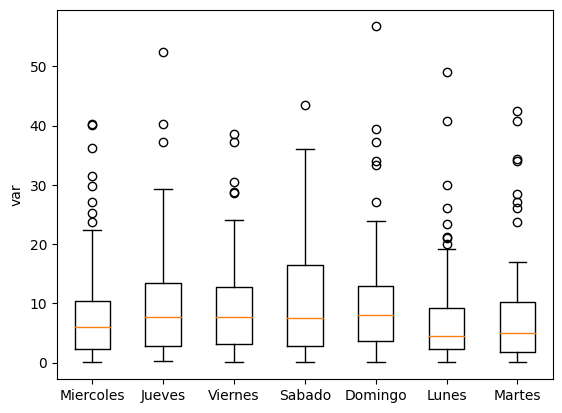

In [ ]:
box(1,7,"dia")

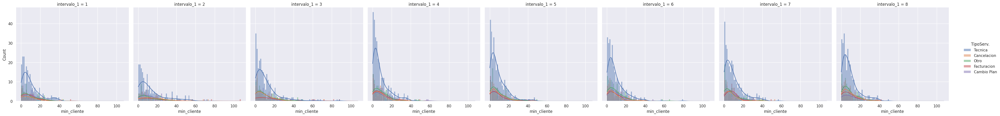

##Arreglando para el intervalo 2 y 7

###Para agrupaciones de seis dias

In [ ]:
cosas=["Mes","dia","TipoServ."]
kruskal=pd.DataFrame()
levene=pd.DataFrame()
pruebavar=pd.DataFrame()
grupop={}
source=[]
intervalo=[]
arreglo=[]
pruebavar_results=[]
for l in arribo['dia'].unique():
  for m in arribo['dia'].unique():
    for n in arribo['dia'].unique():
      for o in arribo['dia'].unique():
        for p in arribo['dia'].unique():
          for q in arribo['dia'].unique():
            if l<m and m<n and n<o and o<p and p<q:
              for j in [2,7]:
                base=arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==j)&(arribo['dia']==l)|
                 (arribo['dia']==m)|
                  (arribo['dia']==n)|
                   (arribo['dia']==o)|
                    (arribo['dia']==p)|
                     (arribo['dia']==q)]
                for k in base['TipoServ.'].unique():
                  grupop[k]=base[(base["TipoServ."]==k)]['min_cliente']
                for i in cosas:
                  mete=(l,m,n,o,p,q)
                  arreglo.append(mete)
                  source.append(i)
                  intervalo.append(j)
                  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
                  levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
                  statistic, p_value = f_oneway(*grupop.values())
                  pruebavar_results.append({"Variable": i, "Intervalo": j, "Estadístico": statistic, "p-valor": p_value, "arreglo":mete})
                  pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
kruskal['intervalo']=intervalo
kruskal['arreglo']=arreglo
levene['intervalo']=intervalo
levene['arreglo']=arreglo
pruebavar['intervalo']=intervalo
pruebavar['arreglo']=arreglo
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal[(kruskal['intervalo']==7)&(kruskal['arreglo'].apply(lambda x: x[0] == 'Domingo'))&(kruskal['arreglo'].apply(lambda x: x[1] == 'Jueves'))&(kruskal['arreglo'].apply(lambda x: x[2] == 'Lunes'))&(kruskal['arreglo'].apply(lambda x: x[3] == 'Martes'))]

,Source,ddof1,H,p-unc,H0,intervalo,arreglo
Kruskal,Mes,2,2.263844,0.322413,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Vi..."
Kruskal,dia,5,8.754017,0.119287,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Vi..."
Kruskal,TipoServ.,4,2.741450,0.601981,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Vi..."
Kruskal,Mes,2,2.545372,0.280078,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Sa..."
Kruskal,dia,5,8.669887,0.122978,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Sa..."
Kruskal,TipoServ.,4,5.336903,0.254442,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Sa..."
Kruskal,Mes,2,1.432864,0.488492,True,7,"(Domingo, Jueves, Lunes, Martes, Sabado, Viernes)"
Kruskal,dia,5,7.926514,0.160332,True,7,"(Domingo, Jueves, Lunes, Martes, Sabado, Viernes)"
Kruskal,TipoServ.,4,5.543276,0.235952,True,7,"(Domingo, Jueves, Lunes, Martes, Sabado, Viernes)"


In [ ]:
levene[(levene['intervalo']==7)&(levene['arreglo'].apply(lambda x: x[1] == 'Jueves'))&(levene['arreglo'].apply(lambda x: x[2] == 'Lunes'))&(levene['arreglo'].apply(lambda x: x[3] == 'Martes'))]

,W,pval,equal_var,intervalo,arreglo,Source
levene,2.106338,0.121745,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Vi...",Mes
levene,0.547413,0.772369,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Vi...",dia
levene,2.044942,0.085311,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Vi...",TipoServ.
levene,2.106338,0.121745,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Sa...",Mes
levene,0.547413,0.772369,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Sa...",dia
levene,2.044942,0.085311,True,7,"(Domingo, Jueves, Lunes, Martes, Miercoles, Sa...",TipoServ.
levene,2.106338,0.121745,True,7,"(Domingo, Jueves, Lunes, Martes, Sabado, Viernes)",Mes
levene,0.547413,0.772369,True,7,"(Domingo, Jueves, Lunes, Martes, Sabado, Viernes)",dia
levene,2.044942,0.085311,True,7,"(Domingo, Jueves, Lunes, Martes, Sabado, Viernes)",TipoServ.


###Para agrupaciones de cinco dias

In [ ]:
cosas=["Mes","dia","TipoServ."]
kruskal=pd.DataFrame()
levene=pd.DataFrame()
pruebavar=pd.DataFrame()
grupop={}
source=[]
intervalo=[]
arreglo=[]
pruebavar_results=[]
for l in arribo['dia'].unique():
  for m in arribo['dia'].unique():
    for n in arribo['dia'].unique():
      for o in arribo['dia'].unique():
        for p in arribo['dia'].unique():
            if l<m and m<n and n<o and o<p:
              for j in [2,7]:
                base=arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==j)&(arribo['dia']==l)|
                 (arribo['dia']==m)|
                  (arribo['dia']==n)|
                   (arribo['dia']==o)|
                    (arribo['dia']==p)]
                for k in base['TipoServ.'].unique():
                  grupop[k]=base[(base["TipoServ."]==k)]['min_cliente']
                for i in cosas:
                  mete=(l,m,n,o,p)
                  arreglo.append(mete)
                  source.append(i)
                  intervalo.append(j)
                  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
                  levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
                  statistic, p_value = f_oneway(*grupop.values())
                  pruebavar_results.append({"Variable": i, "Intervalo": j, "Estadístico": statistic, "p-valor": p_value, "arreglo":mete})
                  pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
kruskal['intervalo']=intervalo
kruskal['arreglo']=arreglo
levene['intervalo']=intervalo
levene['arreglo']=arreglo
pruebavar['intervalo']=intervalo
pruebavar['arreglo']=arreglo
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal[(kruskal['intervalo']==7)]

,Source,ddof1,H,p-unc,H0,intervalo,arreglo
Kruskal,Mes,2,1.413525,0.493239,True,7,"(Jueves, Lunes, Miercoles, Sabado, Viernes)"
Kruskal,dia,4,2.905381,0.573782,True,7,"(Jueves, Lunes, Miercoles, Sabado, Viernes)"
Kruskal,TipoServ.,4,7.248112,0.123343,True,7,"(Jueves, Lunes, Miercoles, Sabado, Viernes)"
Kruskal,Mes,2,2.406591,0.300203,True,7,"(Jueves, Lunes, Martes, Miercoles, Viernes)"
Kruskal,dia,4,4.379571,0.357067,True,7,"(Jueves, Lunes, Martes, Miercoles, Viernes)"
...,...,...,...,...,...,...,...
Kruskal,dia,4,5.978761,0.200740,True,7,"(Domingo, Martes, Miercoles, Sabado, Viernes)"
Kruskal,TipoServ.,4,7.437974,0.114476,True,7,"(Domingo, Martes, Miercoles, Sabado, Viernes)"
Kruskal,Mes,2,0.847508,0.654585,True,7,"(Lunes, Martes, Miercoles, Sabado, Viernes)"
Kruskal,dia,4,3.813208,0.431875,True,7,"(Lunes, Martes, Miercoles, Sabado, Viernes)"


In [ ]:
levene[(levene['intervalo']==7)]

,W,pval,equal_var,intervalo,arreglo,Source
levene,2.106338,0.121745,True,7,"(Jueves, Lunes, Miercoles, Sabado, Viernes)",Mes
levene,0.547413,0.772369,True,7,"(Jueves, Lunes, Miercoles, Sabado, Viernes)",dia
levene,2.044942,0.085311,True,7,"(Jueves, Lunes, Miercoles, Sabado, Viernes)",TipoServ.
levene,2.106338,0.121745,True,7,"(Jueves, Lunes, Martes, Miercoles, Viernes)",Mes
levene,0.547413,0.772369,True,7,"(Jueves, Lunes, Martes, Miercoles, Viernes)",dia
...,...,...,...,...,...,...
levene,0.547413,0.772369,True,7,"(Domingo, Martes, Miercoles, Sabado, Viernes)",dia
levene,2.044942,0.085311,True,7,"(Domingo, Martes, Miercoles, Sabado, Viernes)",TipoServ.
levene,2.106338,0.121745,True,7,"(Lunes, Martes, Miercoles, Sabado, Viernes)",Mes
levene,0.547413,0.772369,True,7,"(Lunes, Martes, Miercoles, Sabado, Viernes)",dia


In [ ]:
pruebavar[(pruebavar['equal_var']==True)&(pruebavar['Source']=="dia")]

###Para grupos de cuatro dias

In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1"]
kruskal=pd.DataFrame()
levene=pd.DataFrame()
pruebavar=pd.DataFrame()
grupop={}
source=[]
intervalo=[]
arreglo=[]
pruebavar_results=[]
for l in arribo['dia'].unique():
  for m in arribo['dia'].unique():
    for n in arribo['dia'].unique():
      for o in arribo['dia'].unique():
            if l<m and m<n and n<o:
              for j in [2,7]:
                base=arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==j)&(arribo['dia']==l)|
                 (arribo['dia']==m)|
                  (arribo['dia']==n)|
                   (arribo['dia']==o)]
                for k in base['TipoServ.'].unique():
                  grupop[k]=base[(base["TipoServ."]==k)]['min_cliente']
                for i in cosas:
                  mete=(l,m,n,o)
                  arreglo.append(mete)
                  source.append(i)
                  intervalo.append(j)
                  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
                  levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
                  statistic, p_value = f_oneway(*grupop.values())
                  pruebavar_results.append({"Variable": i, "Intervalo": j, "Estadístico": statistic, "p-valor": p_value, "arreglo":mete})
                  pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
kruskal['intervalo']=intervalo
kruskal['arreglo']=arreglo
levene['intervalo']=intervalo
levene['arreglo']=arreglo
pruebavar['intervalo']=intervalo
pruebavar['arreglo']=arreglo
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal[(kruskal['arreglo'].apply(lambda x: x[0] == 'Martes'))&(kruskal['arreglo'].apply(lambda x: x[1] == 'Miercoles'))&(kruskal['intervalo']==2)]

,Source,ddof1,H,p-unc,H0,intervalo,arreglo
Kruskal,Mes,2,0.749774,6.873670e-01,True,2,"(Martes, Miercoles, Sabado, Viernes)"
Kruskal,dia,3,1.008422,7.992140e-01,True,2,"(Martes, Miercoles, Sabado, Viernes)"
Kruskal,TipoServ.,4,8.838314,6.527039e-02,True,2,"(Martes, Miercoles, Sabado, Viernes)"
Kruskal,intervalo_1,8,63.030870,1.181391e-10,False,2,"(Martes, Miercoles, Sabado, Viernes)"


In [ ]:
levene[(levene['arreglo'].apply(lambda x: x[0] == 'Martes'))&(levene['arreglo'].apply(lambda x: x[1] == 'Miercoles'))&(levene["intervalo"]==2)]

,W,pval,equal_var,intervalo,arreglo,Source
levene,2.106338,1.217450e-01,True,2,"(Martes, Miercoles, Sabado, Viernes)",Mes
levene,0.547413,7.723694e-01,True,2,"(Martes, Miercoles, Sabado, Viernes)",dia
levene,2.044942,8.531060e-02,True,2,"(Martes, Miercoles, Sabado, Viernes)",TipoServ.
levene,20.269096,1.137095e-30,False,2,"(Martes, Miercoles, Sabado, Viernes)",intervalo_1


In [ ]:
arreglo

[('Jueves', 'Miercoles', 'Sabado', 'Viernes'),
 ('Jueves', 'Miercoles', 'Sabado', 'Viernes'),
 ('Jueves', 'Miercoles', 'Sabado', 'Viernes'),
 ('Jueves', 'Miercoles', 'Sabado', 'Viernes'),
 ('Jueves', 'Miercoles', 'Sabado', 'Viernes'),
 ('Jueves', 'Miercoles', 'Sabado', 'Viernes'),
 ('Jueves', 'Lunes', 'Miercoles', 'Viernes'),
 ('Jueves', 'Lunes', 'Miercoles', 'Viernes'),
 ('Jueves', 'Lunes', 'Miercoles', 'Viernes'),
 ('Jueves', 'Lunes', 'Miercoles', 'Viernes'),
 ('Jueves', 'Lunes', 'Miercoles', 'Viernes'),
 ('Jueves', 'Lunes', 'Miercoles', 'Viernes'),
 ('Jueves', 'Lunes', 'Miercoles', 'Sabado'),
 ('Jueves', 'Lunes', 'Miercoles', 'Sabado'),
 ('Jueves', 'Lunes', 'Miercoles', 'Sabado'),
 ('Jueves', 'Lunes', 'Miercoles', 'Sabado'),
 ('Jueves', 'Lunes', 'Miercoles', 'Sabado'),
 ('Jueves', 'Lunes', 'Miercoles', 'Sabado'),
 ('Jueves', 'Lunes', 'Sabado', 'Viernes'),
 ('Jueves', 'Lunes', 'Sabado', 'Viernes'),
 ('Jueves', 'Lunes', 'Sabado', 'Viernes'),
 ('Jueves', 'Lunes', 'Sabado', 'Viernes'),


###Para grupos de tres dias

In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1"]
kruskal=pd.DataFrame()
levene=pd.DataFrame()
pruebavar=pd.DataFrame()
grupop={}
source=[]
intervalo=[]
arreglo=[]
pruebavar_results=[]
for l in arribo['dia'].unique():
  for m in arribo['dia'].unique():
    for n in arribo['dia'].unique():
            if l<m and m<n:
              for j in [2,7]:
                base=arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==j)&(arribo['dia']==l)|
                 (arribo['dia']==m)|
                  (arribo['dia']==n)]
                for k in base['TipoServ.'].unique():
                  grupop[k]=base[(base["TipoServ."]==k)]['min_cliente']
                for i in cosas:
                  mete=(l,m,n)
                  arreglo.append(mete)
                  source.append(i)
                  intervalo.append(j)
                  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
                  levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
                  statistic, p_value = f_oneway(*grupop.values())
                  pruebavar_results.append({"Variable": i, "Intervalo": j, "Estadístico": statistic, "p-valor": p_value, "arreglo":mete})
                  pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
kruskal['intervalo']=intervalo
kruskal['arreglo']=arreglo
levene['intervalo']=intervalo
levene['arreglo']=arreglo
pruebavar['intervalo']=intervalo
pruebavar['arreglo']=arreglo
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal[(kruskal['intervalo']==2)&(kruskal['arreglo'].apply(lambda x: x[0] == 'Martes'))&(kruskal['arreglo'].apply(lambda x: x[1] == 'Miercoles'))]

,Source,ddof1,H,p-unc,H0,intervalo,arreglo
Kruskal,Mes,2,1.948023,3.775654e-01,True,2,"(Martes, Miercoles, Viernes)"
Kruskal,dia,2,0.841032,6.567078e-01,True,2,"(Martes, Miercoles, Viernes)"
Kruskal,TipoServ.,4,3.207283,5.237554e-01,True,2,"(Martes, Miercoles, Viernes)"
Kruskal,intervalo_1,8,33.524123,4.953610e-05,False,2,"(Martes, Miercoles, Viernes)"
Kruskal,Mes,2,1.215917,5.444614e-01,True,2,"(Martes, Miercoles, Sabado)"
Kruskal,dia,2,0.825988,6.616664e-01,True,2,"(Martes, Miercoles, Sabado)"
Kruskal,TipoServ.,4,6.791834,1.473063e-01,True,2,"(Martes, Miercoles, Sabado)"
Kruskal,intervalo_1,8,44.681308,4.228809e-07,False,2,"(Martes, Miercoles, Sabado)"


In [ ]:
levene[(levene['intervalo']==2)&(levene['arreglo'].apply(lambda x: x[0] == 'Martes'))&(levene['arreglo'].apply(lambda x: x[1] == 'Miercoles'))]

,W,pval,equal_var,intervalo,arreglo,Source
levene,2.106338,1.217450e-01,True,2,"(Martes, Miercoles, Viernes)",Mes
levene,0.547413,7.723694e-01,True,2,"(Martes, Miercoles, Viernes)",dia
levene,2.044942,8.531060e-02,True,2,"(Martes, Miercoles, Viernes)",TipoServ.
levene,20.269096,1.137095e-30,False,2,"(Martes, Miercoles, Viernes)",intervalo_1
levene,2.106338,1.217450e-01,True,2,"(Martes, Miercoles, Sabado)",Mes
levene,0.547413,7.723694e-01,True,2,"(Martes, Miercoles, Sabado)",dia
levene,2.044942,8.531060e-02,True,2,"(Martes, Miercoles, Sabado)",TipoServ.
levene,20.269096,1.137095e-30,False,2,"(Martes, Miercoles, Sabado)",intervalo_1


###Para agrupacion de dos dias


In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1"]
kruskal=pd.DataFrame()
levene=pd.DataFrame()
pruebavar=pd.DataFrame()
grupop={}
source=[]
intervalo=[]
arreglo=[]
pruebavar_results=[]
for l in arribo['dia'].unique():
  for m in arribo['dia'].unique():
            if l<m:
              for j in [2,7]:
                base=arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==j)&(arribo['dia']==l)|
                 (arribo['dia']==m)]
                for k in base['TipoServ.'].unique():
                  grupop[k]=base[(base["TipoServ."]==k)]['min_cliente']
                for i in cosas:
                  mete=(l,m)
                  arreglo.append(mete)
                  source.append(i)
                  intervalo.append(j)
                  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
                  levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
                  statistic, p_value = f_oneway(*grupop.values())
                  pruebavar_results.append({"Variable": i, "Intervalo": j, "Estadístico": statistic, "p-valor": p_value, "arreglo":mete})
                  pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
kruskal['intervalo']=intervalo
kruskal['arreglo']=arreglo
levene['intervalo']=intervalo
levene['arreglo']=arreglo
pruebavar['intervalo']=intervalo
pruebavar['arreglo']=arreglo
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal[(kruskal['H0'] == True)&(kruskal['intervalo']==2)]

,Source,ddof1,H,p-unc,H0,intervalo,arreglo
Kruskal,Mes,2,0.032455,0.983904,True,2,"(Miercoles, Viernes)"
Kruskal,TipoServ.,4,6.071644,0.193861,True,2,"(Miercoles, Viernes)"
Kruskal,Mes,2,0.155897,0.925012,True,2,"(Miercoles, Sabado)"
Kruskal,TipoServ.,4,8.399917,0.077980,True,2,"(Miercoles, Sabado)"
Kruskal,Mes,2,2.894280,0.235242,True,2,"(Jueves, Miercoles)"
Kruskal,TipoServ.,4,3.077079,0.545010,True,2,"(Jueves, Miercoles)"
Kruskal,Mes,2,0.307864,0.857330,True,2,"(Jueves, Viernes)"
Kruskal,TipoServ.,4,6.141288,0.188842,True,2,"(Jueves, Viernes)"
Kruskal,Mes,2,0.522402,0.770126,True,2,"(Jueves, Sabado)"
Kruskal,TipoServ.,4,7.309879,0.120391,True,2,"(Jueves, Sabado)"


In [ ]:
levene[(levene['arreglo'].apply(lambda x: x[0] == 'Lunes'))&(levene['arreglo'].apply(lambda x: x[1] == 'Sabado'))&(levene['intervalo']==2)]

,W,pval,equal_var,intervalo,arreglo,Source
levene,2.106338,0.121745,True,2,"(Lunes, Sabado)",Mes
levene,0.547413,0.772369,True,2,"(Lunes, Sabado)",dia
levene,2.044942,0.085311,True,2,"(Lunes, Sabado)",TipoServ.


In [ ]:
kruskal[(kruskal['arreglo'].apply(lambda x: x[0] == 'Martes'))&(kruskal['arreglo'].apply(lambda x: x[1] == 'Miercoles'))]

,Source,ddof1,H,p-unc,H0,intervalo,arreglo
Kruskal,Mes,2,3.909556,0.141596,True,2,"(Martes, Miercoles)"
Kruskal,dia,1,0.333191,0.563786,True,2,"(Martes, Miercoles)"
Kruskal,TipoServ.,4,3.405554,0.492384,True,2,"(Martes, Miercoles)"
Kruskal,Mes,2,2.585614,0.274499,True,7,"(Martes, Miercoles)"
Kruskal,dia,1,1.921367,0.165706,True,7,"(Martes, Miercoles)"
Kruskal,TipoServ.,4,4.674563,0.322348,True,7,"(Martes, Miercoles)"


In [ ]:
levene[(levene['arreglo'].apply(lambda x: x[0] == 'Martes'))&(levene['arreglo'].apply(lambda x: x[1] == 'Miercoles'))]

,W,pval,equal_var,intervalo,arreglo,Source
levene,2.106338,0.121745,True,2,"(Martes, Miercoles)",Mes
levene,0.547413,0.772369,True,2,"(Martes, Miercoles)",dia
levene,2.044942,0.085311,True,2,"(Martes, Miercoles)",TipoServ.
levene,2.106338,0.121745,True,7,"(Martes, Miercoles)",Mes
levene,0.547413,0.772369,True,7,"(Martes, Miercoles)",dia
levene,2.044942,0.085311,True,7,"(Martes, Miercoles)",TipoServ.


In [ ]:
levene[(levene['arreglo'].apply(lambda x: x[0] == 'Lunes'))&(levene['arreglo'].apply(lambda x: x[1] == 'Sabado'))]

,W,pval,equal_var,intervalo,arreglo,Source
levene,2.106338,0.121745,True,2,"(Lunes, Sabado)",Mes
levene,0.547413,0.772369,True,2,"(Lunes, Sabado)",dia
levene,2.044942,0.085311,True,2,"(Lunes, Sabado)",TipoServ.
levene,2.106338,0.121745,True,7,"(Lunes, Sabado)",Mes
levene,0.547413,0.772369,True,7,"(Lunes, Sabado)",dia
levene,2.044942,0.085311,True,7,"(Lunes, Sabado)",TipoServ.


In [ ]:
Anova[(Anova['H0']==True)&(Anova['Variable']=="dia")]

In [ ]:
levene[(levene['Source']=="dia")&(levene['equal_var']==True)]

In [ ]:
pruebavar[(pruebavar['equal_var']==True)&(pruebavar['Source']=="dia")]

###Para solo un dia

In [ ]:
cosas=["Mes","dia","TipoServ."]
kruskal=pd.DataFrame()
levene=pd.DataFrame()
pruebavar=pd.DataFrame()
grupop={}
source=[]
intervalo=[]
arreglo=[]
pruebavar_results=[]
for l in arribo['dia'].unique():
              for j in [2,7]:
                base=arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==j)&(arribo['dia']==l)]
                for k in base['TipoServ.'].unique():
                  grupop[k]=base[(base["TipoServ."]==k)]['min_cliente']
                for i in cosas:
                  mete=(l)
                  arreglo.append(mete)
                  source.append(i)
                  intervalo.append(j)
                  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
                  levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
                  statistic, p_value = f_oneway(*grupop.values())
                  pruebavar_results.append({"Variable": i, "Intervalo": j, "Estadístico": statistic, "p-valor": p_value, "arreglo":mete})
                  pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
kruskal['intervalo']=intervalo
kruskal['arreglo']=arreglo
levene['intervalo']=intervalo
levene['arreglo']=arreglo
pruebavar['intervalo']=intervalo
pruebavar['arreglo']=arreglo
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal[(kruskal['arreglo']=="Sabado")&(kruskal['intervalo']==7)]

,Source,ddof1,H,p-unc,H0,intervalo,arreglo
Kruskal,Mes,2,3.876579,0.14395,True,7,Sabado
Kruskal,dia,0,0.000000,NaN,True,7,Sabado
Kruskal,TipoServ.,4,4.663136,0.32364,True,7,Sabado


In [ ]:
levene[(levene['arreglo']=="Sabado")&(levene['intervalo']==7)]

,W,pval,equal_var,intervalo,arreglo,Source
levene,2.106338,0.121745,True,7,Sabado,Mes
levene,0.547413,0.772369,True,7,Sabado,dia
levene,2.044942,0.085311,True,7,Sabado,TipoServ.


##Arreglando el intervalo 5


###Para duplas de meses

In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1"]
kruskal=pd.DataFrame()
levene=pd.DataFrame()
pruebavar=pd.DataFrame()
grupop={}
source=[]
intervalo=[]
arreglo=[]
pruebavar_results=[]
for l in arribo['Mes'].unique():
  for m in arribo['Mes'].unique():
            if l<m:
                j=5
                base=arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==j)&(arribo['Mes']==l)|
                 (arribo['Mes']==m)]
                for i in cosas:
                  mete=(l,m)
                  arreglo.append(mete)
                  source.append(i)
                  intervalo.append(j)
                  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
                  levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
                  for k in base['TipoServ.'].unique():
                    grupop[k]=base[(base["TipoServ."]==k)]['min_cliente']
                  statistic, p_value = f_oneway(*grupop.values())
                  pruebavar_results.append({"Variable": i, "Intervalo": j, "Estadístico": statistic, "p-valor": p_value, "arreglo":mete})
                  pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
kruskal['intervalo']=intervalo
kruskal['arreglo']=arreglo
levene['intervalo']=intervalo
levene['arreglo']=arreglo
pruebavar['intervalo']=intervalo
pruebavar['arreglo']=arreglo
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal

,Source,ddof1,H,p-unc,H0,intervalo,arreglo
Kruskal,Mes,1,1.733624,1.879488e-01,True,5,"(Abril, Septiembre)"
Kruskal,dia,6,2.555937,8.621557e-01,True,5,"(Abril, Septiembre)"
Kruskal,TipoServ.,4,3.424607,4.894342e-01,True,5,"(Abril, Septiembre)"
Kruskal,intervalo_1,8,53.813779,7.502034e-09,False,5,"(Abril, Septiembre)"
Kruskal,Mes,1,3.933275,4.733967e-02,False,5,"(Abril, Noviembre)"
Kruskal,dia,6,10.197685,1.165702e-01,True,5,"(Abril, Noviembre)"
Kruskal,TipoServ.,4,4.699424,3.195512e-01,True,5,"(Abril, Noviembre)"
Kruskal,intervalo_1,8,34.156074,3.806444e-05,False,5,"(Abril, Noviembre)"
Kruskal,Mes,1,10.965734,9.281217e-04,False,5,"(Noviembre, Septiembre)"
Kruskal,dia,6,2.660879,8.500461e-01,True,5,"(Noviembre, Septiembre)"


In [ ]:
levene

,W,pval,equal_var,intervalo,arreglo,Source
levene,2.106338,1.217450e-01,True,5,"(Abril, Septiembre)",Mes
levene,0.547413,7.723694e-01,True,5,"(Abril, Septiembre)",dia
levene,2.044942,8.531060e-02,True,5,"(Abril, Septiembre)",TipoServ.
levene,20.269096,1.137095e-30,False,5,"(Abril, Septiembre)",intervalo_1
levene,2.106338,1.217450e-01,True,5,"(Abril, Noviembre)",Mes
levene,0.547413,7.723694e-01,True,5,"(Abril, Noviembre)",dia
levene,2.044942,8.531060e-02,True,5,"(Abril, Noviembre)",TipoServ.
levene,20.269096,1.137095e-30,False,5,"(Abril, Noviembre)",intervalo_1
levene,2.106338,1.217450e-01,True,5,"(Noviembre, Septiembre)",Mes
levene,0.547413,7.723694e-01,True,5,"(Noviembre, Septiembre)",dia


###Meses solos

In [ ]:
cosas=["Mes","dia","TipoServ.","intervalo_1"]
kruskal=pd.DataFrame()
levene=pd.DataFrame()
pruebavar=pd.DataFrame()
grupop={}
source=[]
intervalo=[]
arreglo=[]
pruebavar_results=[]
for l in arribo['Mes'].unique():
                j=5
                base=arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==j)&(arribo['Mes']==l)]
                for i in cosas:
                  mete=(l)
                  arreglo.append(mete)
                  source.append(i)
                  intervalo.append(j)
                  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='min_cliente', between=i)])
                  levene=pd.concat([levene,pd.DataFrame(pg.homoscedasticity(arribo, dv="min_cliente", group=i))])
                  for k in base['TipoServ.'].unique():
                    grupop[k]=base[(base["TipoServ."]==k)]['min_cliente']
                  statistic, p_value = f_oneway(*grupop.values())
                  pruebavar_results.append({"Variable": i, "Intervalo": j, "Estadístico": statistic, "p-valor": p_value, "arreglo":mete})
                  pruebavar=pd.concat([pruebavar,pg.homoscedasticity(arribo, dv="min_cliente", group=i, method="bartlett", alpha=.05)])
Anova = pd.DataFrame(pruebavar_results)
result=[]
for i in kruskal['p-unc']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
kruskal['H0']=result
result=[]
for i in Anova['p-valor']:
  if i<=0.05:
    result.append(False)
  else:
    result.append(True)
Anova['H0']=result
kruskal['intervalo']=intervalo
kruskal['arreglo']=arreglo
levene['intervalo']=intervalo
levene['arreglo']=arreglo
pruebavar['intervalo']=intervalo
pruebavar['arreglo']=arreglo
levene['Source']=source
pruebavar['Source']=source

In [ ]:
kruskal

,Source,ddof1,H,p-unc,H0,intervalo,arreglo
Kruskal,Mes,0,0.000000,NaN,True,5,Abril
Kruskal,dia,6,1.698207,0.945260,True,5,Abril
Kruskal,TipoServ.,4,1.721059,0.786889,True,5,Abril
Kruskal,intervalo_1,0,0.000000,NaN,True,5,Abril
Kruskal,Mes,0,0.000000,NaN,True,5,Septiembre
Kruskal,dia,6,5.546247,0.475885,True,5,Septiembre
Kruskal,TipoServ.,4,3.111065,0.539414,True,5,Septiembre
Kruskal,intervalo_1,0,0.000000,NaN,True,5,Septiembre
Kruskal,Mes,0,0.000000,NaN,True,5,Noviembre
Kruskal,dia,6,6.096177,0.412503,True,5,Noviembre


In [ ]:
levene

,W,pval,equal_var,intervalo,arreglo,Source
levene,2.106338,1.217450e-01,True,5,Abril,Mes
levene,0.547413,7.723694e-01,True,5,Abril,dia
levene,2.044942,8.531060e-02,True,5,Abril,TipoServ.
levene,20.269096,1.137095e-30,False,5,Abril,intervalo_1
levene,2.106338,1.217450e-01,True,5,Septiembre,Mes
levene,0.547413,7.723694e-01,True,5,Septiembre,dia
levene,2.044942,8.531060e-02,True,5,Septiembre,TipoServ.
levene,20.269096,1.137095e-30,False,5,Septiembre,intervalo_1
levene,2.106338,1.217450e-01,True,5,Noviembre,Mes
levene,0.547413,7.723694e-01,True,5,Noviembre,dia


#Sacando las distribuciones de arribo


In [ ]:
def fit(x):
  print("Para el intervalo "+str(x))
  dfit = distfit()
  results2 = dfit.fit_transform(arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==x)]['min_cliente'])
  results2['summary'].to_excel(str(x)+".xlsx")
  return dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00483936] [loc=9.885 scale=9.194]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000162809] [loc=0.000 scale=9.885]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000162809] [loc=-536870912.000 scale=536870912.000]
[distfit] >INFO> [dweibull  ] [0.02 sec] [RSS: 0.00372114] [loc=7.932 scale=7.037]


Para el intervalo 1


[distfit] >INFO> [t         ] [0.51 sec] [RSS: 0.00353804] [loc=7.640 scale=6.139]
[distfit] >INFO> [genextreme] [0.10 sec] [RSS: 0.00113505] [loc=4.799 scale=4.745]
[distfit] >INFO> [gamma     ] [0.04 sec] [RSS: 0.000163328] [loc=-0.001 scale=9.522]
[distfit] >INFO> [lognorm   ] [0.05 sec] [RSS: 0.000592334] [loc=-0.928 scale=7.474]
[distfit] >INFO> [beta      ] [0.27 sec] [RSS: 0.000150329] [loc=-0.000 scale=74.411]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0108834] [loc=0.000 scale=52.233]
[distfit] >INFO> [loggamma  ] [0.10 sec] [RSS: 0.00487664] [loc=-2965.712 scale=398.171]
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00773526] [loc=10.934 scale=13.419]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000379696] [loc=0.017 scale=10.917]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 7.6386e-05] [loc=-44.668 scale=44.685]
[distfit] >INFO> [dweibull  ] [0.06 sec] [RSS: 0.00432183] [loc=5.650 scale=7.414]


Para el intervalo 3


[distfit] >INFO> [t         ] [0.39 sec] [RSS: 0.00405593] [loc=6.202 scale=5.240]
[distfit] >INFO> [genextreme] [0.27 sec] [RSS: 0.000445193] [loc=4.091 scale=4.423]
[distfit] >INFO> [gamma     ] [0.19 sec] [RSS: 0.0189933] [loc=0.017 scale=1.741]
[distfit] >INFO> [lognorm   ] [0.01 sec] [RSS: 0.000290642] [loc=-0.316 scale=6.305]
[distfit] >INFO> [beta      ] [0.30 sec] [RSS: 0.00260033] [loc=-1.937 scale=3213201644330227.000]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0142091] [loc=0.017 scale=88.333]
[distfit] >INFO> [loggamma  ] [0.16 sec] [RSS: 0.00784297] [loc=-3837.765 scale=527.091]
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00957751] [loc=8.725 scale=9.111]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000407009] [loc=0.017 scale=8.709]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000286197] [loc=-151.940 scale=151.957]
[distfit] >INFO> [dweibull  ] [0.06 sec] [RSS: 0.00742595] [loc=5.986 scale=6.311]


Para el intervalo 4


[distfit] >INFO> [t         ] [0.55 sec] [RSS: 0.00677878] [loc=5.922 scale=5.098]
[distfit] >INFO> [genextreme] [0.27 sec] [RSS: 0.00129734] [loc=3.630 scale=3.885]
[distfit] >INFO> [gamma     ] [0.18 sec] [RSS: 0.000177692] [loc=0.017 scale=9.618]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000546093] [loc=-0.419 scale=5.563]
[distfit] >INFO> [beta      ] [0.26 sec] [RSS: 0.000232105] [loc=0.017 scale=630.835]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0187412] [loc=0.017 scale=58.050]
[distfit] >INFO> [loggamma  ] [0.20 sec] [RSS: 0.00976467] [loc=-3119.546 scale=411.640]
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00836846] [loc=9.095 scale=9.492]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000343221] [loc=0.000 scale=9.095]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000374319] [loc=-246.609 scale=246.609]


Para el intervalo 6


[distfit] >INFO> [dweibull  ] [0.29 sec] [RSS: 0.0049399] [loc=5.417 scale=6.089]
[distfit] >INFO> [t         ] [0.50 sec] [RSS: 0.00475479] [loc=6.211 scale=4.870]
[distfit] >INFO> [genextreme] [0.23 sec] [RSS: 0.000865233] [loc=4.200 scale=4.104]
[distfit] >INFO> [gamma     ] [0.31 sec] [RSS: 0.0566243] [loc=-0.000 scale=1.733]
[distfit] >INFO> [lognorm   ] [0.05 sec] [RSS: 0.000369203] [loc=-0.645 scale=6.471]
[distfit] >INFO> [beta      ] [0.32 sec] [RSS: 0.00031034] [loc=-0.000 scale=231250644.574]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0207631] [loc=0.000 scale=79.500]
[distfit] >INFO> [loggamma  ] [0.10 sec] [RSS: 0.00862238] [loc=-3950.503 scale=504.270]
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00626325] [loc=9.253 scale=8.597]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000278479] [loc=0.017 scale=9.236]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000278479] [loc=-268435455.983 scale=268435456.000]
[di

Para el intervalo 8


[distfit] >INFO> [t         ] [0.44 sec] [RSS: 0.00409659] [loc=6.927 scale=5.355]
[distfit] >INFO> [genextreme] [0.16 sec] [RSS: 0.00120451] [loc=4.581 scale=4.417]
[distfit] >INFO> [gamma     ] [0.05 sec] [RSS: 0.000213753] [loc=0.015 scale=8.738]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000582235] [loc=-0.960 scale=7.208]
[distfit] >INFO> [beta      ] [0.34 sec] [RSS: 0.000295873] [loc=0.017 scale=71.626]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0144987] [loc=0.017 scale=48.783]
[distfit] >INFO> [loggamma  ] [0.16 sec] [RSS: 0.00638893] [loc=-2617.540 scale=354.317]


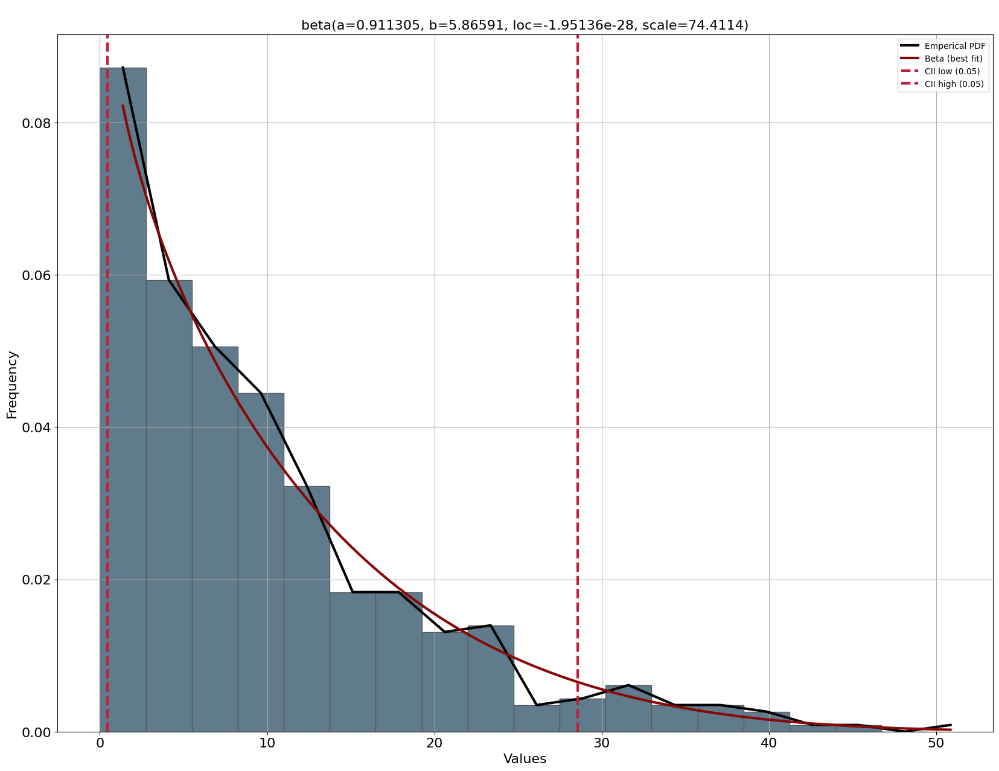

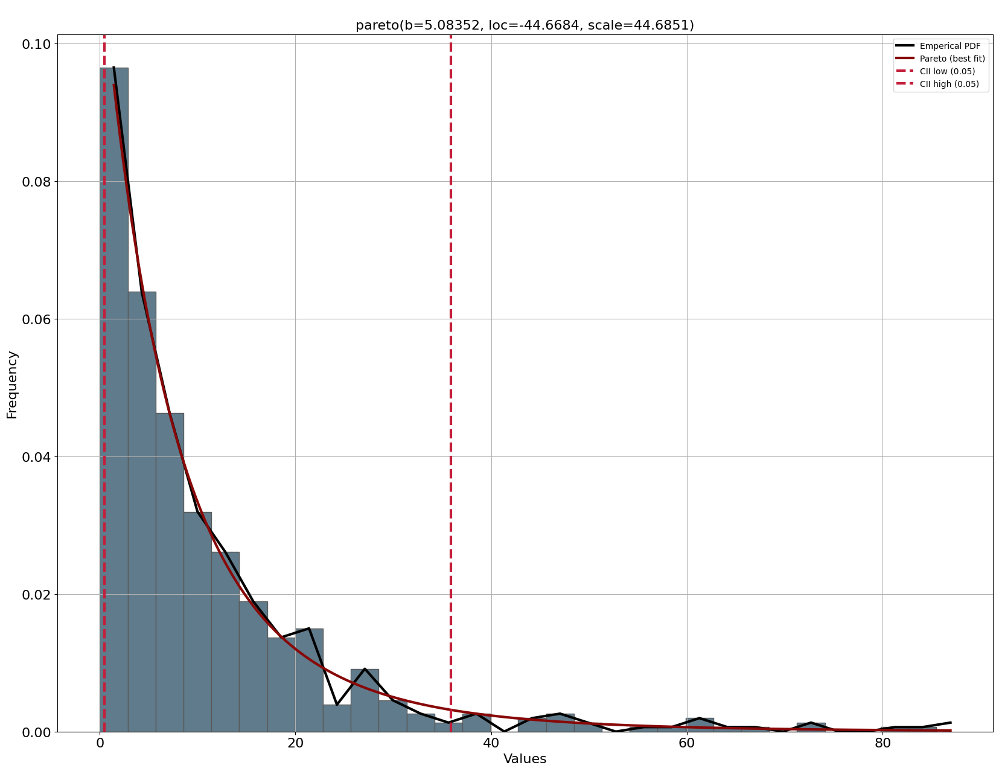

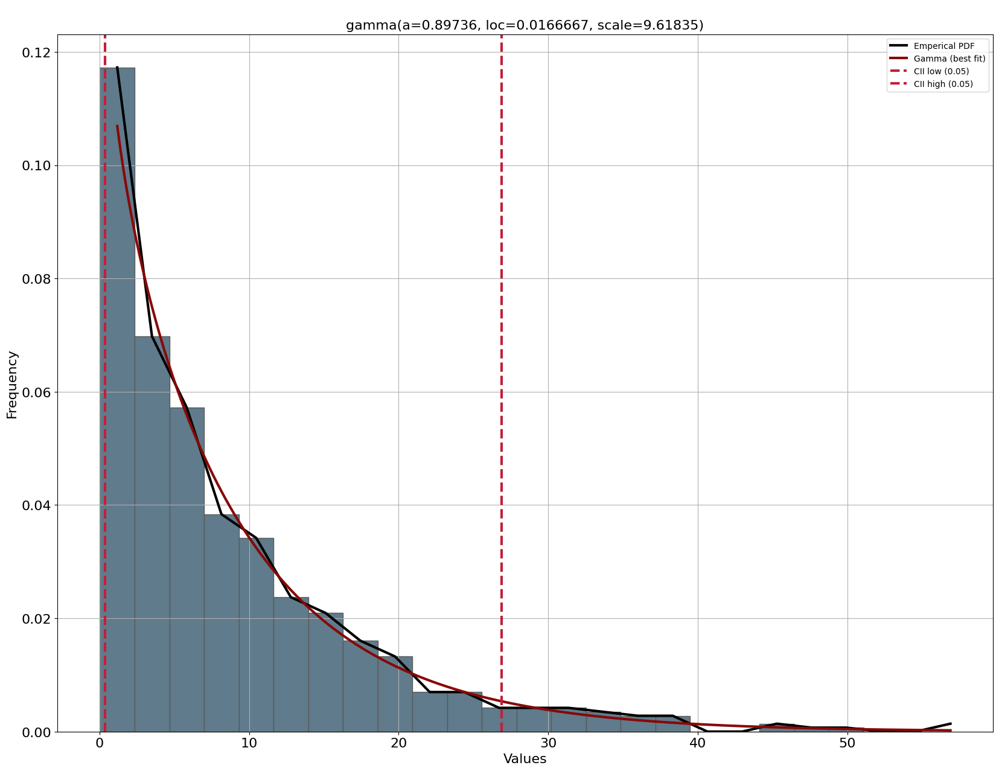

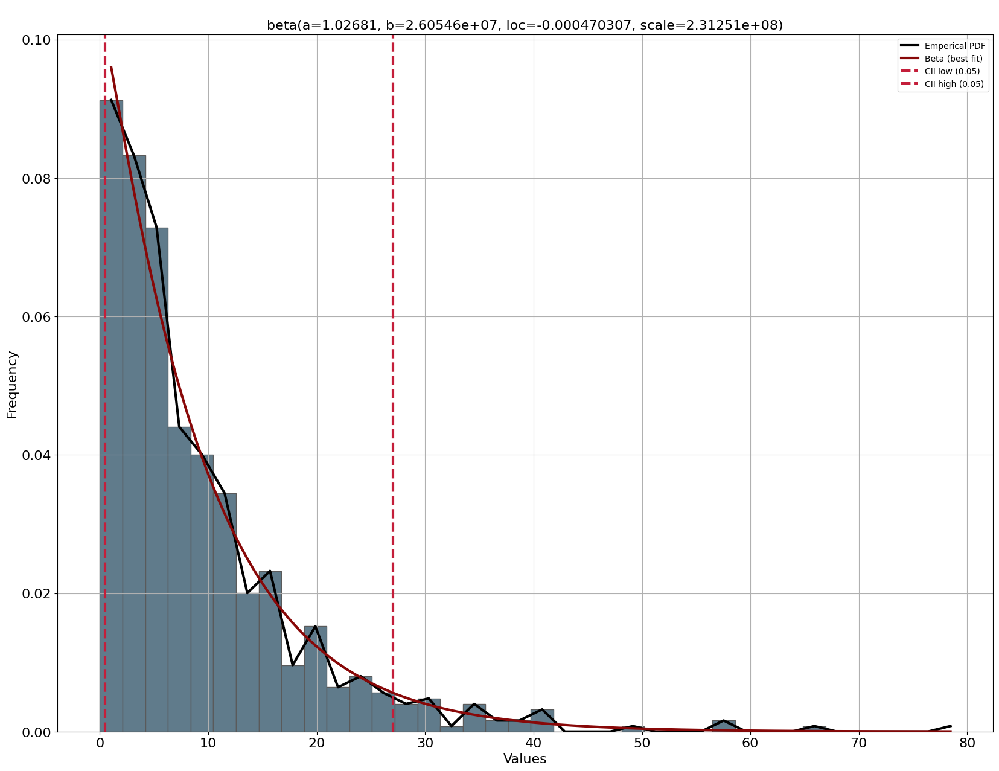

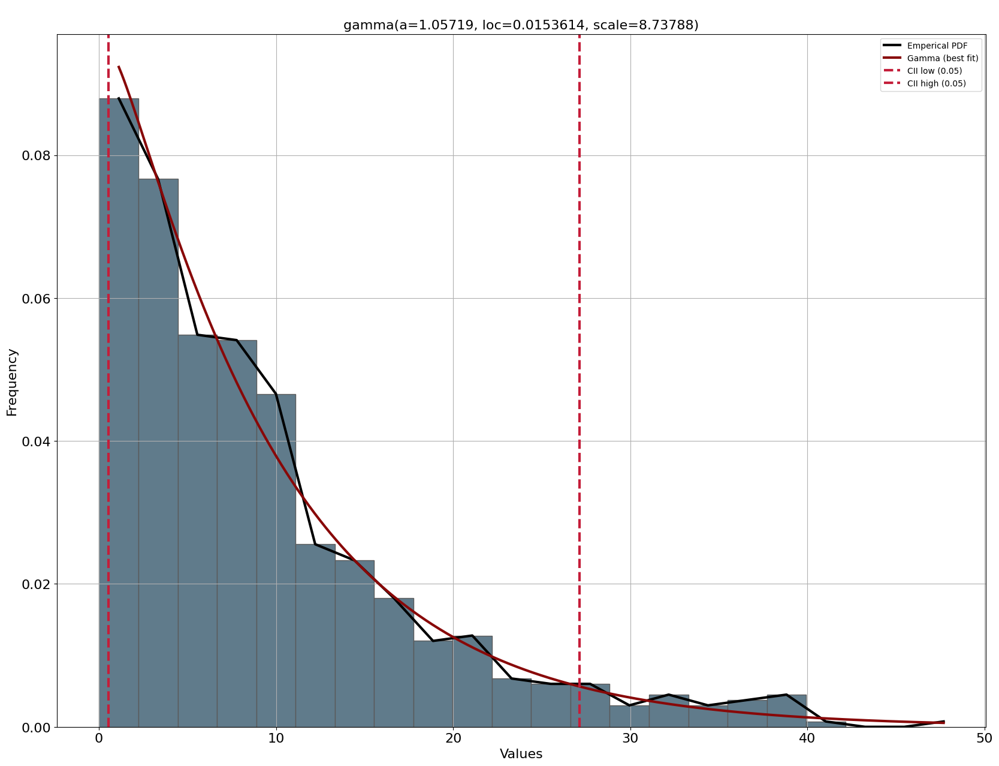

In [ ]:
for i in [1,3,4,6,8]:
  fit(i)

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0166764] [loc=8.909 scale=9.628]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000203307] [loc=0.000 scale=8.909]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000112785] [loc=-115.848 scale=115.848]


Para el intervalo 2


[distfit] >INFO> [dweibull  ] [0.28 sec] [RSS: 0.0113387] [loc=5.683 scale=6.176]
[distfit] >INFO> [t         ] [0.50 sec] [RSS: 0.010253] [loc=5.936 scale=4.881]
[distfit] >INFO> [genextreme] [0.29 sec] [RSS: 0.00320654] [loc=3.844 scale=3.998]
[distfit] >INFO> [gamma     ] [0.20 sec] [RSS: 0.000111689] [loc=-0.000 scale=9.707]
[distfit] >INFO> [lognorm   ] [0.40 sec] [RSS: 0.00146196] [loc=-0.542 scale=5.946]
[distfit] >INFO> [beta      ] [0.42 sec] [RSS: 0.000111059] [loc=-0.000 scale=750.522]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0388517] [loc=0.000 scale=88.350]
[distfit] >INFO> [loggamma  ] [0.34 sec] [RSS: 0.0169123] [loc=-3695.758 scale=478.450]


(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nbeta(a=0.916872, b=76.4413, loc=-2.21034e-28, scale=750.522)'}, xlabel='Values', ylabel='Frequency'>)

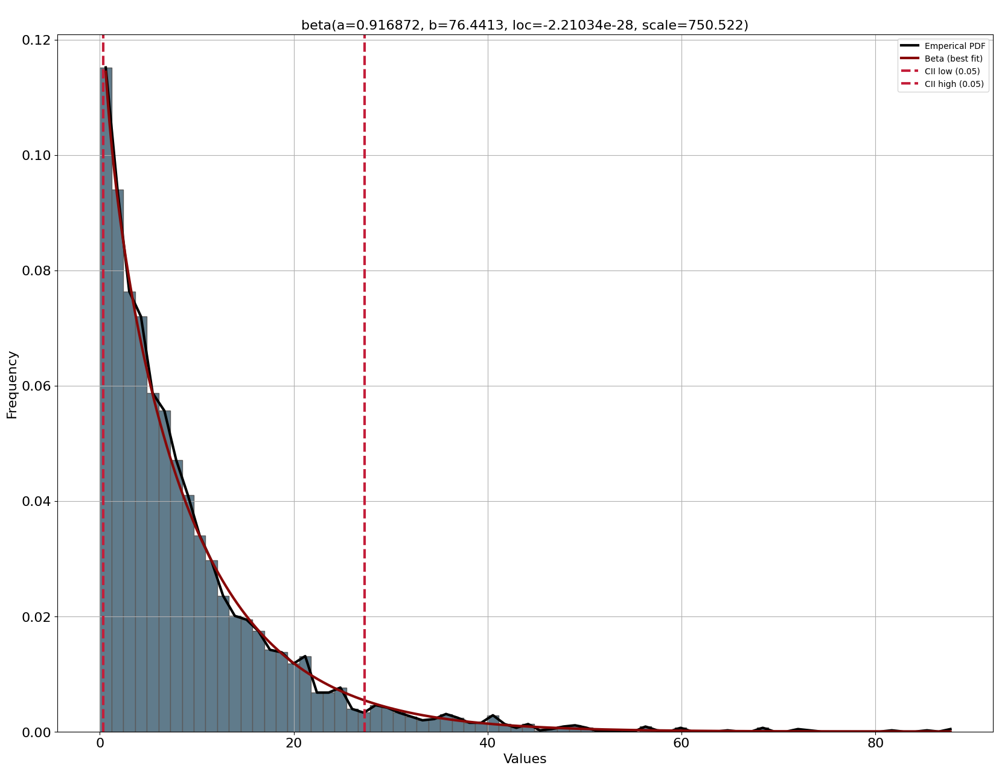

In [ ]:
x=2

print("Para el intervalo "+str(x))
dfit = distfit()
results2 = dfit.fit_transform(arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==x)&(arribo['dia']=="Martes")|(arribo['dia']=="Miercoles")|(arribo['dia']=="Sabado")|(arribo['dia']=="Viernes")]['min_cliente'])
results2['summary'].to_excel(str(x)+".xlsx")
dfit.plot()

In [ ]:
def fitd(d):
  x=2
  print("Para el intervalo "+str(x))
  dfit = distfit()
  results2 = dfit.fit_transform(arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==x)&(arribo['dia']==d)]['min_cliente'])
  results2['summary'].to_excel(str(x)+"_"+d+".xlsx")
  return dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0016659] [loc=13.182 scale=13.847]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000210543] [loc=0.233 scale=12.949]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000175959] [loc=-88.120 scale=88.353]
[distfit] >INFO> [dweibull  ] [0.02 sec] [RSS: 0.001185] [loc=11.214 scale=11.471]


Para el intervalo 2


[distfit] >INFO> [t         ] [0.22 sec] [RSS: 0.0011819] [loc=9.274 scale=9.004]
[distfit] >INFO> [genextreme] [0.10 sec] [RSS: 0.000326267] [loc=4.591 scale=5.288]
[distfit] >INFO> [gamma     ] [0.10 sec] [RSS: 0.000179588] [loc=0.233 scale=12.646]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000199462] [loc=-0.241 scale=7.248]
[distfit] >INFO> [beta      ] [0.18 sec] [RSS: 0.000338878] [loc=0.233 scale=80.490]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0026331] [loc=0.233 scale=56.817]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.00169564] [loc=-4406.315 scale=591.592]
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00150631] [loc=13.910 scale=14.673]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000163109] [loc=0.083 scale=13.827]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000175456] [loc=-218.758 scale=218.841]
[distfit] >INFO> [dweibull  ] [0.08 sec] [RSS: 0.00128886] [loc=9.300 scale=9.931]


Para el intervalo 2


[distfit] >INFO> [t         ] [0.29 sec] [RSS: 0.000904656] [loc=9.304 scale=7.292]
[distfit] >INFO> [genextreme] [0.11 sec] [RSS: 0.000414516] [loc=6.208 scale=6.014]
[distfit] >INFO> [gamma     ] [0.09 sec] [RSS: 0.000183592] [loc=0.083 scale=16.179]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000339221] [loc=-0.914 scale=9.753]
[distfit] >INFO> [beta      ] [0.14 sec] [RSS: 0.00019668] [loc=0.083 scale=1912.414]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00329398] [loc=0.083 scale=77.250]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.00159424] [loc=-4381.398 scale=602.478]
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00171574] [loc=14.470 scale=16.520]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000113298] [loc=0.100 scale=14.370]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000128565] [loc=-132.976 scale=133.076]
[distfit] >INFO> [dweibull  ] [0.08 sec] [RSS: 0.00218932] [loc=9.917 scale=9.378]


Para el intervalo 2


[distfit] >INFO> [t         ] [0.19 sec] [RSS: 0.0009878] [loc=9.927 scale=7.545]
[distfit] >INFO> [genextreme] [0.19 sec] [RSS: 0.000196874] [loc=6.612 scale=6.487]
[distfit] >INFO> [gamma     ] [0.09 sec] [RSS: 0.0024045] [loc=0.100 scale=1.739]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000218035] [loc=-1.011 scale=10.127]
[distfit] >INFO> [beta      ] [0.25 sec] [RSS: 0.000121606] [loc=0.100 scale=1677.722]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00396146] [loc=0.100 scale=107.250]
[distfit] >INFO> [loggamma  ] [0.20 sec] [RSS: 0.00177764] [loc=-4697.054 scale=648.425]


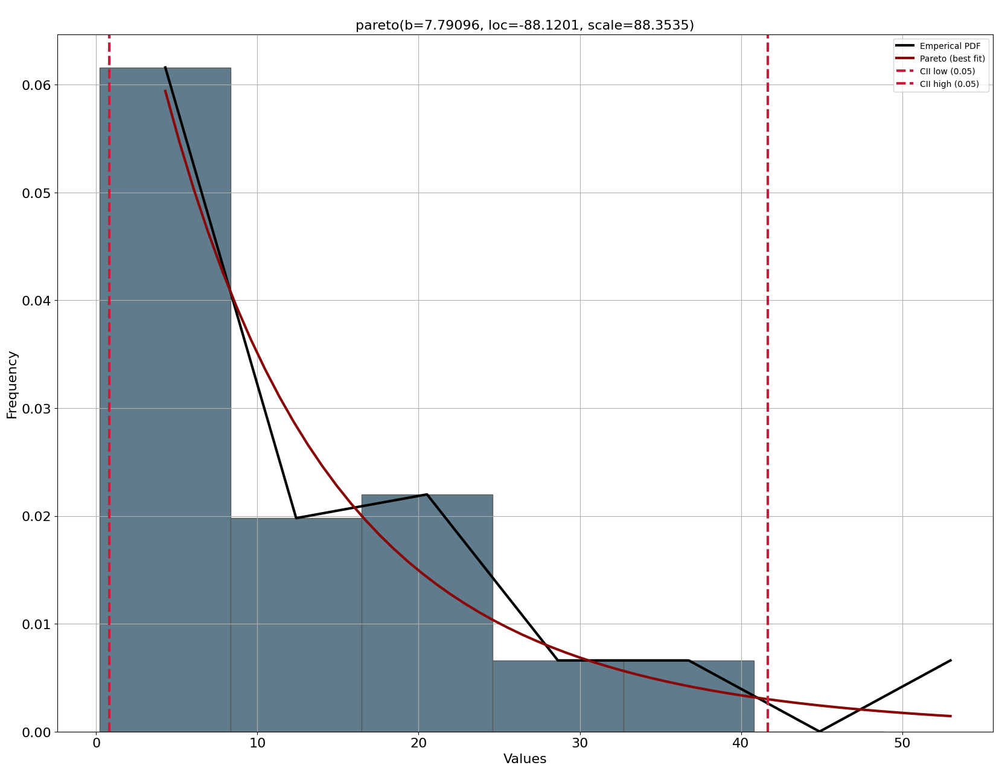

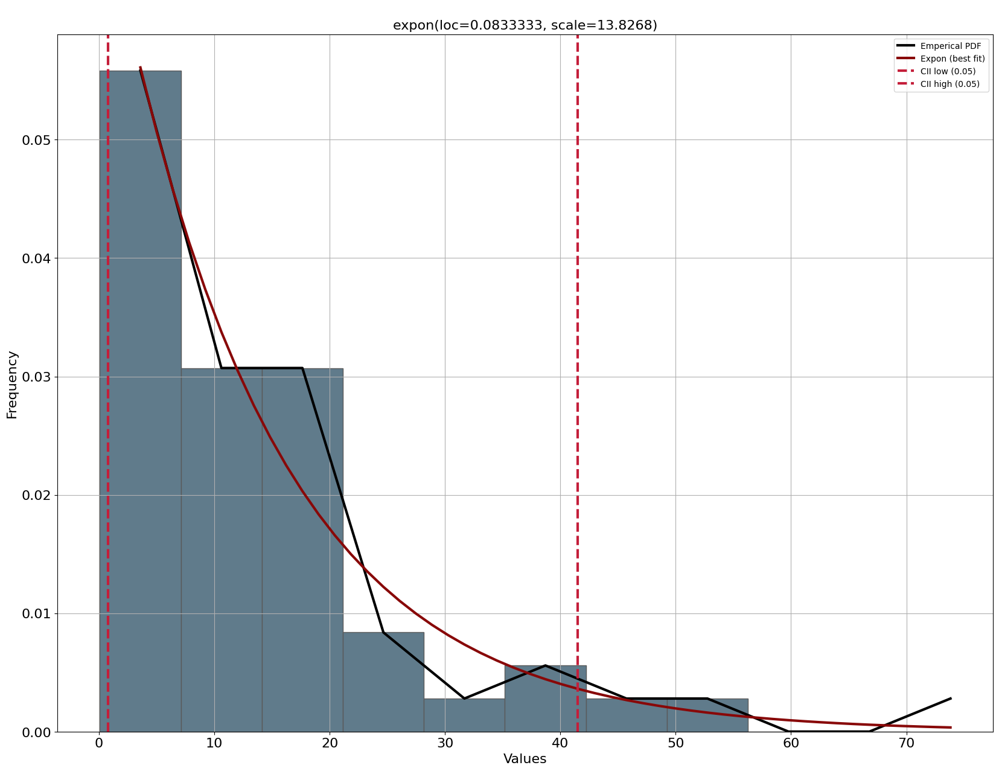

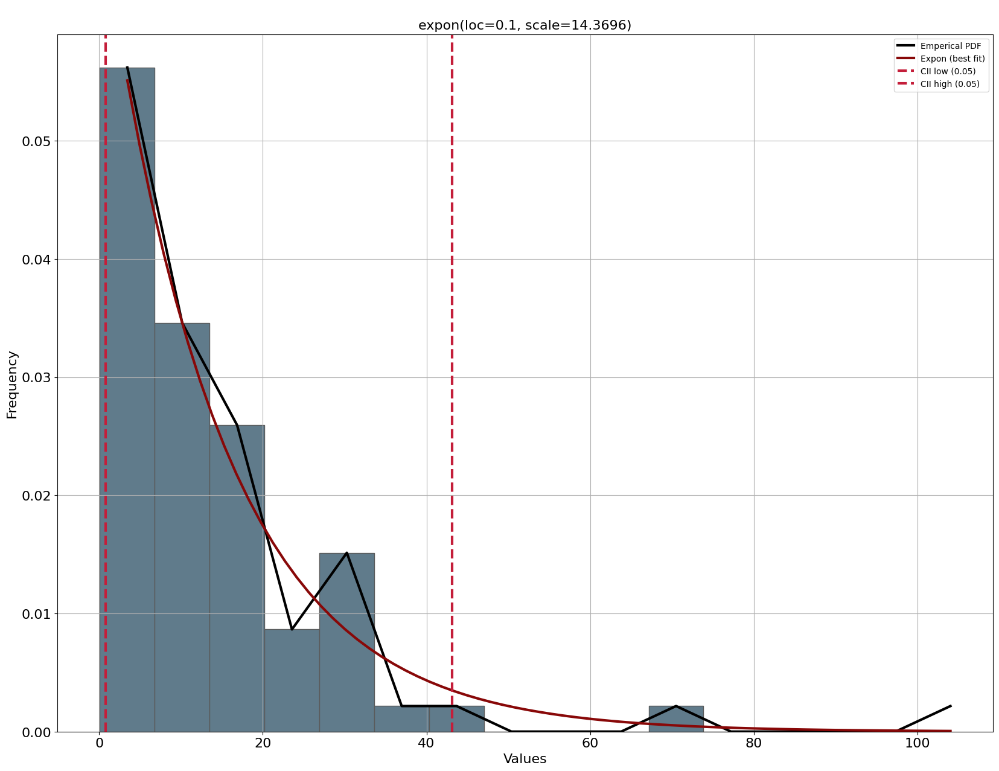

In [ ]:
for i in ["Lunes","Domingo","Jueves"]:
  fitd(i)

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0173431] [loc=8.416 scale=8.996]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000327648] [loc=0.017 scale=8.400]
[distfit] >INFO> [pareto    ] [0.01 sec] [RSS: 0.000205974] [loc=-129.859 scale=129.875]


Para el intervalo 5


[distfit] >INFO> [dweibull  ] [0.75 sec] [RSS: 0.012914] [loc=5.650 scale=5.957]
[distfit] >INFO> [t         ] [1.19 sec] [RSS: 0.0118715] [loc=5.815 scale=4.876]
[distfit] >INFO> [genextreme] [0.58 sec] [RSS: 0.00353496] [loc=3.608 scale=3.753]
[distfit] >INFO> [gamma     ] [0.30 sec] [RSS: 0.0480497] [loc=0.017 scale=3.001]
[distfit] >INFO> [lognorm   ] [0.01 sec] [RSS: 0.00151103] [loc=-0.434 scale=5.511]
[distfit] >INFO> [beta      ] [0.62 sec] [RSS: 0.000165874] [loc=0.017 scale=1195.008]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0425538] [loc=0.017 scale=107.333]
[distfit] >INFO> [loggamma  ] [0.23 sec] [RSS: 0.0178856] [loc=-2868.874 scale=388.356]


(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nbeta(a=0.933219, b=132.31, loc=0.0166667, scale=1195.01)'}, xlabel='Values', ylabel='Frequency'>)

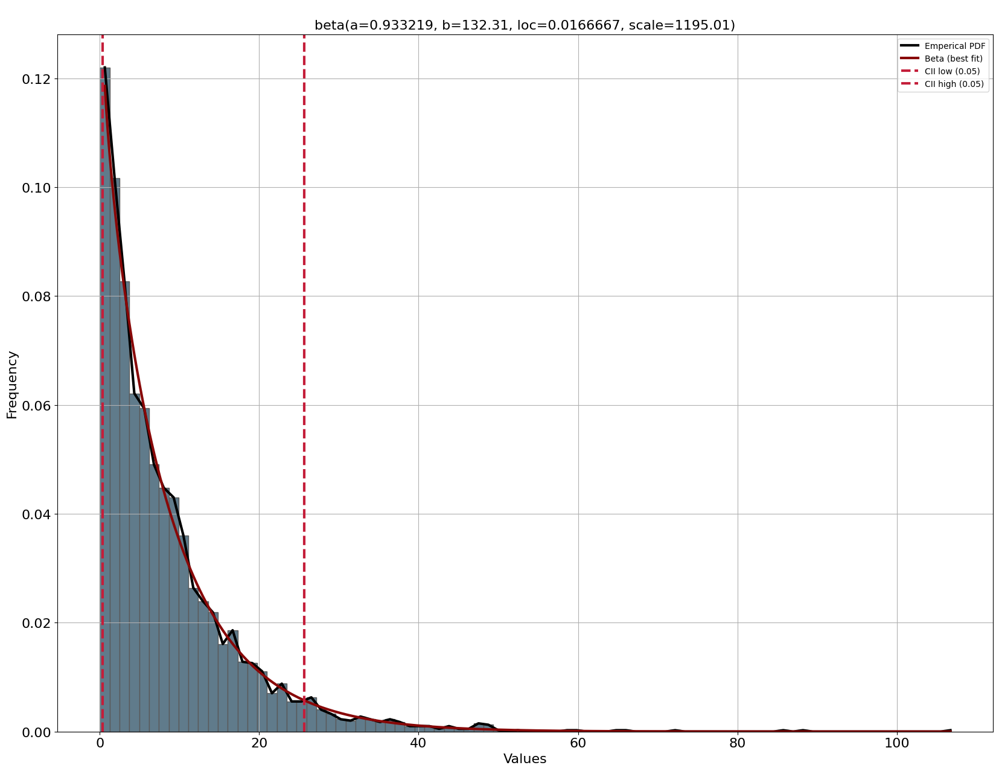

In [ ]:
x=5
print("Para el intervalo "+str(x))
dfit = distfit()
results2 = dfit.fit_transform(arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==x)&(arribo['Mes']=="Abril")|(arribo['Mes']=="Septiembre")]['min_cliente'])
results2['summary'].to_excel(str(x)+".xlsx")
dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00360505] [loc=10.475 scale=9.765]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.00090211] [loc=0.000 scale=10.475]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.00090211] [loc=-268435456.000 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [0.02 sec] [RSS: 0.00248253] [loc=8.756 scale=7.391]


Para el intervalo 5


[distfit] >INFO> [t         ] [0.40 sec] [RSS: 0.00175444] [loc=7.522 scale=5.643]
[distfit] >INFO> [genextreme] [0.15 sec] [RSS: 0.000149325] [loc=5.309 scale=4.951]
[distfit] >INFO> [gamma     ] [0.04 sec] [RSS: 0.00064712] [loc=-0.010 scale=9.381]
[distfit] >INFO> [lognorm   ] [0.09 sec] [RSS: 0.0131887] [loc=-0.000 scale=0.101]
[distfit] >INFO> [beta      ] [0.22 sec] [RSS: 0.000992392] [loc=-0.000 scale=60.476]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00770425] [loc=0.000 scale=46.867]
[distfit] >INFO> [loggamma  ] [0.12 sec] [RSS: 0.00371164] [loc=-4728.973 scale=584.901]


(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\ngenextreme(c=-0.378997, loc=5.3092, scale=4.95055)'}, xlabel='Values', ylabel='Frequency'>)

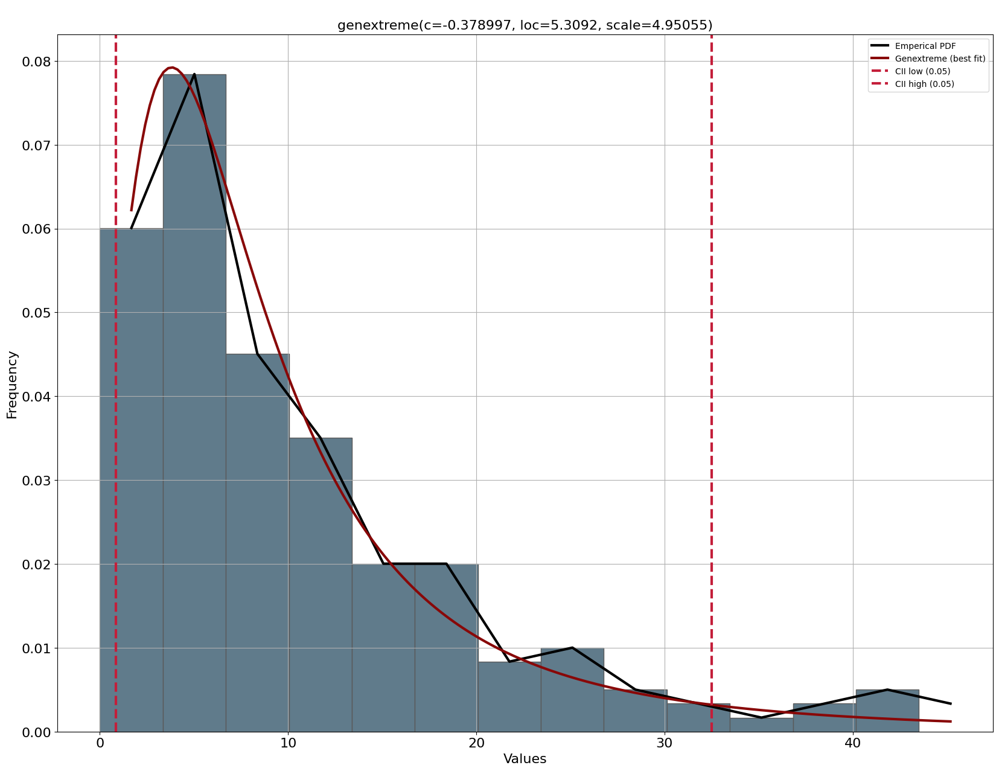

In [ ]:
x=5
print("Para el intervalo "+str(x))
dfit = distfit()
results2 = dfit.fit_transform(arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==x)&(arribo['Mes']=="Noviembre")]['min_cliente'])
results2['summary'].to_excel(str(x)+"_Noviembre.xlsx")
dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0197963] [loc=8.760 scale=9.335]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000177434] [loc=0.000 scale=8.760]
[distfit] >INFO> [pareto    ] [0.03 sec] [RSS: 9.60981e-05] [loc=-137.834 scale=137.834]


Para el intervalo 7


[distfit] >INFO> [dweibull  ] [0.81 sec] [RSS: 0.0135538] [loc=5.700 scale=6.107]
[distfit] >INFO> [t         ] [0.86 sec] [RSS: 0.0123927] [loc=5.899 scale=4.862]
[distfit] >INFO> [genextreme] [0.65 sec] [RSS: 0.00398883] [loc=3.798 scale=3.928]
[distfit] >INFO> [gamma     ] [0.38 sec] [RSS: 0.0854126] [loc=-0.000 scale=2.999]
[distfit] >INFO> [lognorm   ] [0.66 sec] [RSS: 0.00196038] [loc=-0.517 scale=5.853]
[distfit] >INFO> [beta      ] [0.66 sec] [RSS: 0.000106935] [loc=-0.000 scale=538.754]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0490324] [loc=0.000 scale=107.350]
[distfit] >INFO> [loggamma  ] [0.51 sec] [RSS: 0.0203937] [loc=-3626.245 scale=469.117]


(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\npareto(b=16.7349, loc=-137.834, scale=137.834)'}, xlabel='Values', ylabel='Frequency'>)

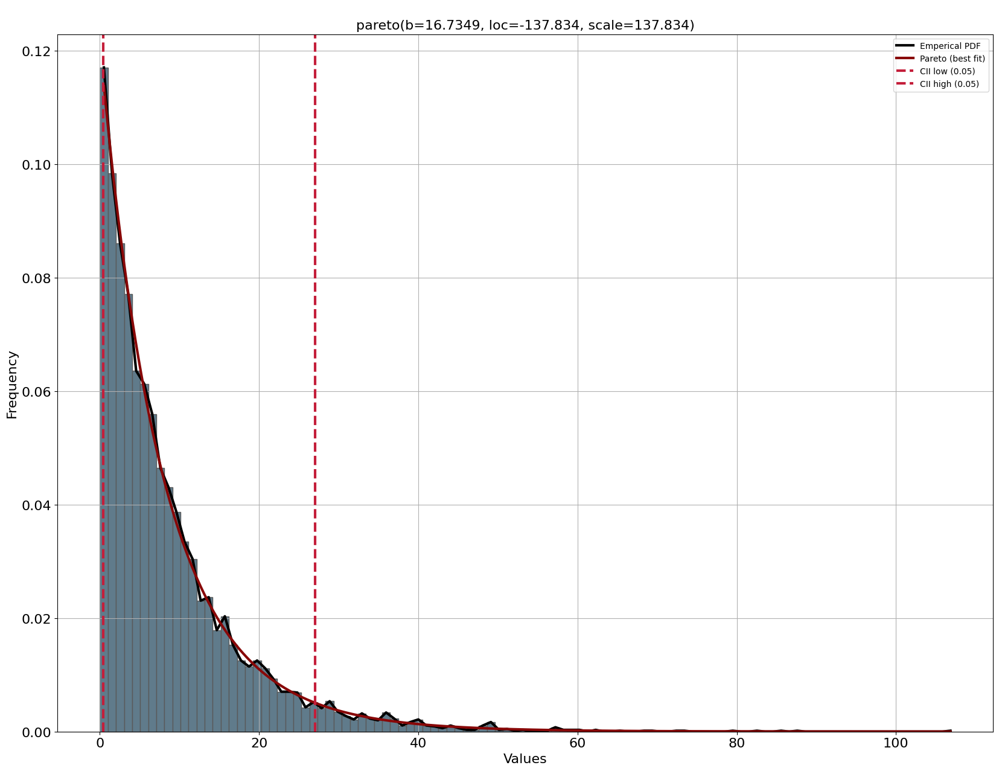

In [ ]:
x=7

print("Para el intervalo "+str(x))
dfit = distfit()
results2 = dfit.fit_transform(arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==x)&
 (arribo['dia']=="Domingo")|
  (arribo['dia']=="Jueves")|
   (arribo['dia']=="Lunes")|
    (arribo['dia']=="Martes")|
    (arribo['dia']=="Miercoles")|
    (arribo['dia']=="Viernes")]['min_cliente'])
results2['summary'].to_excel(str(x)+".xlsx")
dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00235559] [loc=11.220 scale=10.460]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000196237] [loc=0.167 scale=11.053]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000196237] [loc=-268435455.833 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [0.07 sec] [RSS: 0.00183801] [loc=8.528 scale=7.919]


Para el intervalo 7


[distfit] >INFO> [t         ] [0.78 sec] [RSS: 0.00139727] [loc=7.763 scale=6.550]
[distfit] >INFO> [genextreme] [0.17 sec] [RSS: 0.000351037] [loc=5.117 scale=4.990]
[distfit] >INFO> [gamma     ] [0.22 sec] [RSS: 0.000203108] [loc=0.167 scale=13.183]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000293305] [loc=-0.704 scale=7.961]
[distfit] >INFO> [beta      ] [0.30 sec] [RSS: 0.00103021] [loc=0.167 scale=46.933]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00359305] [loc=0.167 scale=43.367]
[distfit] >INFO> [loggamma  ] [0.14 sec] [RSS: 0.00238138] [loc=-2817.123 scale=393.694]


(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\npareto(b=2.42854e+07, loc=-2.68435e+08, scale=2.68435e+08)'}, xlabel='Values', ylabel='Frequency'>)

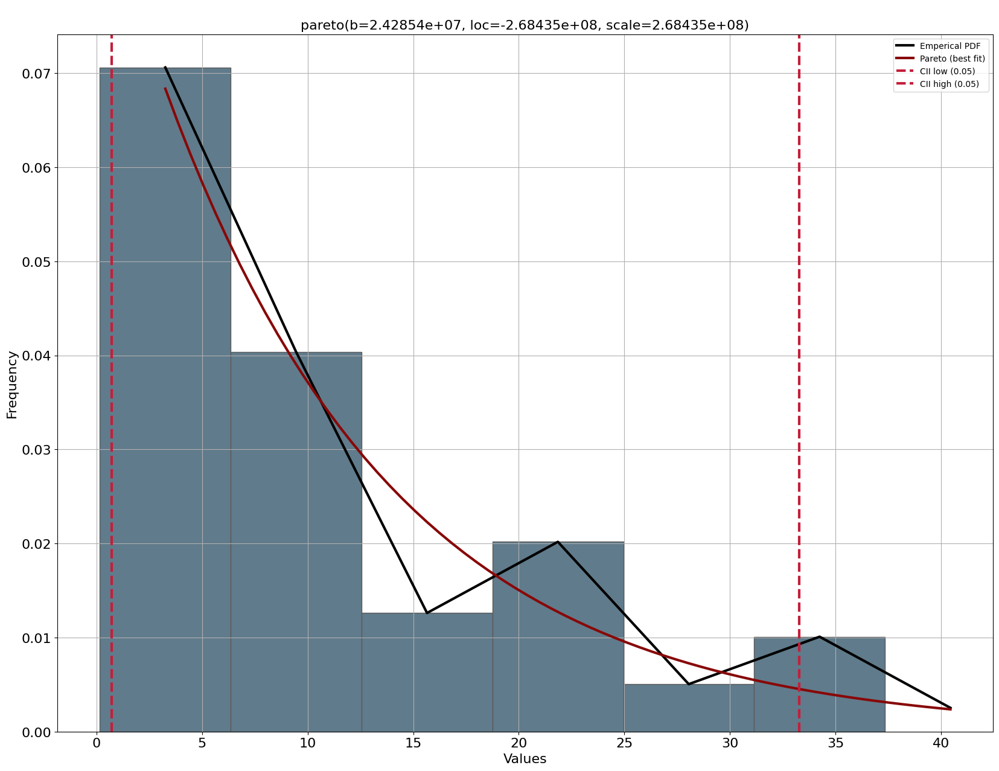

In [ ]:
x=7

print("Para el intervalo "+str(x))
dfit = distfit()
results2 = dfit.fit_transform(arribo[(arribo['Turno']==1)&(arribo['intervalo_1']==x)&
 (arribo['dia']=="Sabado")]['min_cliente'])
results2['summary'].to_excel(str(x)+"_Sabado.xlsx")
dfit.plot()

#Para los tiempos de servicio


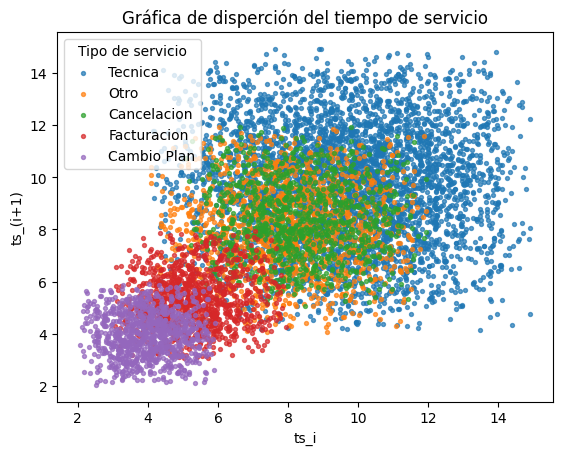

In [ ]:
for x in range(len(tiposervicio)):
  dispercion_sevicio(tiposervicio[x])
plt.legend(title="Tipo de servicio")
plt.xlabel("ts_i")
plt.ylabel("ts_(i+1)")
plt.title("Gráfica de disperción del tiempo de servicio")
plt.show()

In [ ]:
def scattercuadri_serv(Y,X):
  base=servicio[(servicio["TipoServ."]==Y)]
  x=len(base[(base['Cuadrilla']==X)]['min_servicio'])-1
  return plt.scatter(base[(base['Cuadrilla']==X)]['min_servicio'][:x], base[(base['Cuadrilla']==X)]['min_servicio'][1:],label=str(X),s=8,alpha=0.7)

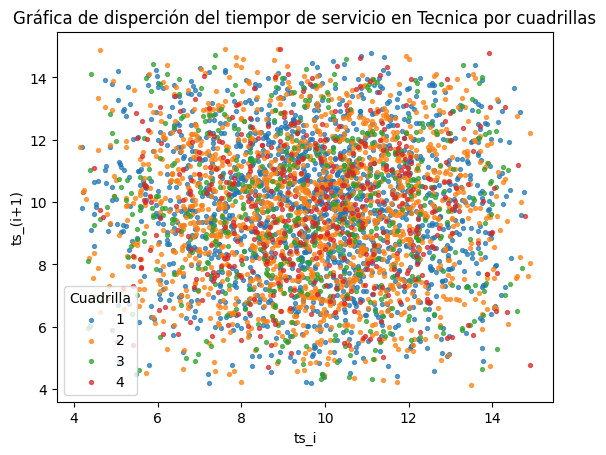

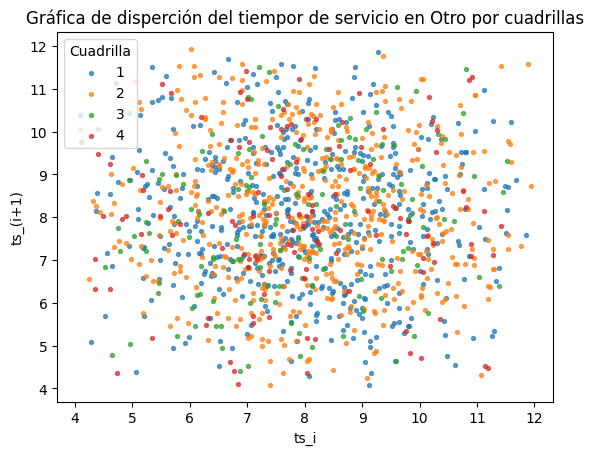

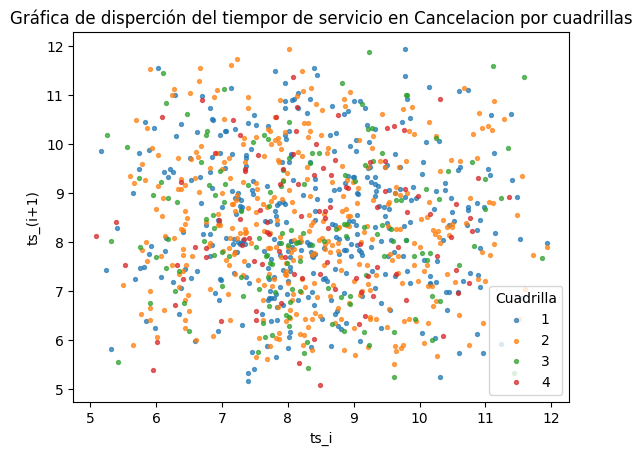

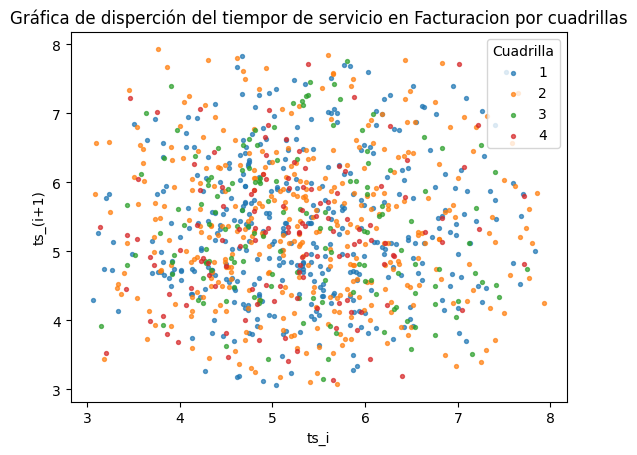

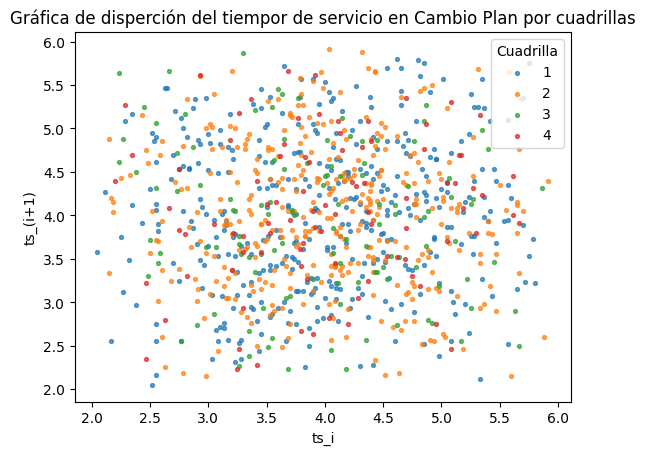

In [ ]:
cuadrillas=[1,2,3,4]
for i in tiposervicio:
  for x in cuadrillas:
    scattercuadri_serv(i,x)
  plt.legend(title="Cuadrilla")
  plt.xlabel("ts_i")
  plt.ylabel("ts_(i+1)")
  plt.title("Gráfica de disperción del tiempor de servicio en "+i+" por cuadrillas")
  plt.show()

In [ ]:
tecnica.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4205 entries, 0 to 8665
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Mes           4205 non-null   object 
 1   Turno         4205 non-null   int64  
 2   Cuadrilla     4205 non-null   int64  
 3   dia           4205 non-null   object 
 4   dia_mes       4205 non-null   int64  
 5   TipoServ.     4205 non-null   object 
 6   Servidor      4205 non-null   object 
 7   Estado        4205 non-null   object 
 8   min_servicio  4109 non-null   float64
 9   Inicio Serv.  4205 non-null   object 
 10  Fin Serv.     4205 non-null   object 
dtypes: float64(1), int64(3), object(7)
memory usage: 394.2+ KB


In [ ]:
servicio.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8666 entries, 0 to 8665
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Mes           8666 non-null   object 
 1   Turno         8666 non-null   int64  
 2   Cuadrilla     8666 non-null   int64  
 3   dia           8666 non-null   object 
 4   dia_mes       8666 non-null   int64  
 5   TipoServ.     8666 non-null   object 
 6   Servidor      8666 non-null   object 
 7   Estado        8666 non-null   object 
 8   min_servicio  8479 non-null   float64
 9   Inicio Serv.  8666 non-null   object 
 10  Fin Serv.     8666 non-null   object 
dtypes: float64(1), int64(3), object(7)
memory usage: 744.9+ KB


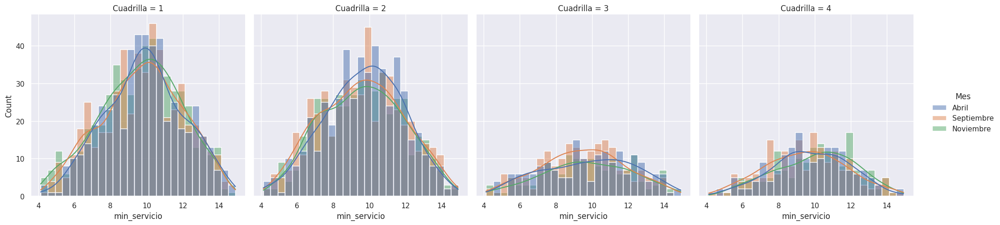

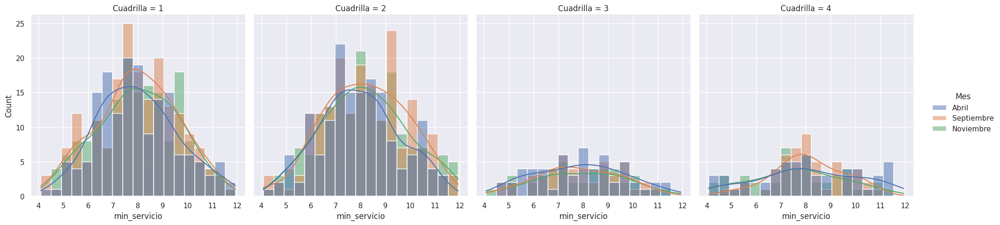

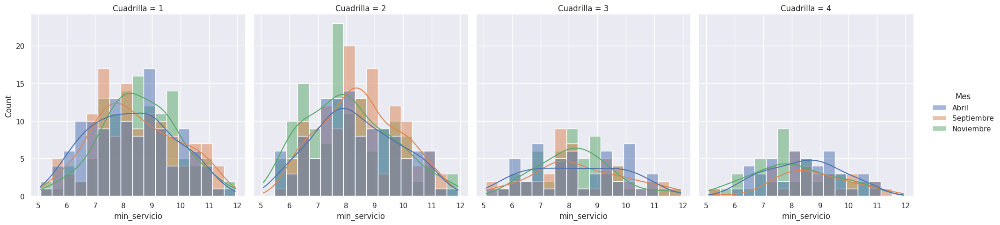

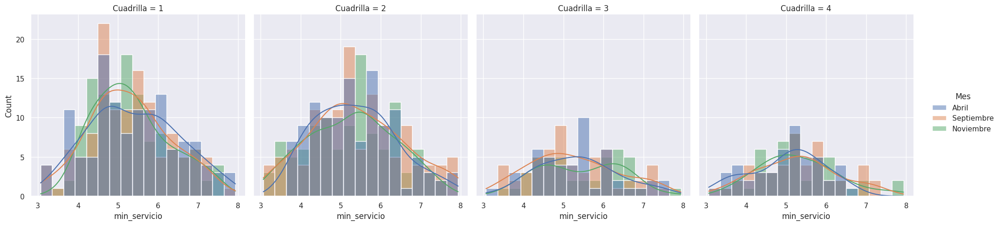

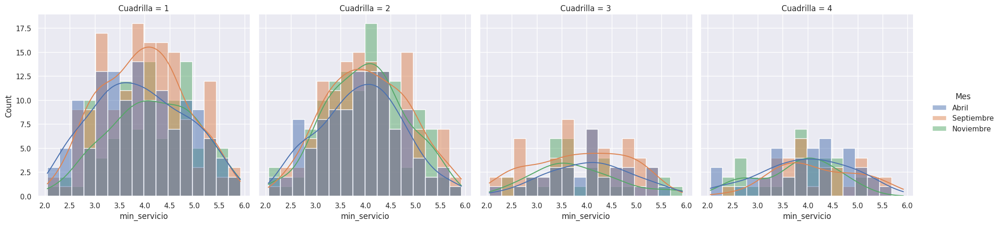

In [ ]:
%matplotlib inline
sns.set_theme()
for Y in tiposervicio:
  sns.displot(data=servicio[(servicio["TipoServ."]==Y)],x="min_servicio",col="Cuadrilla",hue="Mes",kde=True,)

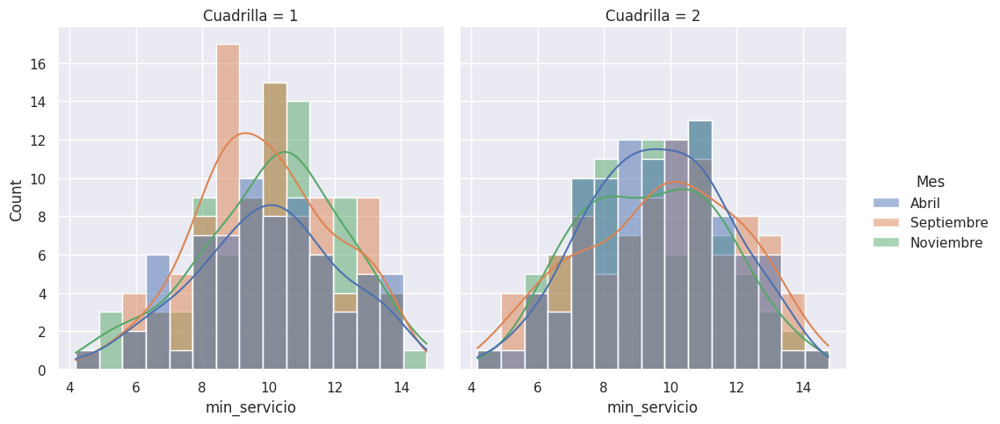

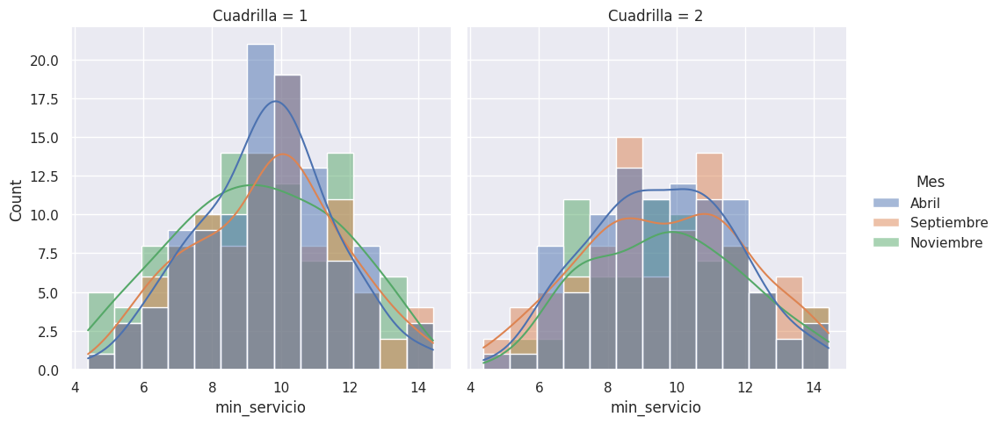

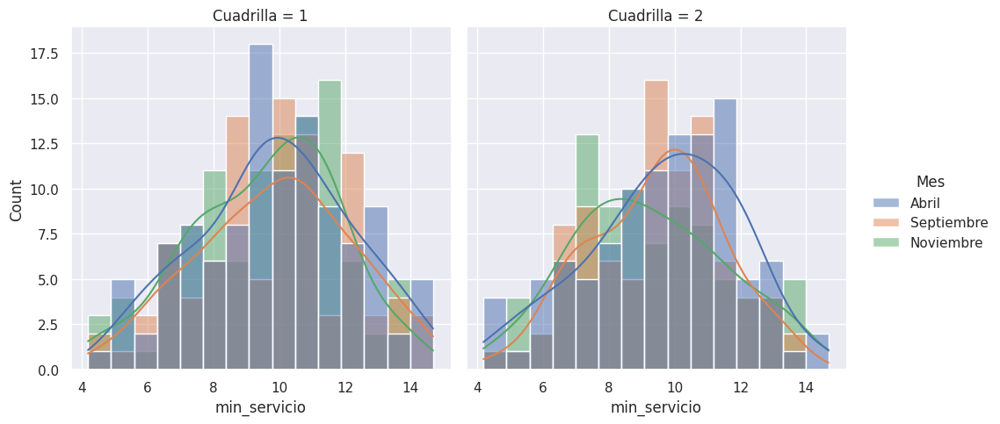

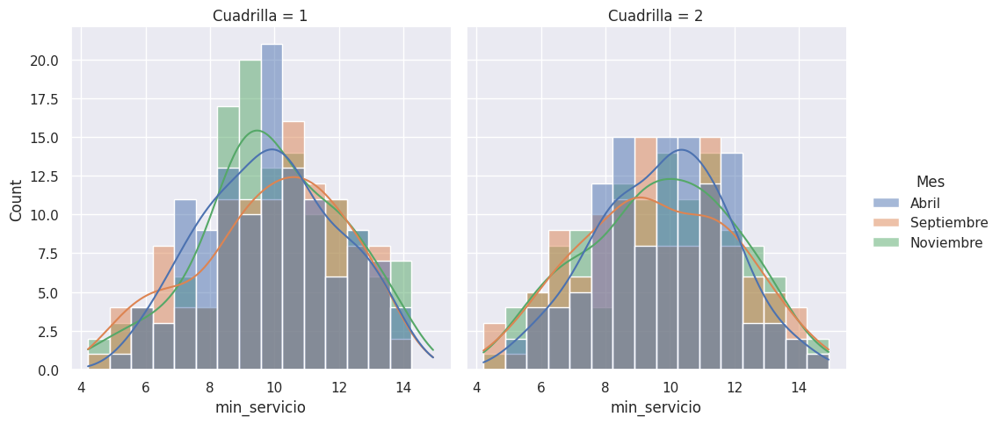

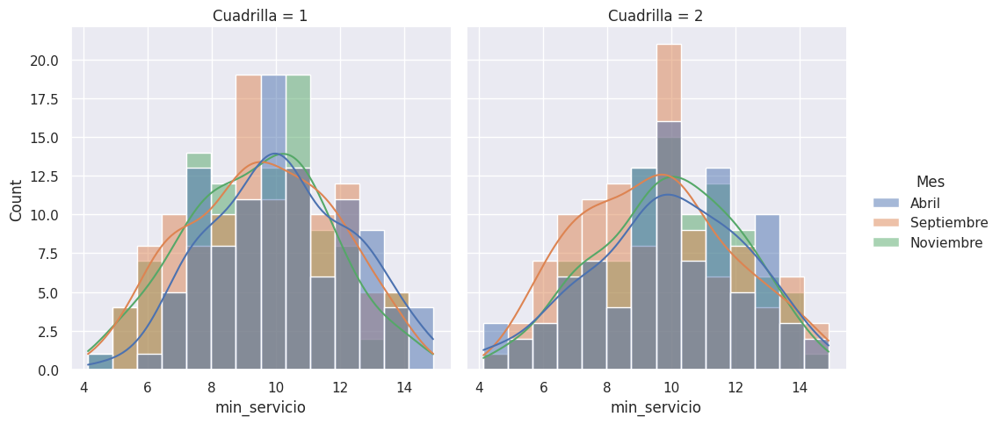

...

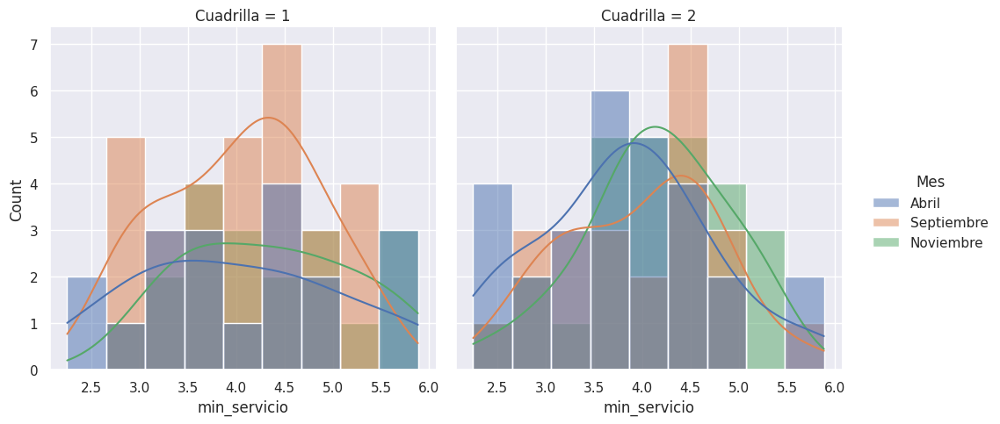

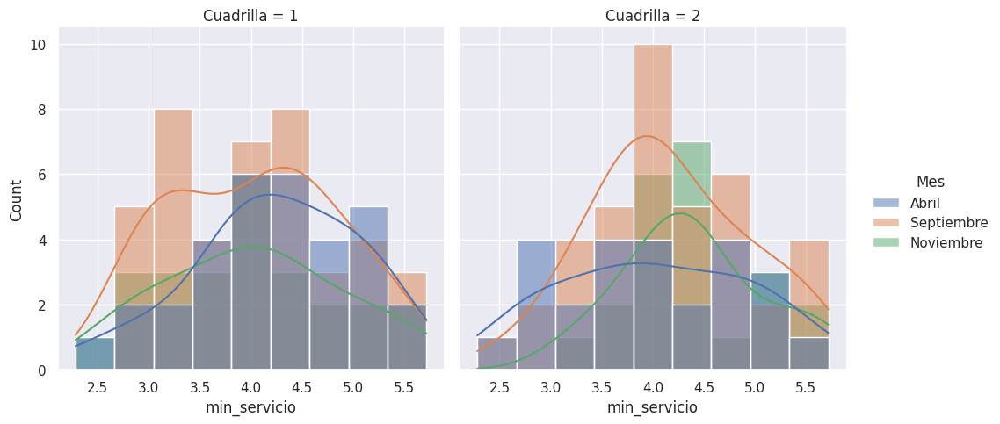

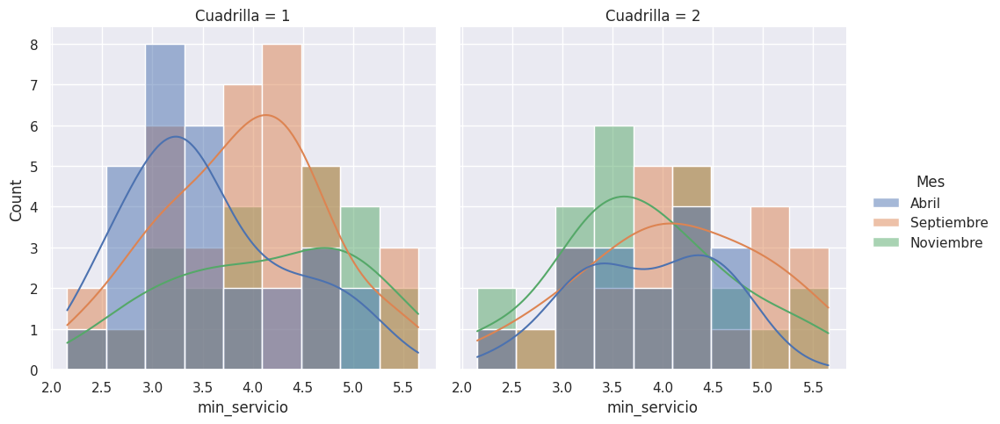

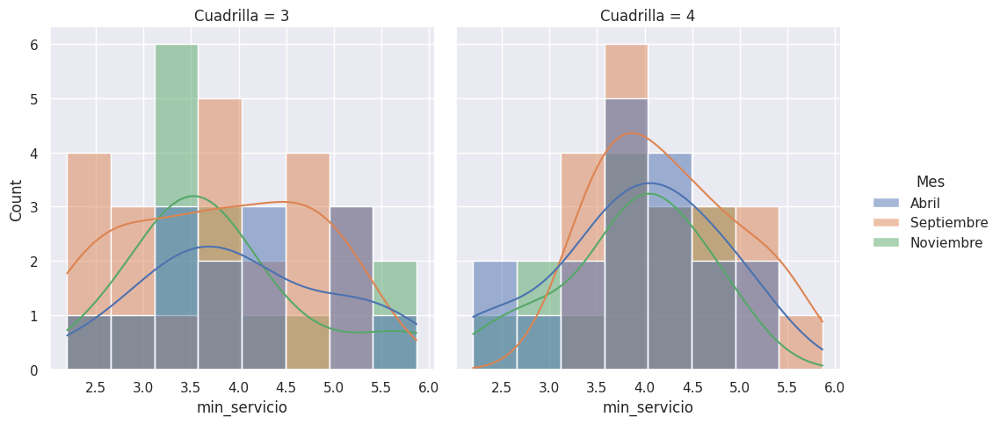

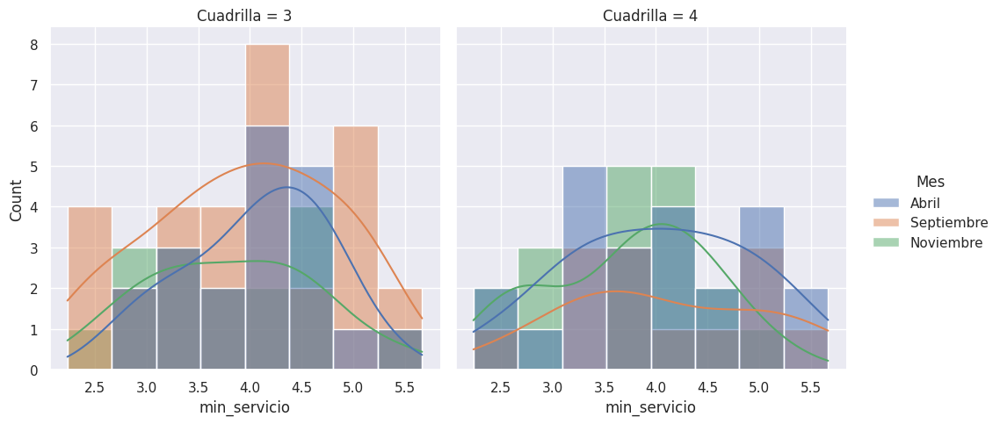

In [ ]:
dias=["Lunes","Martes","Miercoles","Jueves","Viernes","Sabado","Domingo"]
for Y in tiposervicio:
  for Z in dias:
    sns.displot(data=servicio[(servicio["TipoServ."]==Y)&(servicio['dia']==Z)],x="min_servicio",col="Cuadrilla",hue="Mes",kde=True,)

In [ ]:
servicio.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8666 entries, 0 to 8665
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Mes           8666 non-null   object 
 1   Turno         8666 non-null   int64  
 2   Cuadrilla     8666 non-null   int64  
 3   dia           8666 non-null   object 
 4   dia_mes       8666 non-null   int64  
 5   TipoServ.     8666 non-null   object 
 6   Servidor      8666 non-null   object 
 7   Estado        8666 non-null   object 
 8   min_servicio  8479 non-null   float64
 9   Inicio Serv.  8666 non-null   object 
 10  Fin Serv.     8666 non-null   object 
 11  num_dia       8666 non-null   int64  
dtypes: float64(1), int64(4), object(7)
memory usage: 812.6+ KB


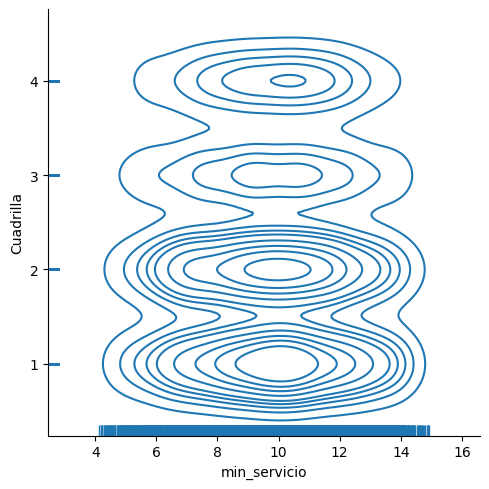

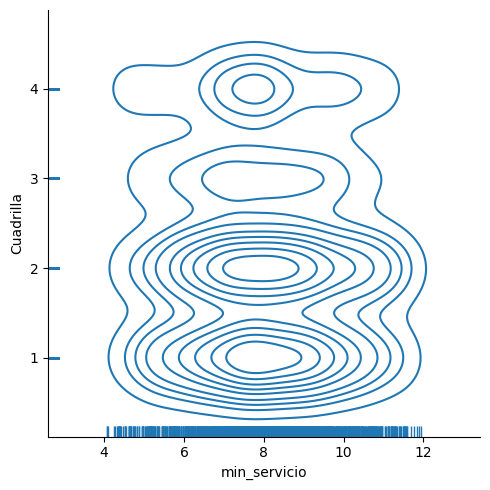

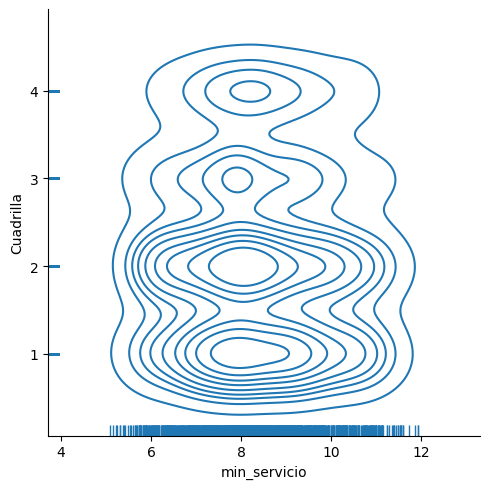

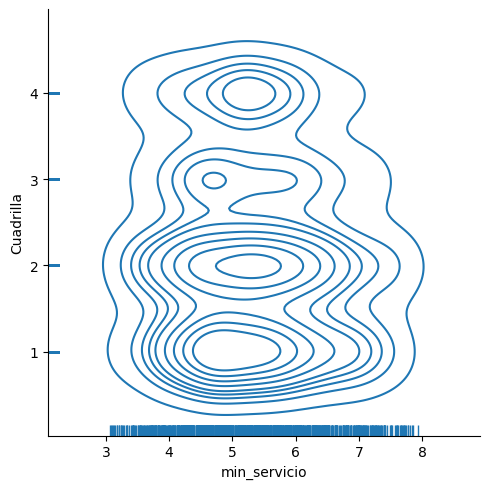

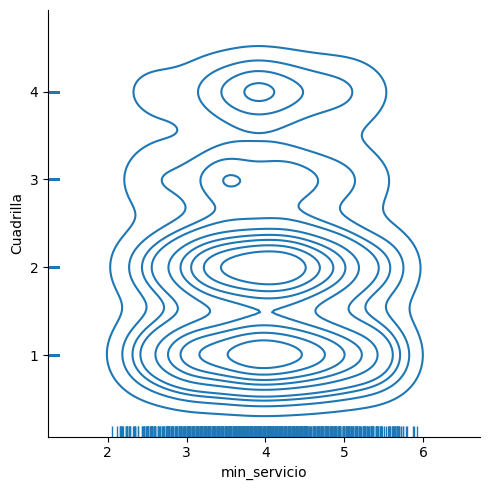

In [ ]:
for Y in tiposervicio:
  sns.displot(data=servicio[(servicio["TipoServ."]==Y)], x="min_servicio", y="Cuadrilla", kind="kde", rug=True)

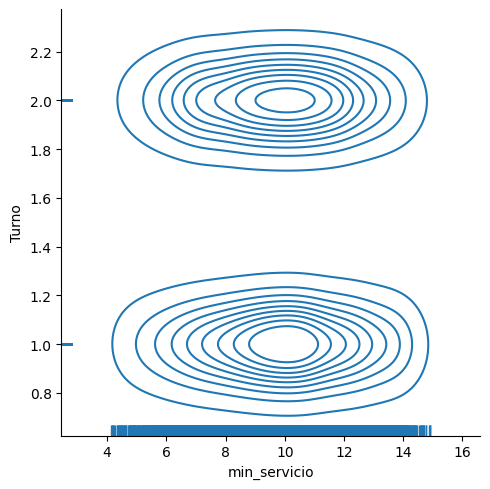

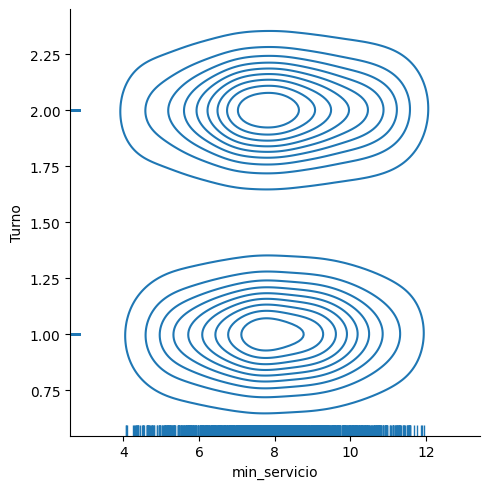

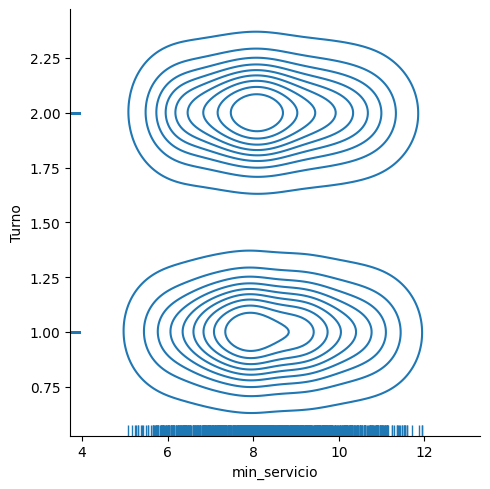

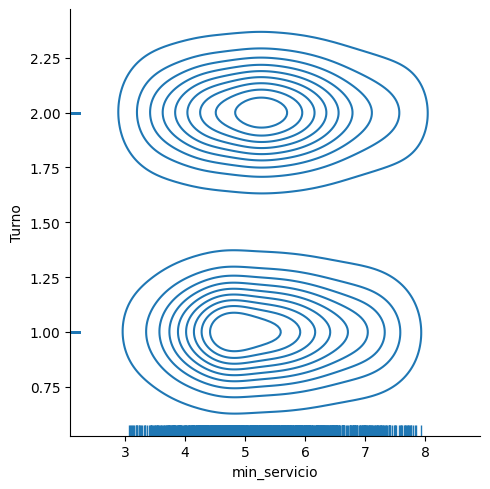

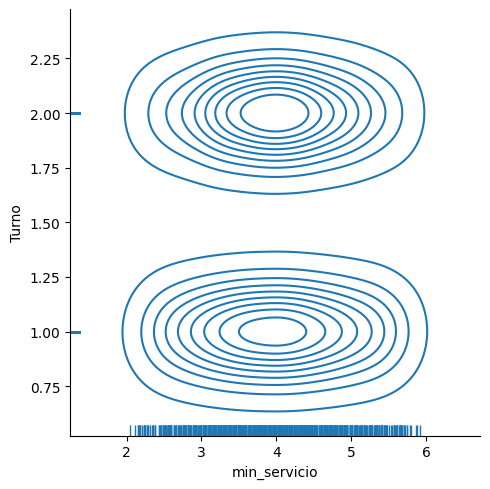

In [ ]:
for Y in tiposervicio:
  sns.displot(data=servicio[(servicio["TipoServ."]==Y)], x="min_servicio", y="Turno", kind="kde", rug=True)

In [ ]:
num=[]
for i in servicio['dia']:
  if i=="Lunes":
    num.append(1)
  elif i=="Martes":
    num.append(2)
  elif i=="Miercoles":
    num.append(3)
  elif i=="Jueves":
    num.append(4)
  elif i=="Sabado":
    num.append(6)
  elif i=="Viernes":
    num.append(5)
  elif i=="Domingo":
    num.append(7)

servicio['num_dia']=num

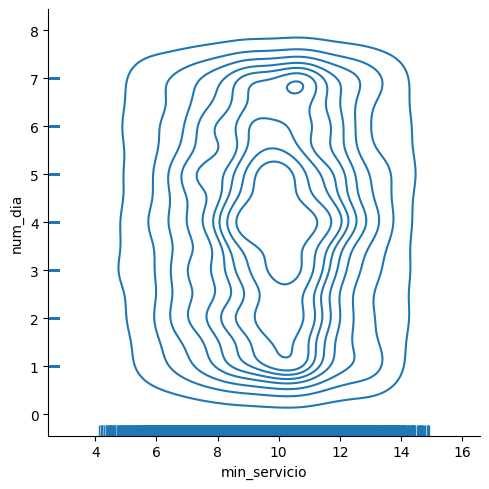

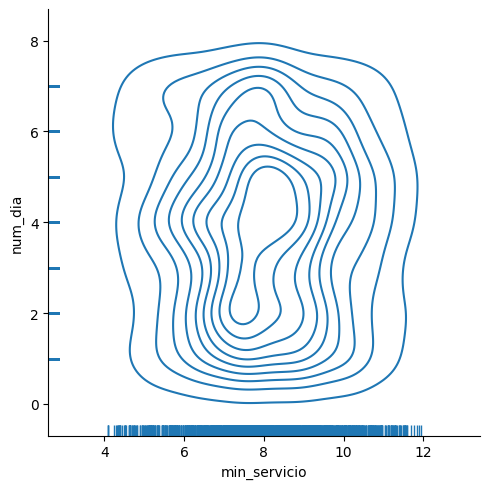

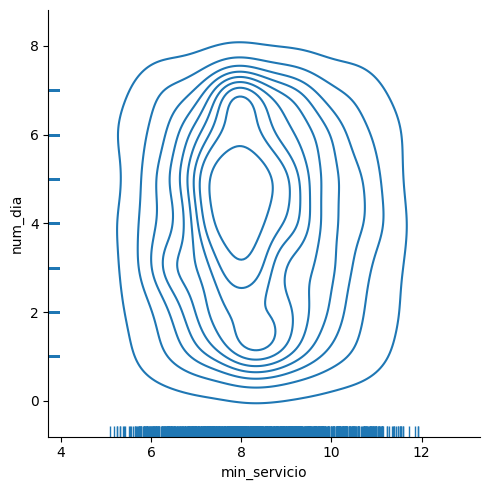

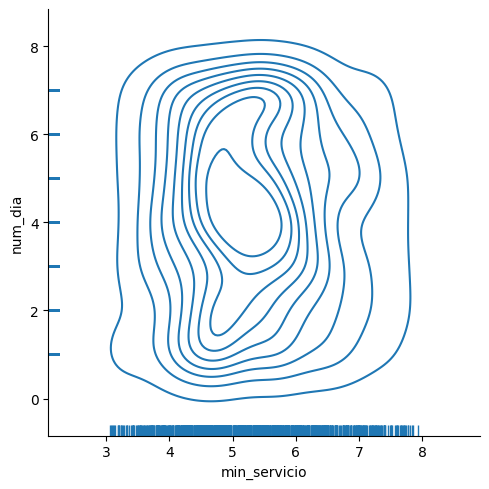

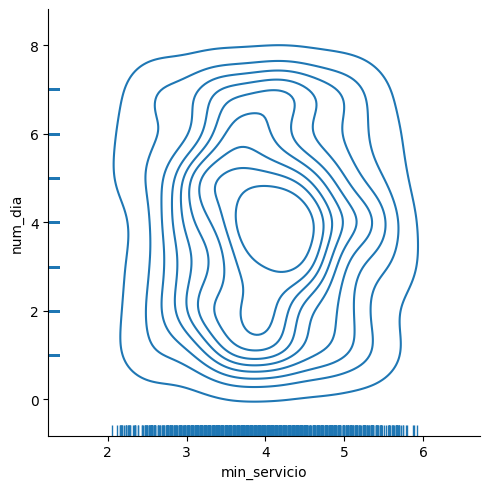

In [ ]:
for Y in tiposervicio:
  sns.displot(data=servicio[(servicio["TipoServ."]==Y)], x="min_servicio", y="num_dia", kind="kde", rug=True)

#Separando las bases, en los posibles cluesters Para Tasa de Servicio


In [ ]:
tecnica=servicio[(servicio["TipoServ."]=="Tecnica")]
cancelacion=servicio[(servicio["TipoServ."]=="Cancelacion")]
otro=servicio[(servicio["TipoServ."]=="Otro")]
facturacion=servicio[(servicio['TipoServ.']=="Facturacion")]
cambio_plan=servicio[(servicio['TipoServ.']=="Cambio Plan")]

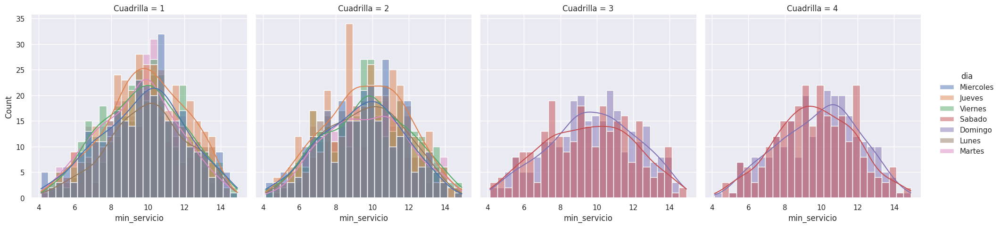

In [ ]:
%matplotlib inline
sns.set_theme()
sns.displot(data=tecnica,x="min_servicio",col="Cuadrilla",hue="dia",kde=True)

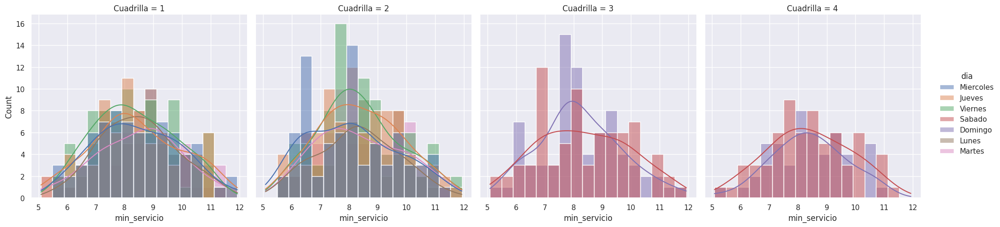

In [ ]:
sns.displot(data=cancelacion,x="min_servicio",col="Cuadrilla",hue="dia",kde=True)

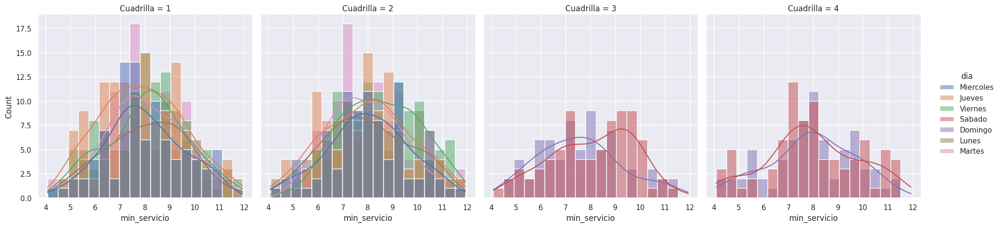

In [ ]:
sns.displot(data=otro,x="min_servicio",col="Cuadrilla",hue="dia",kde=True)

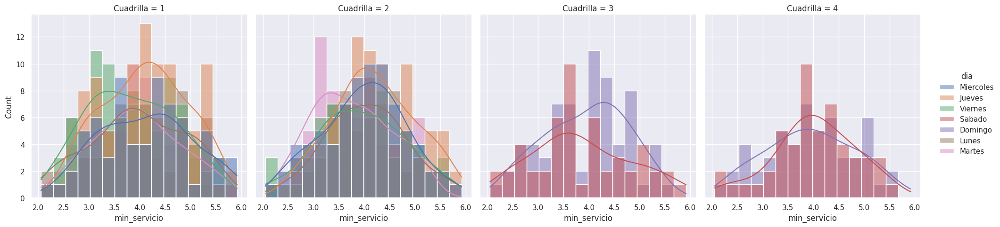

In [ ]:
sns.displot(data=cambio_plan,x="min_servicio",col="Cuadrilla",hue="dia",kde=True)

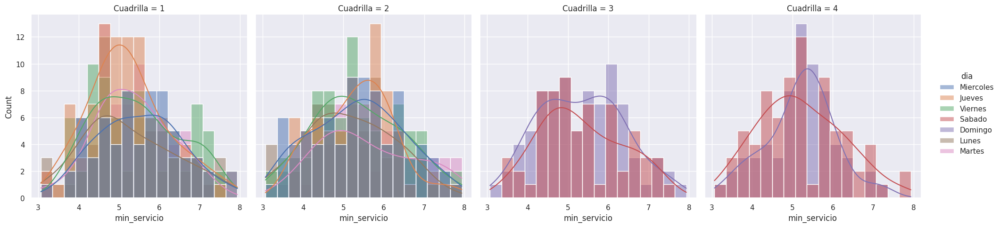

In [ ]:
sns.displot(data=facturacion,x="min_servicio",col="Cuadrilla",hue="dia",kde=True)

#Separando las bases, por servidor y turno


In [ ]:
tecnica_1=servicio[(servicio["TipoServ."]=="Tecnica")&(servicio["Turno"]==1)]
cancelacion_1=servicio[(servicio["TipoServ."]=="Cancelacion")&(servicio["Turno"]==1)]
otro_1=servicio[(servicio["TipoServ."]=="Otro")&(servicio["Turno"]==1)]
facturacion_1=servicio[(servicio['TipoServ.']=="Facturacion")&(servicio["Turno"]==1)]
cambio_plan_1=servicio[(servicio['TipoServ.']=="Cambio Plan")&(servicio["Turno"]==1)]

In [ ]:
tecnica_2=servicio[(servicio["TipoServ."]=="Tecnica")&(servicio["Turno"]==2)]
cancelacion_2=servicio[(servicio["TipoServ."]=="Cancelacion")&(servicio["Turno"]==2)]
otro_2=servicio[(servicio["TipoServ."]=="Otro")&(servicio["Turno"]==2)]
facturacion_2=servicio[(servicio['TipoServ.']=="Facturacion")&(servicio["Turno"]==2)]
cambio_plan_2=servicio[(servicio['TipoServ.']=="Cambio Plan")&(servicio["Turno"]==2)]

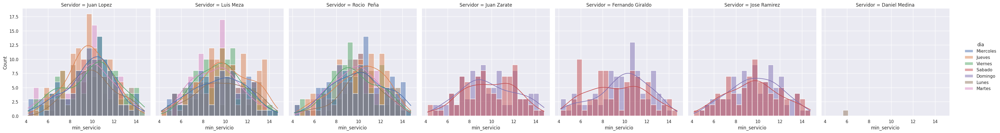

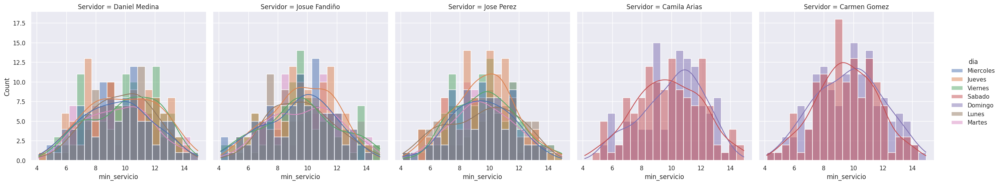

In [ ]:
sns.displot(data=tecnica_1,x="min_servicio",col="Servidor",hue="dia",kde=True)
sns.displot(data=tecnica_2,x="min_servicio",col="Servidor",hue="dia",kde=True)

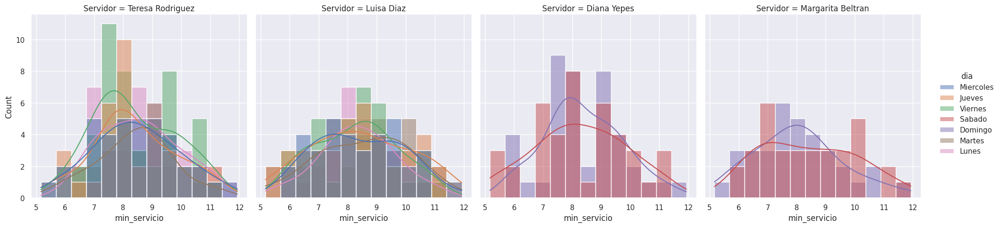

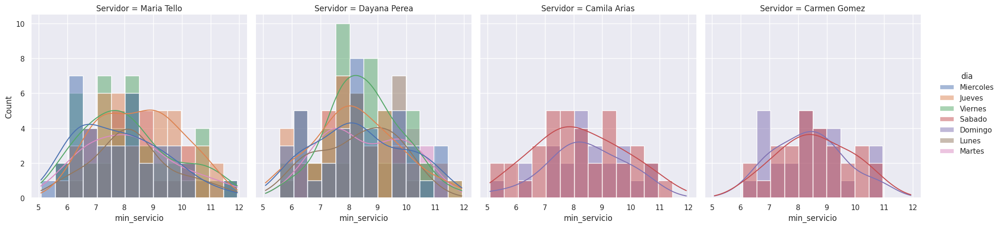

In [ ]:
sns.displot(data=cancelacion_1,x="min_servicio",col="Servidor",hue="dia",kde=True)
sns.displot(data=cancelacion_2,x="min_servicio",col="Servidor",hue="dia",kde=True)

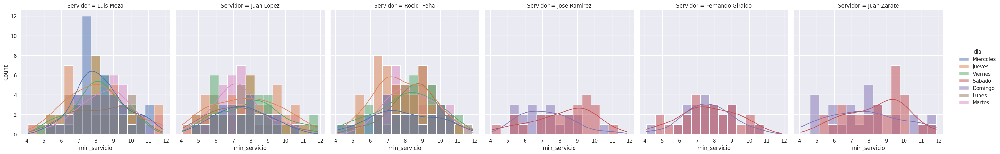

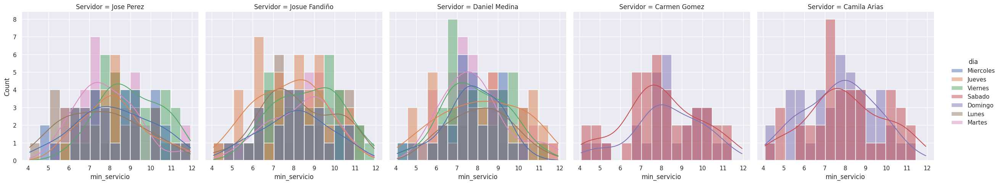

In [ ]:
sns.displot(data=otro_1,x="min_servicio",col="Servidor",hue="dia",kde=True)
sns.displot(data=otro_2,x="min_servicio",col="Servidor",hue="dia",kde=True)

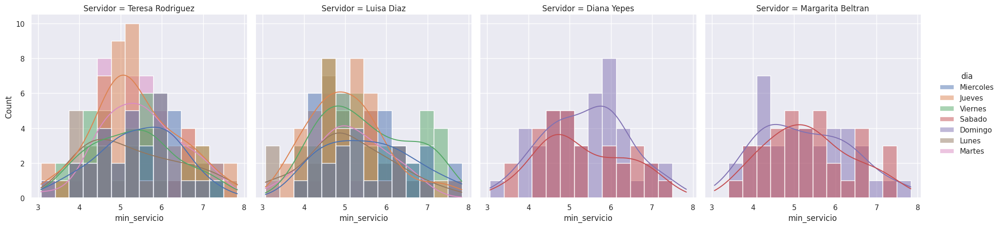

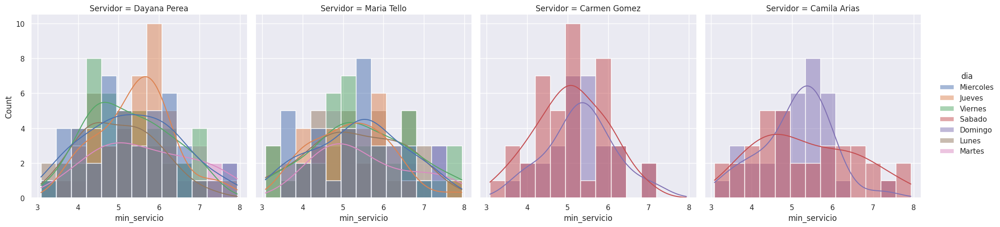

In [ ]:
sns.displot(data=facturacion_1,x="min_servicio",col="Servidor",hue="dia",kde=True)
sns.displot(data=facturacion_2,x="min_servicio",col="Servidor",hue="dia",kde=True)

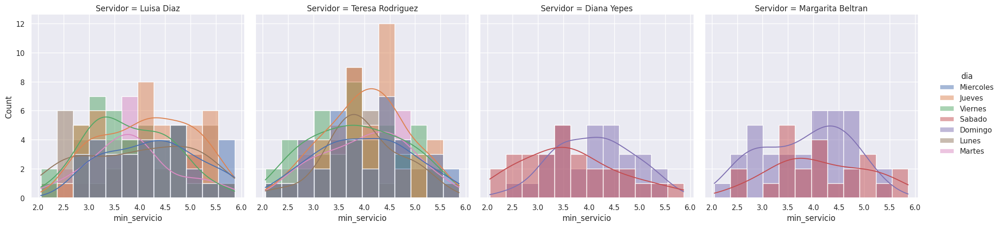

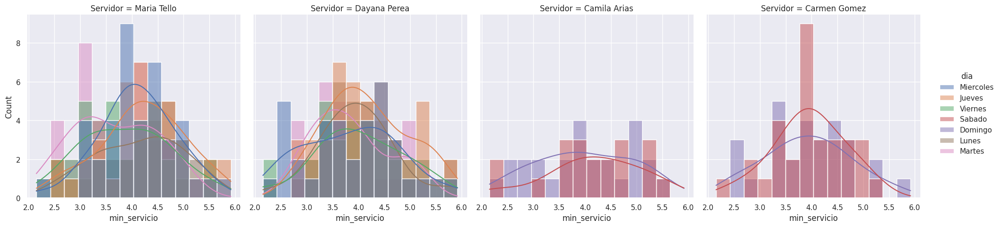

In [ ]:
sns.displot(data=cambio_plan_1,x="min_servicio",col="Servidor",hue="dia",kde=True)
sns.displot(data=cambio_plan_2,x="min_servicio",col="Servidor",hue="dia",kde=True)

In [ ]:
hora=[]
for i in cambio_plan_1['Inicio Serv.']:
  if i<=7:
    hora.append(1)

In [ ]:
cambio_plan_1.info()

ValueError: ignored

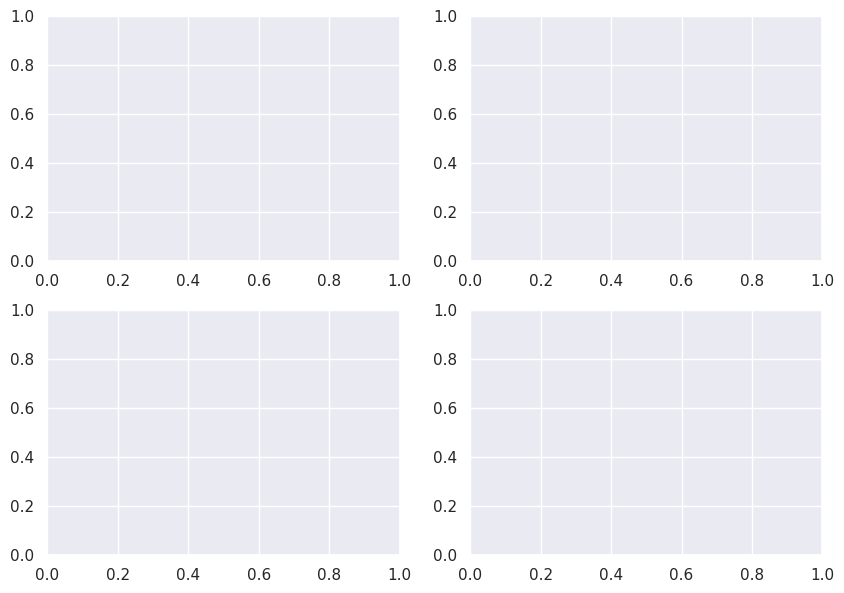

In [ ]:
# Gráficos de distribución
# ==============================================================================
fig, axs = plt.subplots(2, 2, figsize=(10, 7))

tiempo_entre_arribos = arribo.min_cliente
# Valores de la media (mu) y desviación típica (sigma) de cada grupo
mean, var, skew, kurt = expon.stats(tiempo_entre_arribos)
x = np.linspace(expon.ppf(0.01),expon.ppf(0.99), 100)
ax.plot(x, expon.pdf(x), 'r-', lw=5, alpha=0.6, label='expon pdf')
# Valores teóricos de la normal en el rango observado
x_hat = np.linspace(min(tiempo_entre_arribos), max(tiempo_entre_arribos), num=100)
y_hat = stats.exp.pdf(x_hat, mu, sigma)

# Gráfico distribución
axs[0, 0].plot(x_hat, y_hat, linewidth=2, label='normal')
axs[0, 0].hist(x=tiempo_entre_arribos, density=True, bins=20, color="#3182bd", alpha=0.5)
axs[0, 0].plot(tiempo_entre_arribos, np.full_like(tiempo_entre_arribos, -0.01), '|k', markeredgewidth=1)
axs[0, 0].set_title('Distribución peso (T.Arribos)')
axs[0, 0].set_xlabel('peso')
axs[0, 0].set_ylabel('Densidad de probabilidad')
axs[0, 0].legend()